In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata 
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt

import seaborn as sns
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

# Para pseudotime con PAGA (Scanpy tiene métodos similares a Monocle3)
import scanpy.external as sce

import palantir
import palantir.utils as utils
from sklearn.decomposition import PCA
from palantir.presults import compute_gene_trends

from pygam import GAM, s
from statsmodels.stats.multitest import multipletests
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist, squareform
import seaborn as sns

from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
SEED = 42
sc.settings.seed = SEED
np.random.seed(SEED)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

# The environment is in conda bash in Windows

In [3]:
import loompy
# 1. Abrir archivo loom
ds = loompy.connect("/lustre1/project/stg_00135/Cecilia/Data/SCENIC/all.both.patients_pySCENIC.loom", mode='r', validate=False)

# 2. Extraer matriz genes x células
X = ds[:, :]

# 3. Extraer metadatos de genes (rows)
var = pd.DataFrame({'Gene': ds.ra['Gene']})

# 4. Extraer metadatos de células (columns)
obs = pd.DataFrame({key: ds.ca[key] for key in ds.ca.keys()})

# 5. Guardar regulones (tuplas) en uns
regulons_tuples = ds.ra['Regulons']

ds.close()

# Para obs y var:
obs.index = obs.index.astype(str)
var.index = var.index.astype(str)
# 6. Crear objeto AnnData
adata = anndata.AnnData(X=X.T, var=var, obs=obs)

# 7. Guardar regulones en adata.uns
adata.uns['Regulons_tuples'] = regulons_tuples

# 8. Columnas complejas para mover a .obsm
cols_complex = ['Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC']

# 9. Mover columnas complejas de obs a obsm
for col in cols_complex:
    adata.obsm[col] = np.array(adata.obs[col].tolist(), dtype=object)  # FORMA CORRECTA
    del adata.obs[col]

# 10. Verificación
adata


AnnData object with n_obs × n_vars = 72733 × 26156
    obs: 'AvgDistanceToRef', 'CellID', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    var: 'Gene'
    uns: 'Regulons_tuples'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC'

In [4]:
adata.obs.set_index('CellID', inplace=True)
adata.var.set_index('Gene', inplace=True)

# Segmented cells from l1

In [90]:
cd4_adata = adata[adata.obs['predicted.celltype.l1'] == "CD4 T"].copy()

In [91]:
cd4_adata

AnnData object with n_obs × n_vars = 1216 × 14071
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample', 'leiden', 'leiden_res_0.30', 'leiden_res_0.50', 'leiden_res_0.60', 'cell_type_lvl1', 'CD69', 'HLA_DR', 'STAT1_ISG_score', 'TCR_activation_score', 'Proliferation_score', 'IL1_response_score', 'Exhaustion_score', 'Senescence_score', 'Th17_score', 'Th1_score', 'Glycolysis_score', 'Lipid_oxidation_score', 'Central_memory_score', 'Effector_memory_score', 'STAT_inhibitors_score', 'DNA_damage_score', 'quadrant', 'memory_quadrant', 'palantir_pseudotime', 'palantir_entropy', 'pseudotime'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Regulons_tuples', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'subsample_colors', 'leiden', 'leiden_colors', 'leiden_res_0.30', 'leiden_res_0.50', 'leiden_res_0.60', 'leiden_res_0.30_colors', 'leiden_res_0.50_col

# Select the patient

In [92]:
# Para el paciente P116RS
adata_p116 = cd4_adata[cd4_adata.obs["subsample"].str.contains("P116RS")].copy()

In [93]:
adata_p116

AnnData object with n_obs × n_vars = 1216 × 14071
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample', 'leiden', 'leiden_res_0.30', 'leiden_res_0.50', 'leiden_res_0.60', 'cell_type_lvl1', 'CD69', 'HLA_DR', 'STAT1_ISG_score', 'TCR_activation_score', 'Proliferation_score', 'IL1_response_score', 'Exhaustion_score', 'Senescence_score', 'Th17_score', 'Th1_score', 'Glycolysis_score', 'Lipid_oxidation_score', 'Central_memory_score', 'Effector_memory_score', 'STAT_inhibitors_score', 'DNA_damage_score', 'quadrant', 'memory_quadrant', 'palantir_pseudotime', 'palantir_entropy', 'pseudotime'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Regulons_tuples', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'subsample_colors', 'leiden', 'leiden_colors', 'leiden_res_0.30', 'leiden_res_0.50', 'leiden_res_0.60', 'leiden_res_0.30_colors', 'leiden_res_0.50_col

In [94]:
del adata, cd4_adata, X, obs, var, cols_complex, regulons_tuples

NameError: name 'obs' is not defined

In [95]:
adata_p116 = adata_p116[adata_p116.obs["predicted.celltype.l2"] != "CD14 Mono"].copy()
adata_p116 = adata_p116[adata_p116.obs["predicted.celltype.l2"] != "CD8 Naive"].copy()
adata_p116 = adata_p116[adata_p116.obs["predicted.celltype.l2"] != "CD8 TCM"].copy()
adata_p116 = adata_p116[adata_p116.obs["predicted.celltype.l2"] != "CD8 TEM"].copy()
adata_p116 = adata_p116[adata_p116.obs["predicted.celltype.l2"] != "CD4 CTL"].copy()

adata_p116.obs["predicted.celltype.l2"].value_counts()

predicted.celltype.l2
CD4 TCM              758
CD4 Naive            268
CD4 TEM              100
Treg                  52
dnT                   24
CD4 Proliferating     13
Platelet               1
Name: count, dtype: int64

In [96]:
# check if CD14 gene is in var
if "CD14" in adata_p116.var_names:
    # keep the cells that do not express CD14
    adata_p116 = adata_p116[adata_p116[:, "CD14"].X.toarray().flatten() == 0, :].copy()
else:
    print("El gen CD14 no está en adata_p116.var_names")
# check if CD14 gene is in var
if "CD8A" in adata_p116.var_names:
    # keep the cells that do not express CD14
    adata_p116 = adata_p116[adata_p116[:, "CD8A"].X.toarray().flatten() == 0, :].copy()
else:
    print("El gen CD8 no está en adata_p116.var_names")
if "CD8B" in adata_p116.var_names:
    # keep the cells that do not express CD14
    adata_p116 = adata_p116[adata_p116[:, "CD8B"].X.toarray().flatten() == 0, :].copy()
else:
    print("El gen CD8 no está en adata_p116.var_names")

El gen CD14 no está en adata_p116.var_names
El gen CD8 no está en adata_p116.var_names
El gen CD8 no está en adata_p116.var_names


In [97]:
adata_p116 = adata_p116[adata_p116.obs["percent.mito"] <= 5].copy()

<Axes: >

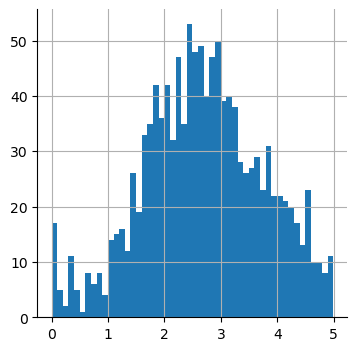

In [98]:
adata_p116.obs["percent.mito"].hist(bins=50)

In [99]:
sc.pp.filter_genes(adata_p116, min_cells=3)

In [100]:
# Normalizing to median total counts
sc.pp.normalize_total(adata_p116)
# Logarithmize the data
sc.pp.log1p(adata_p116)

normalizing counts per cell
    finished (0:00:00)


In [101]:
sc.pp.highly_variable_genes(adata_p116, flavor="seurat", n_top_genes=1500)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [102]:
sc.pp.pca(adata_p116, n_comps=50)

computing PCA
    with n_comps=50
    finished (0:00:00)


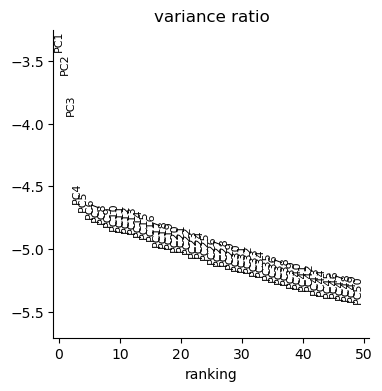

In [103]:
sc.pl.pca_variance_ratio(adata_p116, n_pcs=50, log=True)

In [104]:
sc.pp.neighbors(adata_p116, n_pcs=10)
sc.tl.umap(adata_p116)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:02)


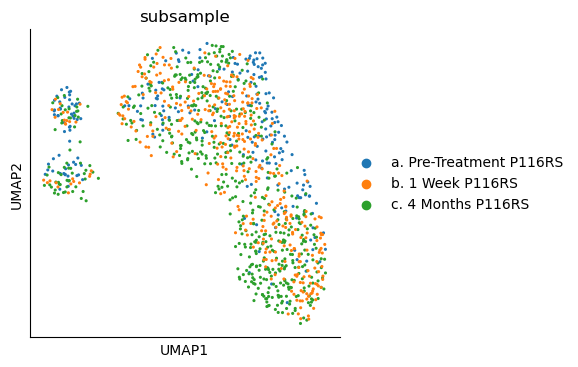

In [105]:
sc.settings.figdir = "/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/"
sc.pl.umap(
    adata_p116,
    color="subsample",
    # Setting a smaller point size to get prevent overlap
    size=20, save="_subsample.pdf"
)

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


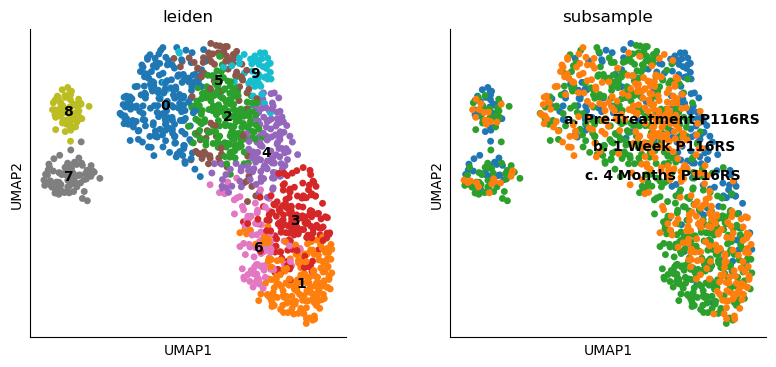

In [106]:
sc.tl.leiden(adata_p116, resolution = 1.0)
sc.pl.umap(adata_p116, color=["leiden", "subsample"], legend_loc="on data")

In [107]:
for res in [0.3, 0.5, 0.6]:
    sc.tl.leiden(adata_p116, resolution=res, key_added=f"leiden_res_{res:.2f}")

running Leiden clustering
    finished: found 3 clusters and added
    'leiden_res_0.30', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.60', the cluster labels (adata.obs, categorical) (0:00:00)


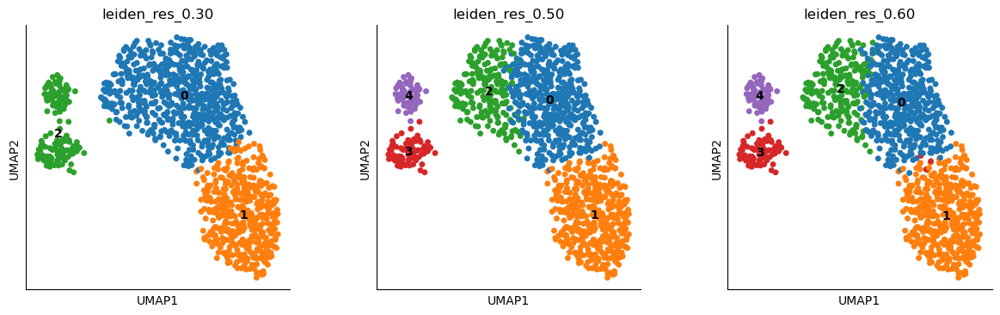

In [108]:
sc.pl.umap(
    adata_p116,
    color=["leiden_res_0.30", "leiden_res_0.50", "leiden_res_0.60"],
    legend_loc="on data",
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


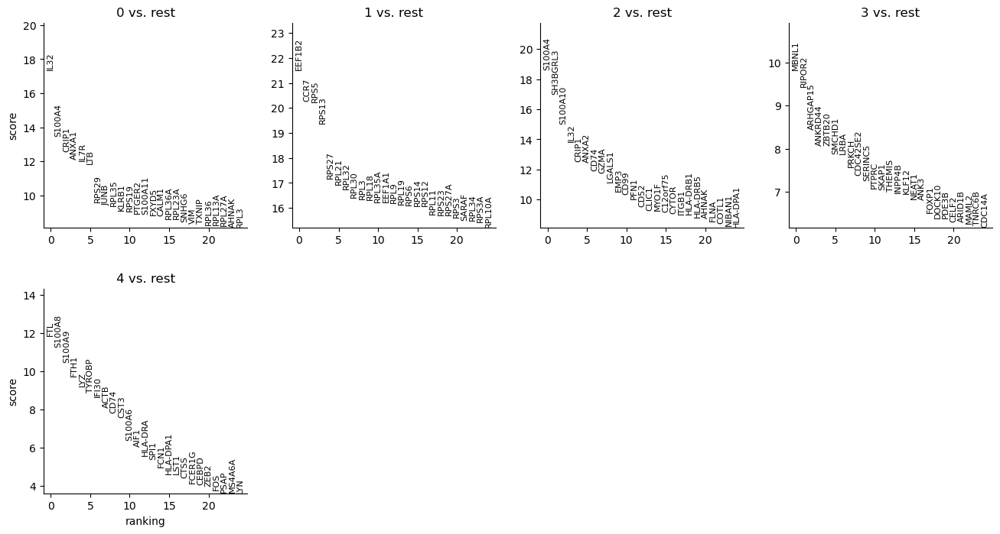

In [109]:
sc.tl.rank_genes_groups(adata_p116, "leiden_res_0.60", method="t-test")
sc.pl.rank_genes_groups(adata_p116, n_genes=25, sharey=False)

In [110]:
sc.tl.rank_genes_groups(adata_p116, groupby="leiden_res_0.60", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


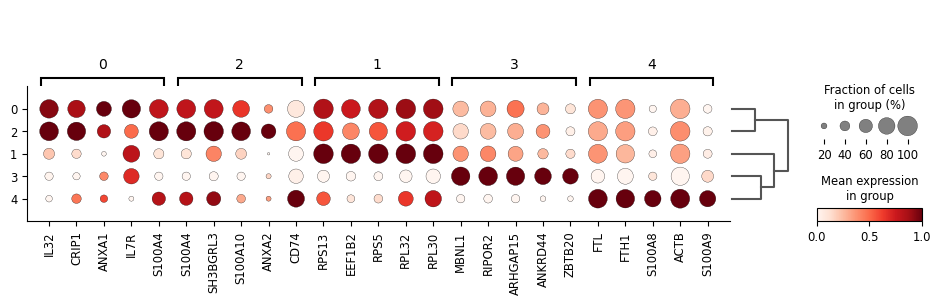

In [111]:
sc.pl.rank_genes_groups_dotplot(adata_p116, groupby="leiden_res_0.60", standard_scale="var", n_genes=5)

In [112]:
sc.get.rank_genes_groups_df(adata_p116, group="2").head(30)

,names,scores,logfoldchanges,pvals,pvals_adj
0,S100A4,13.983665,1.232053,1.961226e-44,2.759641e-40
1,SH3BGRL3,12.766616,0.837084,2.518688e-37,5.906744e-34
2,S100A10,12.403378,1.191413,2.505371e-35,3.806327e-32
3,ANXA2,11.495227,2.079777,1.394146e-30,8.173764e-28
4,CD74,11.388056,0.820972,4.795720e-30,2.595407e-27
5,IL32,10.650797,1.024008,1.728796e-26,6.757191e-24
6,CRIP1,10.493598,1.094958,9.243993e-26,3.251806e-23
7,GZMA,10.415646,3.188857,2.103657e-25,6.577901e-23
8,LGALS1,10.406481,2.305547,2.316261e-25,7.085242e-23
9,PFN1,10.243892,0.431987,1.260616e-24,3.620026e-22


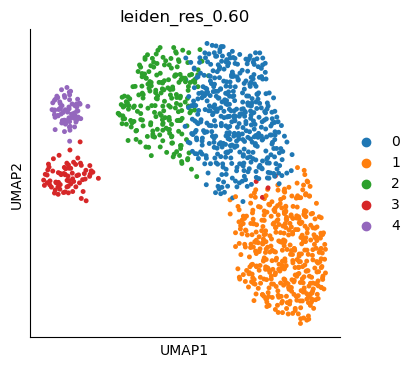

In [113]:
sc.pl.umap(
    adata_p116,
    color=["leiden_res_0.60"],
    size=50,
    wspace=0.5,       
    ncols=2           
)

In [114]:
adata_p116.obs["cell_type_lvl1"] = adata_p116.obs["leiden_res_0.60"].map(
    {
        "0": "Naive",
        "1": "TCM",
        "2": "TEM",
        "3": "Teff",
        "4": "Teff"
    }
)



In [115]:
adata_p116.obs["cell_type_lvl1"].value_counts()


cell_type_lvl1
Naive    437
TCM      422
TEM      211
Teff     146
Name: count, dtype: int64

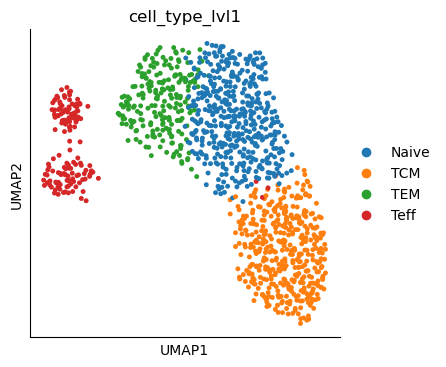

In [116]:
sc.pl.umap(adata_p116, color="cell_type_lvl1", size=50, save = "_celltypelvl1_res.30.pdf", show=True)

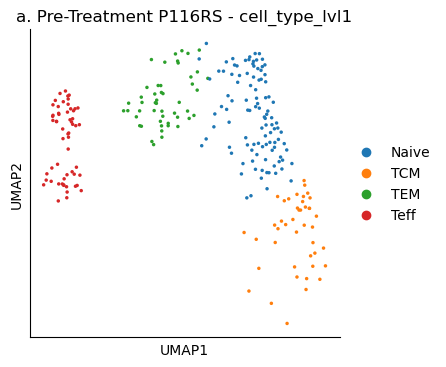

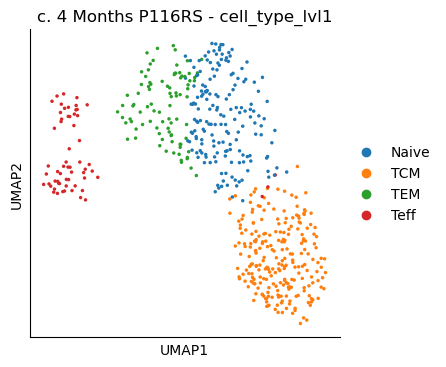

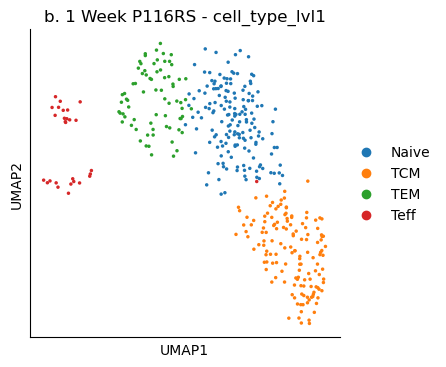

In [117]:
# Asegúrate de reemplazar 'subsample' con el nombre real de la columna
# que identifica las submuestras en adata_p116.obs
subsample_col = 'subsample'

# Itera sobre cada submuestra y genera un UMAP
for sample in adata_p116.obs[subsample_col].unique():
    adata_sub = adata_p116[adata_p116.obs[subsample_col] == sample]
    
    # Genera el UMAP coloreado por cell_type_lvl1
    sc.pl.umap(
        adata_sub,
        color="cell_type_lvl1",
        legend_loc='right margin',
        size=25,
        title=f"{sample} - cell_type_lvl1",
        save=f"_P116_{sample}_celltypes_lvl1_umap.pdf"
    )

In [118]:
import pandas as pd
counts = pd.crosstab(adata_p116.obs['cell_type_lvl1'], adata_p116.obs['subsample'], dropna=False)
counts

subsample,a. Pre-Treatment P116RS,b. 1 Week P116RS,c. 4 Months P116RS
cell_type_lvl1,,,
Naive,104,162,171
TCM,43,141,238
TEM,49,73,89
Teff,57,28,61


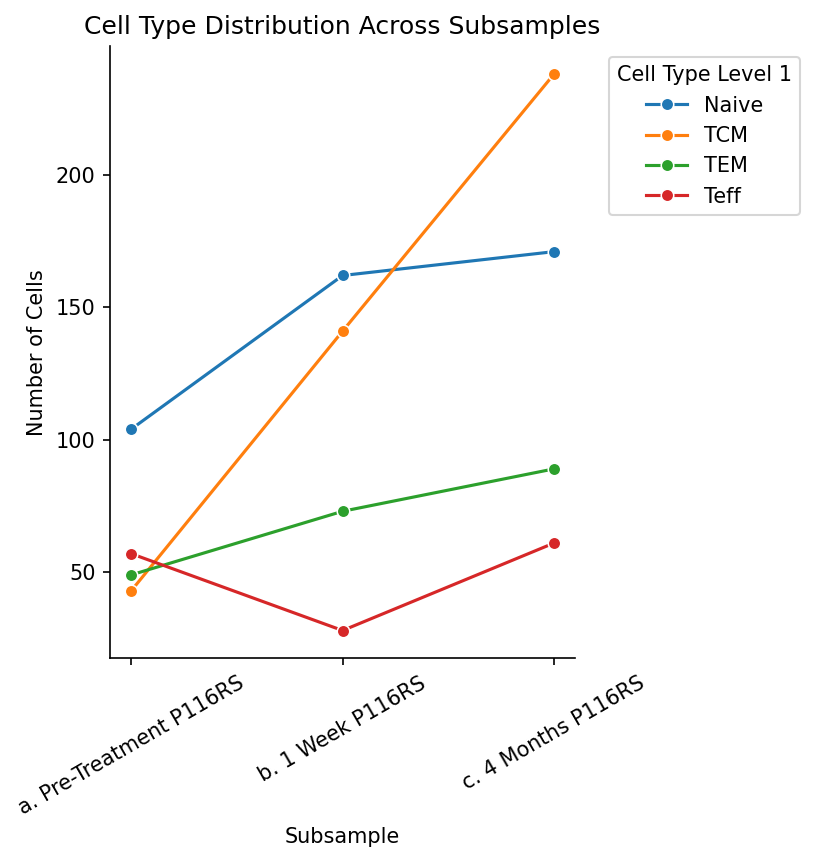

In [119]:
long_counts = counts.reset_index().melt(id_vars='cell_type_lvl1', var_name='subsample', value_name='n_cells')
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(4, 6), dpi=150)
ax = sns.lineplot(data=long_counts, x='subsample', y='n_cells', hue='cell_type_lvl1', marker='o', errorbar=None, ax=ax)

ax.set_xlabel("Subsample")
ax.set_ylabel("Number of Cells")
ax.tick_params(axis='x', rotation=30, labelsize=10)
ax.set_title("Cell Type Distribution Across Subsamples")
ax.legend(title="Cell Type Level 1", bbox_to_anchor=(1.05, 1), loc='best')


fig.subplots_adjust(bottom=0.2)
fig.savefig("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/P116_CD4_celltype_distribution_across_subsamples.pdf", bbox_inches='tight')

Mean expression of EIF1:
  CD4 T: 0.810
Mean expression of STAT1:
  CD4 T: 0.411
Mean expression of CCR7:
  CD4 T: 0.288
Mean expression of IL7R:
  CD4 T: 0.702
Mean expression of TCF7:
  CD4 T: 0.515
Mean expression of JUN:
  CD4 T: 0.046
Mean expression of NFKBIA:
  CD4 T: 0.308
Mean expression of TNFAIP3:
  CD4 T: 0.198
Mean expression of ZFP36:
  CD4 T: 0.265
Mean expression of CD3G:
  CD4 T: 0.288
Mean expression of IFITM1:
  CD4 T: 0.855
Mean expression of IRF1:
  CD4 T: 0.353
Mean expression of PARP9:
  CD4 T: 0.072


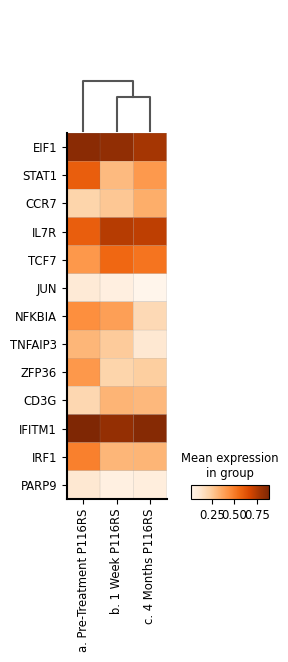

In [120]:
import pandas as pd
import scanpy as sc

genes = ['EIF1', 'STAT1', 'CCR7', 'IL7R', 'TCF7', 'JUN', 'NFKBIA', 'TNFAIP3', 'ZFP36', 'CD3G', 'IFITM1', 'IRF1', 'PARP9']

# Calculate mean expression per gene per timepoint
mean_expr = {}
for gene in genes:
    means = []
    for tp in sorted(adata_p116.obs['predicted.celltype.l1'].unique()):
        cells_tp = adata_p116.obs.index[adata_p116.obs['predicted.celltype.l1'] == tp]
        expr_vals = adata_p116[cells_tp, gene].X
        if hasattr(expr_vals, "toarray"):
            expr_vals = expr_vals.toarray()
        mean_val = expr_vals.mean()
        means.append((tp, mean_val))
    mean_expr[gene] = means

# Print the mean expression per gene per timepoint
for gene, means in mean_expr.items():
    print(f"Mean expression of {gene}:")
    for tp, mean_val in means:
        print(f"  {tp}: {mean_val:.3f}")

# Now plot matrixplot as you wrote
sc.pl.matrixplot(
    adata_p116,
    var_names=genes,
    groupby="subsample",
    standard_scale="none",    # z-score genes for comparability
    cmap="Oranges",
    dendrogram=True,
    swap_axes=True,
    save="Markers_Celltype.pdf"
)


In [121]:
# Extract marker genes as metadata columns
if 'CD69' in adata_p116.var_names:
    idx = adata_p116.var_names.get_loc('CD69')
    if hasattr(adata_p116.X, 'toarray'):  # Sparse matrix
        adata_p116.obs['CD69'] = adata_p116.X[:, idx].toarray().flatten()
    else:  # Dense matrix
        adata_p116.obs['CD69'] = adata_p116.X[:, idx].flatten()
    print("✓ CD69 extracted")

if 'CD25' in adata_p116.var_names:
    idx = adata_p116.var_names.get_loc('CD25')
    if hasattr(adata_p116.X, 'toarray'):
        adata_p116.obs['CD25'] = adata_p116.X[:, idx].toarray().flatten()
    else:
        adata_p116.obs['CD25'] = adata_p116.X[:, idx].flatten()
    print("✓ CD25 extracted")

# HLA-DR might be HLA-DRA, HLA-DRB1, etc.
hla_candidates = [name for name in adata_p116.var_names if 'HLA' in name and 'DR' in name]
if hla_candidates:
    hla_gene = hla_candidates[0]
    idx = adata_p116.var_names.get_loc(hla_gene)
    if hasattr(adata_p116.X, 'toarray'):
        adata_p116.obs['HLA_DR'] = adata_p116.X[:, idx].toarray().flatten()
    else:
        adata_p116.obs['HLA_DR'] = adata_p116.X[:, idx].flatten()
    print(f"✓ HLA-DR extracted (using {hla_gene})")


✓ CD69 extracted
✓ HLA-DR extracted (using HLA-DRA)


COMPREHENSIVE STAT1-GOF ANALYSIS - ALL SIGNATURES

Dataset: 1216 cells

✓ Found 'subsample' column
  Subsamples: [np.str_('a. Pre-Treatment P116RS'), np.str_('c. 4 Months P116RS'), np.str_('b. 1 Week P116RS')]

DEFINING GENE SIGNATURES

Total signatures defined: 14
  - STAT1_ISG
  - TCR_activation
  - Proliferation
  - IL1_response
  - Exhaustion
  - Senescence
  - Th17
  - Th1
  - Glycolysis
  - Lipid_oxidation
  - Central_memory
  - Effector_memory
  - STAT_inhibitors
  - DNA_damage

SCORING GENE SIGNATURES
  ✓ STAT1_ISG: Already scored
  ✓ TCR_activation: Already scored
  ✓ Proliferation: Already scored
  ✓ IL1_response: Already scored
  ✓ Exhaustion: Already scored
  ✓ Senescence: Already scored
  ✓ Th17: Already scored
  ✓ Th1: Already scored
  ✓ Glycolysis: Already scored
  ✓ Lipid_oxidation: Already scored
  ✓ Central_memory: Already scored
  ✓ Effector_memory: Already scored
  ✓ STAT_inhibitors: Already scored
  ✓ DNA_damage: Already scored

Successfully scored: 14 signatures



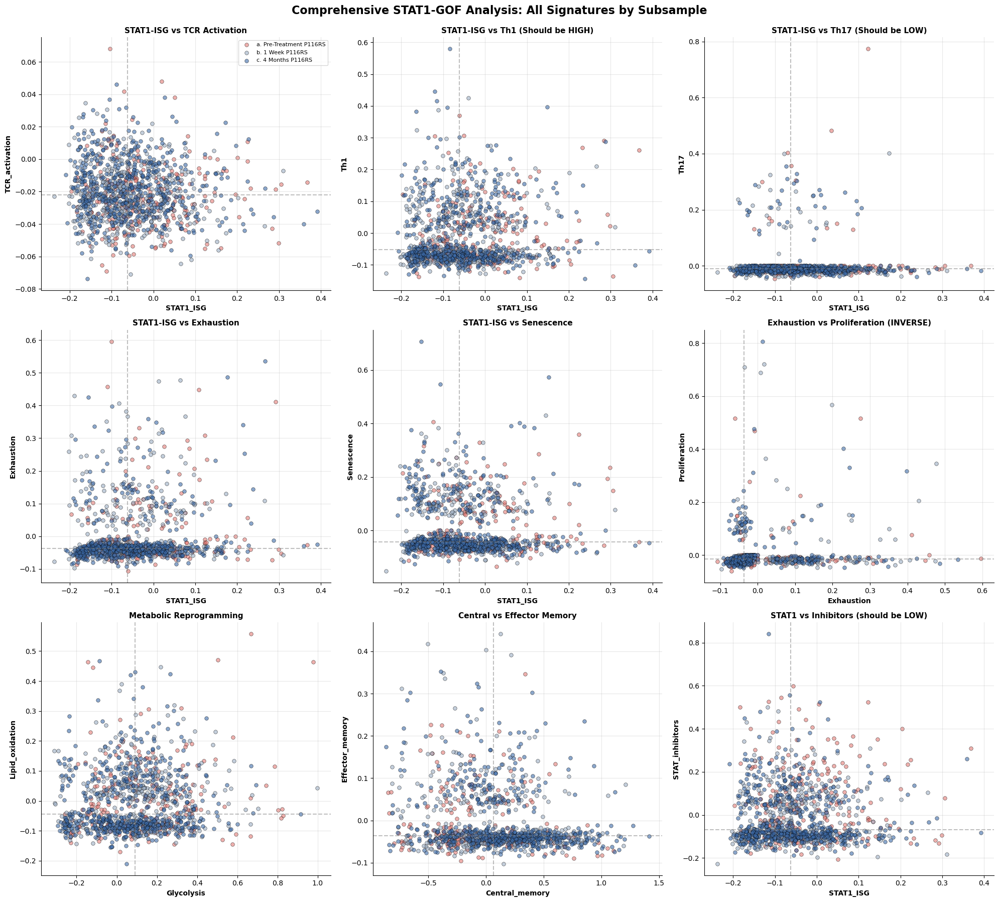


CALCULATING STAT1-ISG/TCR QUADRANT COMPOSITION BY SUBSAMPLE

              Subsample  Q1_count  Q1_percent  Q2_count  Q2_percent  Q3_count  Q3_percent  Q4_count  Q4_percent
a. Pre-Treatment P116RS        64   25.296443        90   35.573123        53   20.948617        46   18.181818
       b. 1 Week P116RS        79   19.554455       101   25.000000       113   27.970297       111   27.475248
     c. 4 Months P116RS       152   27.191413       122   21.824687       129   23.076923       156   27.906977

✓ Quadrant composition saved to 'STAT1_quadrant_composition.csv'

CREATING STAT1/TCR QUADRANT COMPOSITION BAR PLOT

✓ STAT1/TCR quadrant bar plot saved as 'STAT1_quadrant_composition_barplot.pdf'


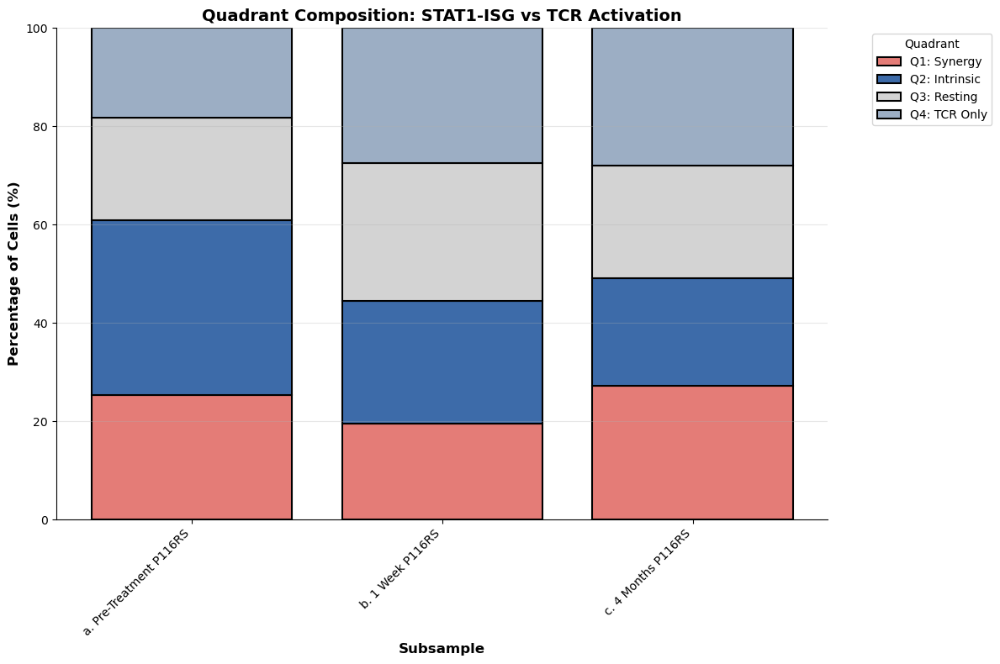


CALCULATING MEMORY QUADRANT COMPOSITION BY SUBSAMPLE

              Subsample  Q1_count  Q1_percent  Q2_count  Q2_percent  Q3_count  Q3_percent  Q4_count  Q4_percent
a. Pre-Treatment P116RS        39   15.415020        48   18.972332        87   34.387352        79   31.225296
       b. 1 Week P116RS        99   24.504950       118   29.207921        83   20.544554       104   25.742574
     c. 4 Months P116RS       133   23.792487       171   30.590340       101   18.067979       154   27.549195

✓ Memory quadrant composition saved to 'STAT1_memory_quadrant_composition.csv'

CREATING MEMORY QUADRANT COMPOSITION BAR PLOT

✓ Memory quadrant bar plot saved as 'STAT1_memory_quadrant_composition_barplot.pdf'


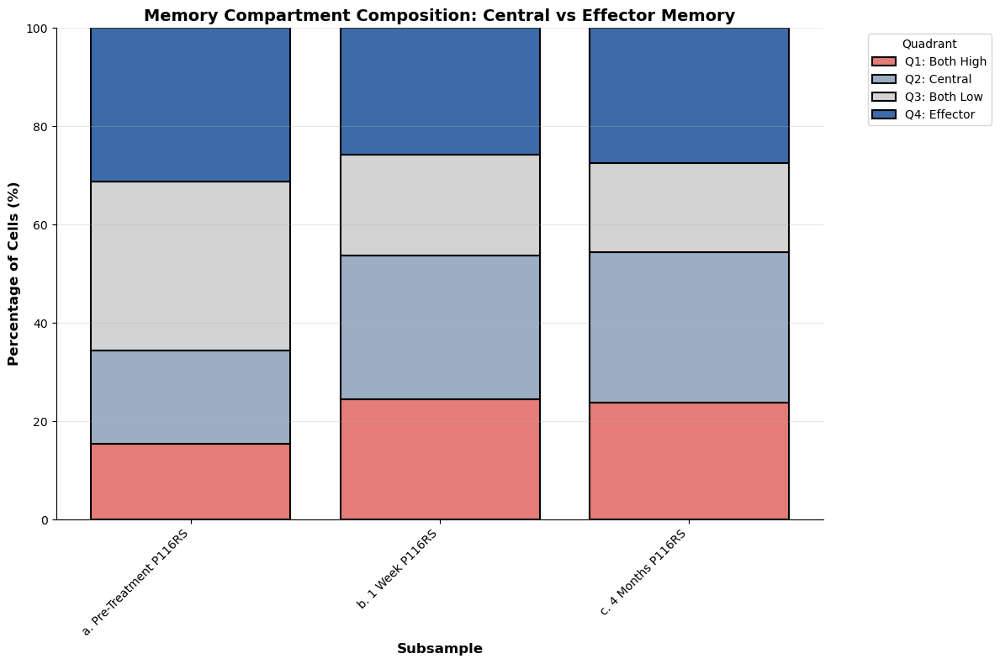


CREATING TIER 1 ESSENTIAL PLOTS (2x2)

✓ Tier 1 essential plots saved as 'STAT1_tier1_essential.pdf'


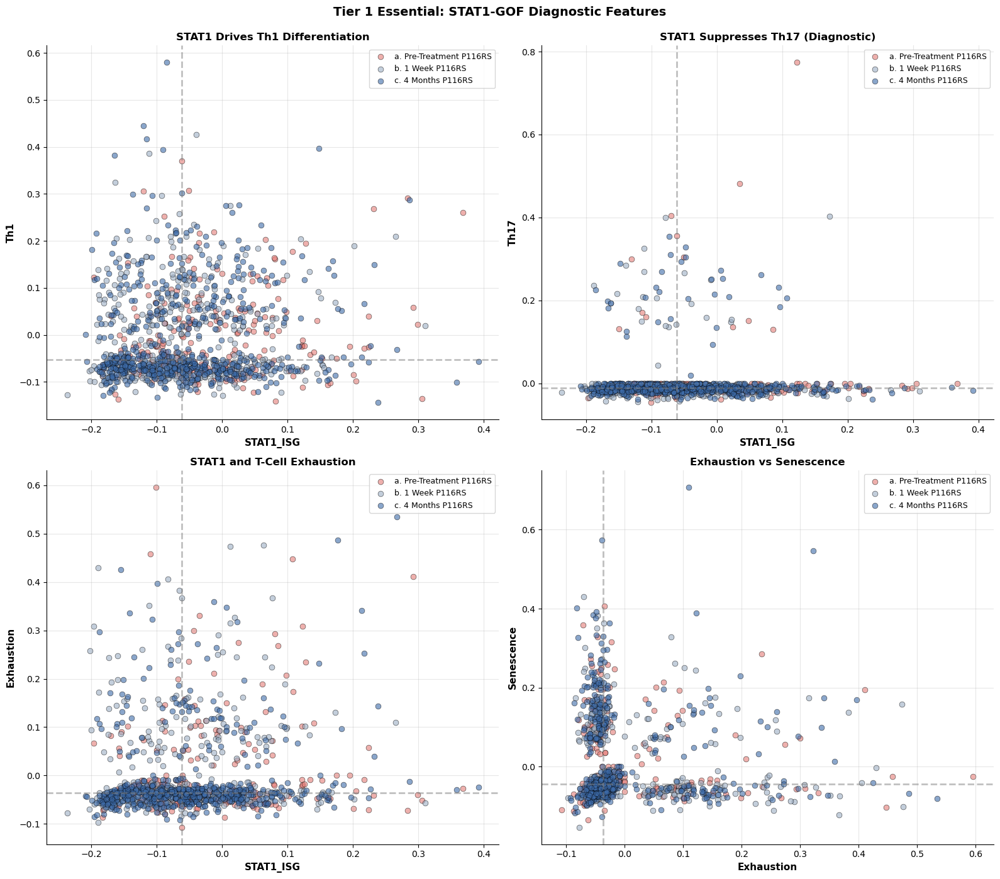


CREATING COMPREHENSIVE HEATMAP

✓ Heatmap saved as 'STAT1_all_signatures_heatmap.pdf'


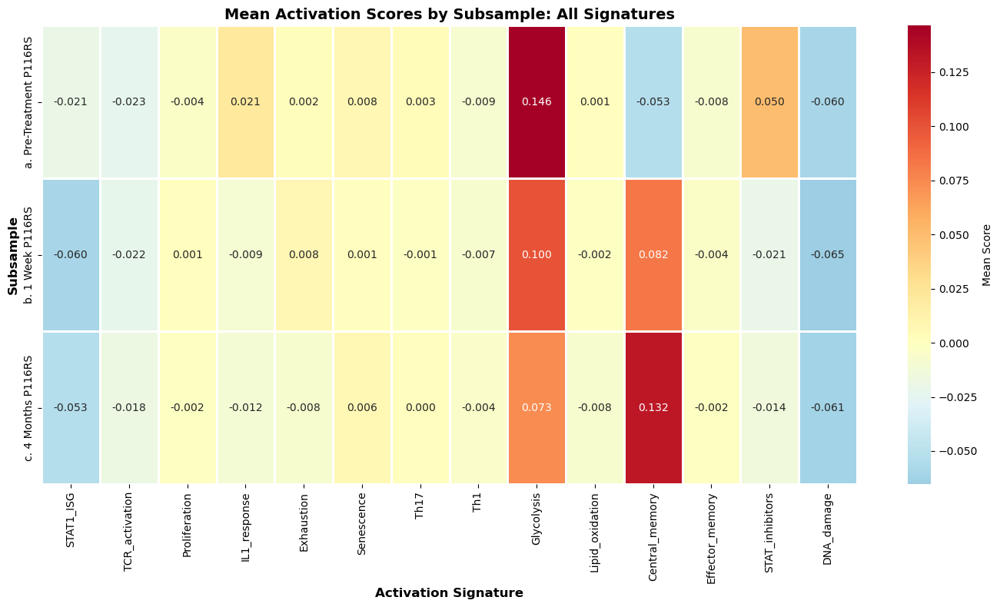


COMPREHENSIVE STATISTICS BY SUBSAMPLE

              Subsample  N_cells  STAT1_ISG_mean  STAT1_ISG_std  TCR_activation_mean  TCR_activation_std  Proliferation_mean  Proliferation_std  IL1_response_mean  IL1_response_std  Exhaustion_mean  Exhaustion_std  Senescence_mean  Senescence_std  Th17_mean  Th17_std  Th1_mean  Th1_std  Glycolysis_mean  Glycolysis_std  Lipid_oxidation_mean  Lipid_oxidation_std  Central_memory_mean  Central_memory_std  Effector_memory_mean  Effector_memory_std  STAT_inhibitors_mean  STAT_inhibitors_std  DNA_damage_mean  DNA_damage_std
a. Pre-Treatment P116RS      253       -0.020615       0.100495            -0.022623            0.019714           -0.003770           0.065409           0.021047          0.145279         0.002190        0.099565         0.007902        0.101030   0.002575  0.076746 -0.008801 0.091915         0.146456        0.219940              0.001197             0.117984            -0.052687            0.375343             -0.008062            

In [122]:
# COMPREHENSIVE STAT1-GOF ANALYSIS WITH ALL SIGNATURES
# Includes: Basic activation + Exhaustion + Senescence + Th17/Th1 + Metabolism + Trafficking
# WITH CUSTOM COLORS FOR P116RS TIME POINTS
# WITH QUADRANT COMPOSITION ANALYSIS FOR STAT1-ISG/TCR AND MEMORY COMPARTMENTS

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# ============================================================================
# STEP 1: Load and prepare your data
# ============================================================================

# Replace with your actual object name
adata = adata_p116  # YOUR OBJECT HERE

print("=" * 70)
print("COMPREHENSIVE STAT1-GOF ANALYSIS - ALL SIGNATURES")
print("=" * 70)

print(f"\nDataset: {adata.n_obs} cells")

# Check for subsample column
if 'subsample' not in adata.obs.columns:
    print("\n✗ ERROR: 'subsample' column not found")
    print("Available columns:", adata.obs.columns.tolist())
else:
    print(f"\n✓ Found 'subsample' column")
    subsamples = adata.obs['subsample'].unique()
    print(f"  Subsamples: {subsamples.tolist()}")

# ============================================================================
# STEP 2: Define ALL gene signatures
# ============================================================================

print("\n" + "=" * 70)
print("DEFINING GENE SIGNATURES")
print("=" * 70)

# Basic activation signatures
stat1_isg = ['ISG15', 'ISG20', 'IFIT1', 'IFIT2', 'ISG6', 'MX1', 'OAS1', 
             'IRF7', 'IRF9', 'SP140', 'PARP9']
tcr_activation = ["ACADM", "PXYLP1", "ACSL3", "ADAT2", "GRK3", "AGPAT5", "AHCYL2", "AIF1", "AP2B1", "APOLD1","ARHGEF2", "ARHGEF6", "ARHGEF7", "ASCC1", "ATP8A1", "ATP8B3", "B3GNT5", "B3GNTL1", "BATF3","BEND5", "BABAM2", "BSPRY", "ABTB3", "BTBD3", "RUBCNL", "LINC01588", "ELP5", "FAM210A","C2orf76", "NOA1", "NREP", "CACNA2D4", "CASP9", "KYAT3", "CCDC51", "CCKAR", "CCR7", "CD2","CD200", "CD27", "CD38", "CDK5", "CENPV", "CHMP5", "CHRNA6", "CHSY1", "CLDN12", "CLTC","CNIH1", "COL6A3", "COX10", "COX15", "CPPED1", "CPSF6", "CREB3L4", "CTTN", "CXCL13", "DBN1","INTS6L", "DECR1", "DENR", "DHCR24", "DHTKD1", "DIXDC1", "DLEU1", "DNAH14", "DUS2", "DYNLL1","EFL1", "EGR1", "ETS2", "ETV6", "FASLG", "FASN", "FDX1", "FGGY", "GEM", "GFI1", "GK", "GNA12","GRAMD4", "GRK4", "GSTO2", "GZMH", "HDC", "HIBADH", "HMG20A", "HSD17B6", "IFT27", "IFT74","ILDR2", "BPNT2", "ITCH", "ITGAE", "KCNK5", "LANCL2", "LASP1", "LAT2", "GFOD1", "LINC01281","LRRCC1", "MAPRE2", "MCCC2", "MCTP2", "METTL13", "MGST2", "MOB1B", "MPP1", "MPZL1", "MRPS15","MRPS6", "STK26", "MYB", "MYEF2", "MYO7B", "NAB1", "NBAS", "NDFIP2", "NFATC3", "SLC9B2","NHS", "NME7", "NR5A2", "NRAS", "NT5C2", "NTRK1", "OSBP2", "PALLD", "TENT4B", "PAQR6","PDE7B", "PDGFA", "PI4K2A", "STMP1", "PMS1", "PPA1", "PPP2R5A", "PRF1", "PRPF6", "PTDSS1","PTGFRN", "PTPN14", "PTPN3", "QSOX2", "RAB27A", "RAB33A", "MOK", "RCL1", "RGL4", "RGS3","RHOBTB3", "RNASEH2B", "RPAP2", "RPRD2", "SEC11A", "SEC31B", "SELL", "SERPINB1", "SIAH2","SIRPG", "SLC12A6", "SLC15A4", "SLC16A5", "SLC25A44", "SLC39A14", "SLC5A3", "SLC7A5", "SOCS6","SOX4", "SPA17", "SPON2", "SPRY1", "SPTBN1", "SQLE", "SSBP2", "STAG3", "STAMBP", "SUOX","TARBP1", "TCEA2", "TMEM135", "NEMP2", "SLC35G2", "TNIP3", "TPRG1", "TRAK1", "TRIM25","TXNDC17", "UBE2G1", "UBE2V2", "VAMP1", "VNN2", "VPS8", "VWA5A", "YES1", "YWHAQ", "ZFYVE1","ZSCAN30"]

tcr_activation2 = ['IL2', 'IL2RA', 'TNF', 'NFKBIA', 'JUN', 'JUNB', 'FOS', 
                  'EGR1', 'EGR2']
proliferation = ['PCNA', 'TOP2A', 'BIRC5', 'CDC20', 'MKI67']
il1_response = ['IL1R1', 'NFKB2', 'RELB', 'TNF', 'IL8']

# Exhaustion markers
exhaustion_checkpoint = ['PDCD1', 'LAG3', 'HAVCR2', 'CTLA4', 'TIGIT']

# Senescence markers
senescence_markers = ['CDKN1A', 'CDKN2A', 'CDKN2B', 'TP53', 'KLRG1']

# Th17 differentiation (should be LOW in STAT1-GOF)
th17_differentiation = ['IL17A', 'IL17F', 'IL23R', 'RORC', 'CCR6', 'IL22']

# Th1 differentiation (should be HIGH in STAT1-GOF)
th1_differentiation = ['IFNG', 'TBX21', 'STAT4', 'IL12RB1', 'IL12RB2']

# Glycolytic metabolism
glycolytic_metabolism = ['SLC2A1', 'LDHA', 'PFKFB3', 'GAPDH', 'ENO1']

# Lipid oxidation metabolism
lipid_oxidation = ['CPT1A', 'CPT2', 'HADHA', 'HADHB', 'ACAA2']

# Lymphoid homing (Central Memory - should be LOW)
lymphoid_homing = ['CCR7', 'SELL', 'IL7R']

# Tissue homing (Effector Memory - should be HIGH)
tissue_homing = ['CCR2', 'CCR5', 'CCR6', 'CXCR3', 'ITGA1', 'ITGAE']

# STAT inhibitors (should be LOW in STAT1-GOF)
stat_inhibitors = ['PTPN2', 'PTPN22', 'SOCS1', 'SOCS3']

# DNA damage response
dna_damage = ['ATM', 'TP53', 'GADD45A', 'GADD45B', 'MDM2', 'CDKN1A']

# Combine all signatures
signatures = {
    # Basic (Tier 0)
    'STAT1_ISG': stat1_isg,
    'TCR_activation': tcr_activation,
    'Proliferation': proliferation,
    'IL1_response': il1_response,
    
    # Tier 1 - ESSENTIAL
    'Exhaustion': exhaustion_checkpoint,
    'Senescence': senescence_markers,
    'Th17': th17_differentiation,
    'Th1': th1_differentiation,
    
    # Tier 2 - HIGHLY RECOMMENDED
    'Glycolysis': glycolytic_metabolism,
    'Lipid_oxidation': lipid_oxidation,
    'Central_memory': lymphoid_homing,
    'Effector_memory': tissue_homing,
    'STAT_inhibitors': stat_inhibitors,
    
    # Tier 3 - NICE TO HAVE
    'DNA_damage': dna_damage,
}

print(f"\nTotal signatures defined: {len(signatures)}")
for name in signatures.keys():
    print(f"  - {name}")

# ============================================================================
# STEP 3: Validate and score all signatures
# ============================================================================

print("\n" + "=" * 70)
print("SCORING GENE SIGNATURES")
print("=" * 70)

def validate_and_filter_genes(adata, gene_list):
    return [g for g in gene_list if g in adata.var_names]

scored_signatures = []

for sig_name, gene_list in signatures.items():
    score_name = f'{sig_name}_score'
    
    if score_name not in adata.obs.columns:
        valid_genes = validate_and_filter_genes(adata, gene_list)
        if len(valid_genes) > 0:
            sc.tl.score_genes(adata, valid_genes, score_name=score_name)
            print(f"  ✓ {sig_name}: {len(valid_genes)}/{len(gene_list)} genes")
            scored_signatures.append(sig_name)
        else:
            print(f"  ✗ {sig_name}: NO VALID GENES - skipped")
    else:
        print(f"  ✓ {sig_name}: Already scored")
        scored_signatures.append(sig_name)

print(f"\nSuccessfully scored: {len(scored_signatures)} signatures")

# ============================================================================
# STEP 4: Setup custom colors
# ============================================================================

# Get subsamples
subsamples = sorted(adata.obs['subsample'].unique())

# Custom colors for specific subsamples (YOUR COLORS!)
custom_colors = {
    "a. Pre-Treatment P116RS": "#e47c77",
    "b. 1 Week P116RS": "#9caec4",
    "c. 4 Months P116RS": "#3d6ba9"
}

# Create color dictionary - use custom colors if available, fallback to tab10
colors_fallback = plt.cm.tab10(np.linspace(0, 1, len(subsamples)))
color_dict = {}
for idx, sub in enumerate(subsamples):
    if sub in custom_colors:
        color_dict[sub] = custom_colors[sub]
    else:
        color_dict[sub] = colors_fallback[idx]

print("\n" + "=" * 70)
print("COLOR MAPPING")
print("=" * 70)
for sub, color in color_dict.items():
    print(f"  {sub}: {color}")

# ============================================================================
# STEP 5: Create comprehensive 3x3 plot grid
# ============================================================================

print("\n" + "=" * 70)
print("CREATING COMPREHENSIVE PLOT GRID (3x3)")
print("=" * 70)

fig, axes = plt.subplots(3, 3, figsize=(20, 18))
axes = axes.flatten()

# Define plot combinations (9 most important)
plot_combinations = [
    ('STAT1_ISG_score', 'TCR_activation_score', 'STAT1-ISG vs TCR Activation'),
    ('STAT1_ISG_score', 'Th1_score', 'STAT1-ISG vs Th1 (Should be HIGH)'),
    ('STAT1_ISG_score', 'Th17_score', 'STAT1-ISG vs Th17 (Should be LOW)'),
    ('STAT1_ISG_score', 'Exhaustion_score', 'STAT1-ISG vs Exhaustion'),
    ('STAT1_ISG_score', 'Senescence_score', 'STAT1-ISG vs Senescence'),
    ('Exhaustion_score', 'Proliferation_score', 'Exhaustion vs Proliferation (INVERSE)'),
    ('Glycolysis_score', 'Lipid_oxidation_score', 'Metabolic Reprogramming'),
    ('Central_memory_score', 'Effector_memory_score', 'Central vs Effector Memory'),
    ('STAT1_ISG_score', 'STAT_inhibitors_score', 'STAT1 vs Inhibitors (should be LOW)'),
]

for idx, (x_score, y_score, title) in enumerate(plot_combinations):
    ax = axes[idx]
    
    # Check if both scores exist
    if x_score in adata.obs.columns and y_score in adata.obs.columns:
        for subsample in subsamples:
            adata_sub = adata[adata.obs['subsample'] == subsample]
            ax.scatter(adata_sub.obs[x_score],
                       adata_sub.obs[y_score],
                       label=subsample, color=color_dict[subsample],
                       alpha=0.6, s=30, edgecolors='black', linewidth=0.5)
        
        # Add median lines
        x_med = adata.obs[x_score].median()
        y_med = adata.obs[y_score].median()
        ax.axhline(y_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        ax.axvline(x_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        
        ax.set_xlabel(x_score.replace('_score', ''), fontsize=10, fontweight='bold')
        ax.set_ylabel(y_score.replace('_score', ''), fontsize=10, fontweight='bold')
        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.grid(True, alpha=0.3)
        if idx == 0:
            ax.legend(fontsize=8, loc='best')
    else:
        ax.text(0.5, 0.5, f'Missing:\n{x_score}\nor\n{y_score}', 
                ha='center', va='center', transform=ax.transAxes)

plt.suptitle('Comprehensive STAT1-GOF Analysis: All Signatures by Subsample', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('./P116_CD4/STAT1_comprehensive_all_signatures.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Comprehensive plot saved as 'STAT1_comprehensive_all_signatures.pdf'")
plt.show()

# ============================================================================
# STEP 6: STAT1-ISG vs TCR Quadrant Composition Analysis
# ============================================================================

print("\n" + "=" * 70)
print("CALCULATING STAT1-ISG/TCR QUADRANT COMPOSITION BY SUBSAMPLE")
print("=" * 70)

# Calculate quadrants for STAT1-ISG vs TCR_activation (main plot)
if 'STAT1_ISG_score' in adata.obs.columns and 'TCR_activation_score' in adata.obs.columns:
    
    # Use global medians for threshold
    stat1_med = adata.obs['STAT1_ISG_score'].median()
    tcr_med = adata.obs['TCR_activation_score'].median()
    
    # Assign quadrant to each cell
    def assign_quadrant(row):
        if row['STAT1_ISG_score'] > stat1_med and row['TCR_activation_score'] > tcr_med:
            return 'Q1: STAT1+TCR+ (Synergy)'
        elif row['STAT1_ISG_score'] > stat1_med and row['TCR_activation_score'] <= tcr_med:
            return 'Q2: STAT1+TCR- (Intrinsic)'
        elif row['STAT1_ISG_score'] <= stat1_med and row['TCR_activation_score'] <= tcr_med:
            return 'Q3: STAT1-TCR- (Resting)'
        else:
            return 'Q4: STAT1-TCR+ (TCR Only)'
    
    adata.obs['quadrant'] = adata.obs.apply(assign_quadrant, axis=1)
    
    # Calculate composition by subsample
    quadrant_composition = []
    
    for subsample in subsamples:
        adata_sub = adata[adata.obs['subsample'] == subsample]
        total = len(adata_sub)
        
        # Count cells in each quadrant
        q1 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q1: STAT1+TCR+ (Synergy)'])
        q2 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q2: STAT1+TCR- (Intrinsic)'])
        q3 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q3: STAT1-TCR- (Resting)'])
        q4 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q4: STAT1-TCR+ (TCR Only)'])
        
        quadrant_composition.append({
            'Subsample': subsample,
            'Q1_count': q1,
            'Q1_percent': 100 * q1 / total,
            'Q2_count': q2,
            'Q2_percent': 100 * q2 / total,
            'Q3_count': q3,
            'Q3_percent': 100 * q3 / total,
            'Q4_count': q4,
            'Q4_percent': 100 * q4 / total
        })
    
    quadrant_df = pd.DataFrame(quadrant_composition)
    print("\n" + quadrant_df.to_string(index=False))
    
    # Save to CSV
    quadrant_df.to_csv('STAT1_quadrant_composition.csv', index=False)
    print("\n✓ Quadrant composition saved to 'STAT1_quadrant_composition.csv'")
    
    # ========================================================================
    # Create stacked bar plot with YOUR CUSTOM COLORS
    # ========================================================================
    
    print("\n" + "=" * 70)
    print("CREATING STAT1/TCR QUADRANT COMPOSITION BAR PLOT")
    print("=" * 70)
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Prepare data for plotting
    quad_data = quadrant_df[['Subsample', 'Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']]
    
    # Define quadrant colors (USING YOUR COLOR SCHEME!)
    quad_colors = {
        'Q1_percent': '#e47c77',  # coral - synergy (Pre-Treatment color)
        'Q2_percent': '#3d6ba9',  # dark blue - intrinsic STAT1 (4 Months color)
        'Q3_percent': '#d3d3d3',  # light gray - resting
        'Q4_percent': '#9caec4'   # light blue - TCR only (1 Week color)
    }
    
    # Create stacked bar
    bottom = np.zeros(len(subsamples))
    
    for quad in ['Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']:
        quad_label = quad.replace('_percent', '').replace('Q1', 'Q1: Synergy').replace('Q2', 'Q2: Intrinsic').replace('Q3', 'Q3: Resting').replace('Q4', 'Q4: TCR Only')
        ax.bar(range(len(subsamples)), quad_data[quad], 
               bottom=bottom, label=quad_label, color=quad_colors[quad],
               edgecolor='black', linewidth=1.5)
        bottom += quad_data[quad].values
    
    # Customize plot
    ax.set_xticks(range(len(subsamples)))
    ax.set_xticklabels(subsamples, rotation=45, ha='right')
    ax.set_ylabel('Percentage of Cells (%)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Subsample', fontsize=12, fontweight='bold')
    ax.set_title('Quadrant Composition: STAT1-ISG vs TCR Activation', fontsize=14, fontweight='bold')
    ax.legend(title='Quadrant', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    ax.set_ylim(0, 100)
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('./P116_CD4/STAT1_quadrant_composition_barplot.pdf', dpi=300, bbox_inches='tight')
    print("\n✓ STAT1/TCR quadrant bar plot saved as 'STAT1_quadrant_composition_barplot.pdf'")
    plt.show()

# ============================================================================
# STEP 7: Central Memory vs Effector Memory Quadrant Analysis
# ============================================================================

print("\n" + "=" * 70)
print("CALCULATING MEMORY QUADRANT COMPOSITION BY SUBSAMPLE")
print("=" * 70)

# Calculate quadrants for Central_memory vs Effector_memory
if 'Central_memory_score' in adata.obs.columns and 'Effector_memory_score' in adata.obs.columns:
    
    # Use global medians for threshold
    central_med = adata.obs['Central_memory_score'].median()
    effector_med = adata.obs['Effector_memory_score'].median()
    
    # Assign memory quadrant to each cell
    def assign_memory_quadrant(row):
        if row['Central_memory_score'] > central_med and row['Effector_memory_score'] > effector_med:
            return 'Q1: Central+Effector+ (Both High)'
        elif row['Central_memory_score'] > central_med and row['Effector_memory_score'] <= effector_med:
            return 'Q2: Central+Effector- (Central Memory)'
        elif row['Central_memory_score'] <= central_med and row['Effector_memory_score'] <= effector_med:
            return 'Q3: Central-Effector- (Both Low)'
        else:
            return 'Q4: Central-Effector+ (Effector Memory)'
    
    adata.obs['memory_quadrant'] = adata.obs.apply(assign_memory_quadrant, axis=1)
    
    # Calculate memory composition by subsample
    memory_composition = []
    
    for subsample in subsamples:
        adata_sub = adata[adata.obs['subsample'] == subsample]
        total = len(adata_sub)
        
        # Count cells in each memory quadrant
        q1 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q1: Central+Effector+ (Both High)'])
        q2 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q2: Central+Effector- (Central Memory)'])
        q3 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q3: Central-Effector- (Both Low)'])
        q4 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q4: Central-Effector+ (Effector Memory)'])
        
        memory_composition.append({
            'Subsample': subsample,
            'Q1_count': q1,
            'Q1_percent': 100 * q1 / total,
            'Q2_count': q2,
            'Q2_percent': 100 * q2 / total,
            'Q3_count': q3,
            'Q3_percent': 100 * q3 / total,
            'Q4_count': q4,
            'Q4_percent': 100 * q4 / total
        })
    
    memory_df = pd.DataFrame(memory_composition)
    print("\n" + memory_df.to_string(index=False))
    
    # Save to CS/
    memory_df.to_csv('./P116_CD4/STAT1_memory_quadrant_composition.csv', index=False)
    print("\n✓ Memory quadrant composition saved to 'STAT1_memory_quadrant_composition.csv'")
    
    # ========================================================================
    # Create memory quadrant stacked bar plot with YOUR CUSTOM COLORS
    # ========================================================================
    
    print("\n" + "=" * 70)
    print("CREATING MEMORY QUADRANT COMPOSITION BAR PLOT")
    print("=" * 70)
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Prepare data for plotting
    memory_data = memory_df[['Subsample', 'Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']]
    
    # Define memory quadrant colors (USING YOUR COLOR SCHEME!)
    memory_colors = {
        'Q1_percent': '#e47c77',  # coral - both high (Pre-Treatment color)
        'Q2_percent': '#9caec4',  # light blue - central memory (1 Week color)
        'Q3_percent': '#d3d3d3',  # light gray - both low
        'Q4_percent': '#3d6ba9'   # dark blue - effector memory (4 Months color)
    }
    
    # Create stacked bar
    bottom = np.zeros(len(subsamples))
    
    for quad in ['Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']:
        quad_label = quad.replace('_percent', '').replace('Q1', 'Q1: Both High').replace('Q2', 'Q2: Central').replace('Q3', 'Q3: Both Low').replace('Q4', 'Q4: Effector')
        ax.bar(range(len(subsamples)), memory_data[quad], 
               bottom=bottom, label=quad_label, color=memory_colors[quad],
               edgecolor='black', linewidth=1.5)
        bottom += memory_data[quad].values
    
    # Customize plot
    ax.set_xticks(range(len(subsamples)))
    ax.set_xticklabels(subsamples, rotation=45, ha='right')
    ax.set_ylabel('Percentage of Cells (%)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Subsample', fontsize=12, fontweight='bold')
    ax.set_title('Memory Compartment Composition: Central vs Effector Memory', fontsize=14, fontweight='bold')
    ax.legend(title='Quadrant', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    ax.set_ylim(0, 100)
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('./P116_CD4/STAT1_memory_quadrant_composition_barplot.pdf', dpi=300, bbox_inches='tight')
    print("\n✓ Memory quadrant bar plot saved as 'STAT1_memory_quadrant_composition_barplot.pdf'")
    plt.show()

# ============================================================================
# STEP 8: Tier 1 Essential Plots (Detailed)
# ============================================================================

print("\n" + "=" * 70)
print("CREATING TIER 1 ESSENTIAL PLOTS (2x2)")
print("=" * 70)

fig, axes = plt.subplots(2, 2, figsize=(16, 14))

tier1_plots = [
    ('STAT1_ISG_score', 'Th1_score', 'STAT1 Drives Th1 Differentiation'),
    ('STAT1_ISG_score', 'Th17_score', 'STAT1 Suppresses Th17 (Diagnostic)'),
    ('STAT1_ISG_score', 'Exhaustion_score', 'STAT1 and T-Cell Exhaustion'),
    ('Exhaustion_score', 'Senescence_score', 'Exhaustion vs Senescence'),
]

# Use the same custom color scheme
for idx, ((x_score, y_score, title), ax) in enumerate(zip(tier1_plots, axes.flatten())):
    if x_score in adata.obs.columns and y_score in adata.obs.columns:
        for subsample in subsamples:
            adata_sub = adata[adata.obs['subsample'] == subsample]
            ax.scatter(adata_sub.obs[x_score],
                       adata_sub.obs[y_score],
                       label=subsample, color=color_dict[subsample],
                       alpha=0.6, s=40, edgecolors='black', linewidth=0.5)
        
        x_med = adata.obs[x_score].median()
        y_med = adata.obs[y_score].median()
        ax.axhline(y_med, color='gray', linestyle='--', alpha=0.5, linewidth=2)
        ax.axvline(x_med, color='gray', linestyle='--', alpha=0.5, linewidth=2)
        
        ax.set_xlabel(x_score.replace('_score', ''), fontsize=11, fontweight='bold')
        ax.set_ylabel(y_score.replace('_score', ''), fontsize=11, fontweight='bold')
        ax.set_title(title, fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=9, loc='best')

plt.suptitle('Tier 1 Essential: STAT1-GOF Diagnostic Features', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('./P116_CD4/STAT1_tier1_essential.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Tier 1 essential plots saved as 'STAT1_tier1_essential.pdf'")
plt.show()

# ============================================================================
# STEP 9: Comprehensive heatmap of all scores
# ============================================================================

print("\n" + "=" * 70)
print("CREATING COMPREHENSIVE HEATMAP")
print("=" * 70)

# Calculate mean scores per subsample
score_cols = [col for col in adata.obs.columns if '_score' in col]
heatmap_data = []

for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    row = {score: adata_sub.obs[score].mean() for score in score_cols}
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data, index=subsamples)
heatmap_df.columns = [col.replace('_score', '') for col in heatmap_df.columns]

fig, ax = plt.subplots(figsize=(14, 8))
sns.heatmap(heatmap_df, annot=True, fmt='.3f', cmap='RdYlBu_r', 
            cbar_kws={'label': 'Mean Score'}, ax=ax, linewidths=1, 
            center=0)
ax.set_title('Mean Activation Scores by Subsample: All Signatures', 
             fontsize=14, fontweight='bold')
ax.set_ylabel('Subsample', fontsize=12, fontweight='bold')
ax.set_xlabel('Activation Signature', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('./P116_CD4/STAT1_all_signatures_heatmap.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Heatmap saved as 'STAT1_all_signatures_heatmap.pdf'")
plt.show()

# ============================================================================
# STEP 10: Summary statistics table
# ============================================================================

print("\n" + "=" * 70)
print("COMPREHENSIVE STATISTICS BY SUBSAMPLE")
print("=" * 70)

summary_stats = []

for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    
    row = {'Subsample': subsample, 'N_cells': len(adata_sub)}
    
    # Add mean for each scored signature
    for sig_name in scored_signatures:
        score_name = f'{sig_name}_score'
        if score_name in adata_sub.obs.columns:
            row[f'{sig_name}_mean'] = adata_sub.obs[score_name].mean()
            row[f'{sig_name}_std'] = adata_sub.obs[score_name].std()
    
    summary_stats.append(row)

summary_df = pd.DataFrame(summary_stats)
print("\n" + summary_df.to_string(index=False))

# Save to CSV
summary_df.to_csv('./P116_CD4/STAT1_all_signatures_statistics.csv', index=False)
print("\n✓ Statistics saved as 'STAT1_all_signatures_statistics.csv'")

# ============================================================================
# STEP 11: Final Summary
# ============================================================================

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE - ALL FILES GENERATED")
print("=" * 70)

print("""
FILES GENERATED:
  1. STAT1_comprehensive_all_signatures.pdf (3x3 grid with YOUR COLORS)
  2. STAT1_quadrant_composition_barplot.pdf (STAT1/TCR quadrants with YOUR COLORS)
  3. STAT1_memory_quadrant_composition_barplot.pdf (Memory quadrants with YOUR COLORS)
  4. STAT1_quadrant_composition.csv (STAT1/TCR statistics)
  5. STAT1_memory_quadrant_composition.csv (Memory statistics)
  6. STAT1_tier1_essential.pdf (2x2 diagnostic panel)
  7. STAT1_all_signatures_heatmap.pdf (score comparison)
  8. STAT1_all_signatures_statistics.csv (detailed statistics)

Total signatures scored: {}

COLOR SCHEME (consistently applied to ALL plots):
  - Pre-Treatment P116RS: #e47c77 (coral)
  - 1 Week P116RS: #9caec4 (light blue)
  - 4 Months P116RS: #3d6ba9 (dark blue)

QUADRANT COLOR MAPPING:
STAT1/TCR Quadrants:
  - Q1 (Synergy): #e47c77 (coral)
  - Q2 (Intrinsic STAT1): #3d6ba9 (dark blue)
  - Q3 (Resting): #d3d3d3 (gray)
  - Q4 (TCR Only): #9caec4 (light blue)

Memory Quadrants:
  - Q1 (Both High): #e47c77 (coral)
  - Q2 (Central Memory): #9caec4 (light blue)
  - Q3 (Both Low): #d3d3d3 (gray)
  - Q4 (Effector Memory): #3d6ba9 (dark blue)

KEY INTERPRETATIONS:
  - Q2 in STAT1/TCR plot = intrinsic STAT1 hyperactivation
  - Q4 in Memory plot = effector memory expansion (expected in STAT1-GOF)
  - Compare Pre-Treatment vs 4 Months to quantify treatment effect
""".format(len(scored_signatures)))

print("\n" + "=" * 70)
print("Ready for your thesis! 🎓")
print("=" * 70)


CHECKING AVAILABLE COLUMNS IN .obs

Gene Scores (required for plots):
  ✓ STAT1_ISG_score
  ✓ TCR_activation_score
  ✓ Proliferation_score
  ✓ IL1_response_score

Marker Genes (used for coloring):
  ✓ CD69
  ✗ CD25 not extracted yet
  ✓ HLA_DR

✓ All required scores present. Proceeding to plotting...

Plot 1: Colored by CD69 ✓
Plot 2: No color marker (using default) ⚠
Plot 3: CD69+ quadrant analysis (n=453) ✓
Plot 4: Colored by HLA-DR ✓

✓ Plots saved as 'STAT1_activation_analysis.pdf'


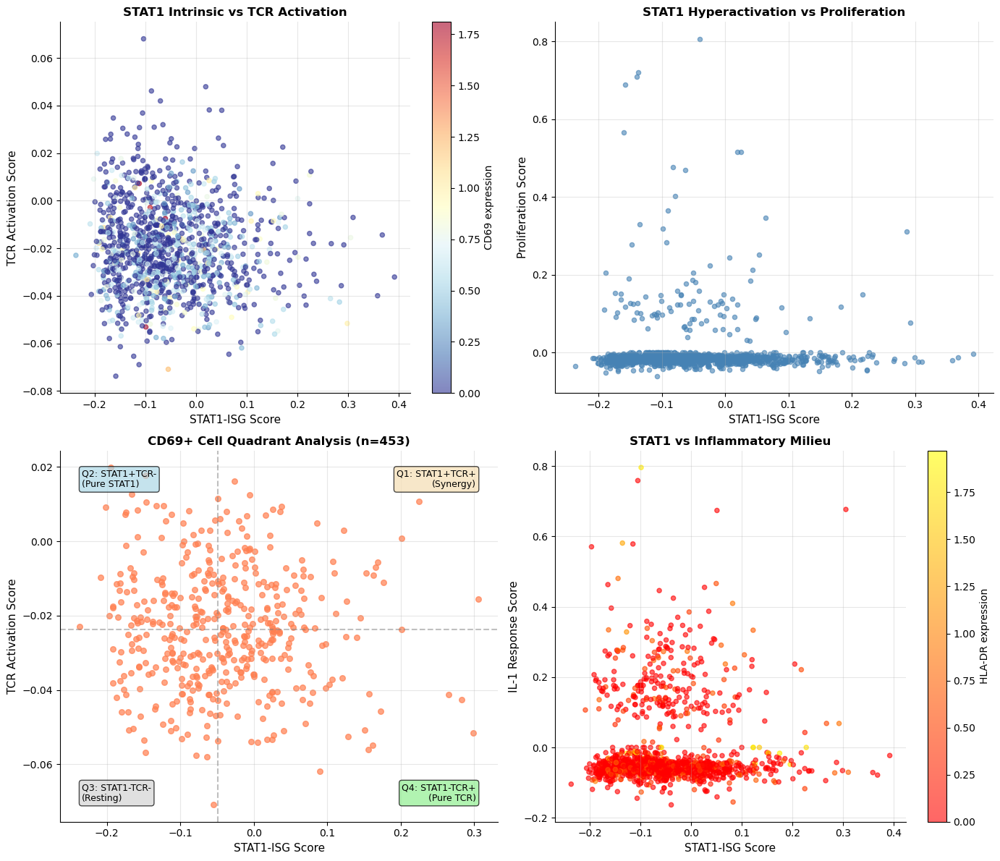


SUMMARY STATISTICS BY CELL POPULATION

CD69- (n=763)
  STAT1-ISG score:     -0.052 ± 0.098
  TCR activation:      -0.018 ± 0.019
  Proliferation:       0.003 ± 0.081
  IL1 response:        -0.009 ± 0.117

CD69+ (n=453)
  STAT1-ISG score:     -0.042 ± 0.091
  TCR activation:      -0.023 ± 0.016
  Proliferation:       -0.009 ± 0.046
  IL1 response:        0.004 ± 0.128

ANALYSIS COMPLETE


In [123]:
# COMPLETE CORRECTED PLOTTING SCRIPT
# This version plots only using scores and extracted markers that actually exist

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ============================================================================
# DIAGNOSTIC: Check what columns are available
# ============================================================================

print("=" * 70)
print("CHECKING AVAILABLE COLUMNS IN .obs")
print("=" * 70)

required_scores = ['STAT1_ISG_score', 'TCR_activation_score', 'Proliferation_score', 'IL1_response_score']
marker_genes = ['CD69', 'CD25', 'HLA_DR']

print("\nGene Scores (required for plots):")
for score in required_scores:
    if score in adata_p116.obs.columns:
        print(f"  ✓ {score}")
    else:
        print(f"  ✗ {score} MISSING - run gene scoring first!")

print("\nMarker Genes (used for coloring):")
for marker in marker_genes:
    if marker in adata_p116.obs.columns:
        print(f"  ✓ {marker}")
    else:
        print(f"  ✗ {marker} not extracted yet")

# If any scores are missing, stop and tell user
missing_scores = [s for s in required_scores if s not in adata_p116.obs.columns]
if missing_scores:
    print(f"\n✗ ERROR: Missing scores: {missing_scores}")
    print("Please run the gene scoring step first!")
else:
    print(f"\n✓ All required scores present. Proceeding to plotting...")

# ============================================================================
# PLOTTING: Create figures using only available data
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Determine what to use for coloring
color_cd69 = 'CD69' if 'CD69' in adata_p116.obs.columns else None
color_cd25 = 'CD25' if 'CD25' in adata_p116.obs.columns else None
color_hladr = 'HLA_DR' if 'HLA_DR' in adata_p116.obs.columns else None

# ============================================================================
# Plot 1: STAT1_ISG vs TCR activation
# ============================================================================

ax = axes[0, 0]
if color_cd69:
    scatter = ax.scatter(adata_p116.obs['STAT1_ISG_score'], 
                         adata_p116.obs['TCR_activation_score'],
                         c=adata_p116.obs['CD69'],
                         cmap='RdYlBu_r', alpha=0.6, s=20)
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('CD69 expression', fontsize=10)
    print("\nPlot 1: Colored by CD69 ✓")
else:
    ax.scatter(adata_p116.obs['STAT1_ISG_score'], 
               adata_p116.obs['TCR_activation_score'],
               alpha=0.6, s=20, color='steelblue')
    print("\nPlot 1: No color marker (using default) ⚠")

ax.set_xlabel('STAT1-ISG Score', fontsize=11)
ax.set_ylabel('TCR Activation Score', fontsize=11)
ax.set_title('STAT1 Intrinsic vs TCR Activation', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)

# ============================================================================
# Plot 2: STAT1_ISG vs Proliferation
# ============================================================================

ax = axes[0, 1]
if color_cd25:
    scatter = ax.scatter(adata_p116.obs['STAT1_ISG_score'], 
                         adata_p116.obs['Proliferation_score'],
                         c=adata_p116.obs['CD25'],
                         cmap='viridis', alpha=0.6, s=20)
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('CD25 expression', fontsize=10)
    print("Plot 2: Colored by CD25 ✓")
else:
    ax.scatter(adata_p116.obs['STAT1_ISG_score'], 
               adata_p116.obs['Proliferation_score'],
               alpha=0.6, s=20, color='steelblue')
    print("Plot 2: No color marker (using default) ⚠")

ax.set_xlabel('STAT1-ISG Score', fontsize=11)
ax.set_ylabel('Proliferation Score', fontsize=11)
ax.set_title('STAT1 Hyperactivation vs Proliferation', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)

# ============================================================================
# Plot 3: CD69+ Cell Quadrant Analysis
# ============================================================================

ax = axes[1, 0]
if color_cd69:
    # Filter to CD69+ cells
    cd69_threshold = adata_p116.obs['CD69'].quantile(0.5)
    cd69_mask = adata_p116.obs['CD69'] > cd69_threshold
    cd69_cells = adata_p116[cd69_mask]
    
    if len(cd69_cells) > 0:
        if color_cd25:
            scatter = ax.scatter(cd69_cells.obs['STAT1_ISG_score'], 
                                cd69_cells.obs['TCR_activation_score'],
                                c=cd69_cells.obs['CD25'],
                                cmap='coolwarm', alpha=0.7, s=30)
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label('CD25 expression', fontsize=10)
        else:
            ax.scatter(cd69_cells.obs['STAT1_ISG_score'], 
                      cd69_cells.obs['TCR_activation_score'],
                      alpha=0.7, s=30, color='coral')
        
        # Add quadrant lines
        stat1_median = cd69_cells.obs['STAT1_ISG_score'].median()
        tcr_median = cd69_cells.obs['TCR_activation_score'].median()
        ax.axhline(tcr_median, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        ax.axvline(stat1_median, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        
        # Label quadrants
        ax.text(0.95, 0.95, 'Q1: STAT1+TCR+\n(Synergy)', transform=ax.transAxes,
                ha='right', va='top', fontsize=9, bbox=dict(boxstyle='round', 
                facecolor='wheat', alpha=0.7))
        ax.text(0.05, 0.95, 'Q2: STAT1+TCR-\n(Pure STAT1)', transform=ax.transAxes,
                ha='left', va='top', fontsize=9, bbox=dict(boxstyle='round',
                facecolor='lightblue', alpha=0.7))
        ax.text(0.95, 0.05, 'Q4: STAT1-TCR+\n(Pure TCR)', transform=ax.transAxes,
                ha='right', va='bottom', fontsize=9, bbox=dict(boxstyle='round',
                facecolor='lightgreen', alpha=0.7))
        ax.text(0.05, 0.05, 'Q3: STAT1-TCR-\n(Resting)', transform=ax.transAxes,
                ha='left', va='bottom', fontsize=9, bbox=dict(boxstyle='round',
                facecolor='lightgray', alpha=0.7))
        
        ax.set_xlabel('STAT1-ISG Score', fontsize=11)
        ax.set_ylabel('TCR Activation Score', fontsize=11)
        ax.set_title(f'CD69+ Cell Quadrant Analysis (n={len(cd69_cells)})', 
                     fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        print(f"Plot 3: CD69+ quadrant analysis (n={len(cd69_cells)}) ✓")
    else:
        ax.text(0.5, 0.5, 'No CD69+ cells found', ha='center', va='center', transform=ax.transAxes)
        print("Plot 3: No CD69+ cells found ⚠")
else:
    ax.text(0.5, 0.5, 'CD69 marker not available', ha='center', va='center', transform=ax.transAxes)
    print("Plot 3: CD69 marker not available ⚠")

# ============================================================================
# Plot 4: STAT1 vs Inflammatory Milieu
# ============================================================================

ax = axes[1, 1]
if color_hladr:
    scatter = ax.scatter(adata_p116.obs['STAT1_ISG_score'], 
                         adata_p116.obs['IL1_response_score'],
                         c=adata_p116.obs['HLA_DR'],
                         cmap='autumn', alpha=0.6, s=20)
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('HLA-DR expression', fontsize=10)
    print("Plot 4: Colored by HLA-DR ✓")
else:
    ax.scatter(adata_p116.obs['STAT1_ISG_score'], 
               adata_p116.obs['IL1_response_score'],
               alpha=0.6, s=20, color='orange')
    print("Plot 4: No color marker (using default) ⚠")

ax.set_xlabel('STAT1-ISG Score', fontsize=11)
ax.set_ylabel('IL-1 Response Score', fontsize=11)
ax.set_title('STAT1 vs Inflammatory Milieu', fontsize=12, fontweight='bold')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('./P116_CD4/STAT1_activation_analysis.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Plots saved as 'STAT1_activation_analysis.pdf'")
plt.show()

# ============================================================================
# Summary Statistics
# ============================================================================

print("\n" + "=" * 70)
print("SUMMARY STATISTICS BY CELL POPULATION")
print("=" * 70)

if color_cd69 and color_cd25:
    cd69_median = adata_p116.obs['CD69'].median()
    cd25_median = adata_p116.obs['CD25'].median()
    
    pop_cd69_neg_cd25_neg = adata_p116[(adata_p116.obs['CD69'] <= cd69_median) & 
                                        (adata_p116.obs['CD25'] <= cd25_median)]
    pop_cd69_pos_cd25_neg = adata_p116[(adata_p116.obs['CD69'] > cd69_median) & 
                                        (adata_p116.obs['CD25'] <= cd25_median)]
    pop_cd69_pos_cd25_pos = adata_p116[(adata_p116.obs['CD69'] > cd69_median) & 
                                        (adata_p116.obs['CD25'] > cd25_median)]
    
    populations = {
        'CD69- CD25-': pop_cd69_neg_cd25_neg,
        'CD69+ CD25-': pop_cd69_pos_cd25_neg,
        'CD69+ CD25+': pop_cd69_pos_cd25_pos
    }
    
    for pop_name, pop_data in populations.items():
        print(f"\n{pop_name} (n={len(pop_data)})")
        print(f"  STAT1-ISG score:     {pop_data.obs['STAT1_ISG_score'].mean():.3f} ± {pop_data.obs['STAT1_ISG_score'].std():.3f}")
        print(f"  TCR activation:      {pop_data.obs['TCR_activation_score'].mean():.3f} ± {pop_data.obs['TCR_activation_score'].std():.3f}")
        print(f"  Proliferation:       {pop_data.obs['Proliferation_score'].mean():.3f} ± {pop_data.obs['Proliferation_score'].std():.3f}")
        print(f"  IL1 response:        {pop_data.obs['IL1_response_score'].mean():.3f} ± {pop_data.obs['IL1_response_score'].std():.3f}")

elif color_cd69:
    cd69_median = adata_p116.obs['CD69'].median()
    pop_cd69_neg = adata_p116[adata_p116.obs['CD69'] <= cd69_median]
    pop_cd69_pos = adata_p116[adata_p116.obs['CD69'] > cd69_median]
    
    populations = {
        'CD69-': pop_cd69_neg,
        'CD69+': pop_cd69_pos
    }
    
    for pop_name, pop_data in populations.items():
        print(f"\n{pop_name} (n={len(pop_data)})")
        print(f"  STAT1-ISG score:     {pop_data.obs['STAT1_ISG_score'].mean():.3f} ± {pop_data.obs['STAT1_ISG_score'].std():.3f}")
        print(f"  TCR activation:      {pop_data.obs['TCR_activation_score'].mean():.3f} ± {pop_data.obs['TCR_activation_score'].std():.3f}")
        print(f"  Proliferation:       {pop_data.obs['Proliferation_score'].mean():.3f} ± {pop_data.obs['Proliferation_score'].std():.3f}")
        print(f"  IL1 response:        {pop_data.obs['IL1_response_score'].mean():.3f} ± {pop_data.obs['IL1_response_score'].std():.3f}")
else:
    print("\nCD69 marker not available for population-specific analysis")
    print("\nGlobal statistics:")
    print(f"  STAT1-ISG score (all cells):     {adata_p116.obs['STAT1_ISG_score'].mean():.3f} ± {adata_p116.obs['STAT1_ISG_score'].std():.3f}")
    print(f"  TCR activation (all cells):      {adata_p116.obs['TCR_activation_score'].mean():.3f} ± {adata_p116.obs['TCR_activation_score'].std():.3f}")
    print(f"  Proliferation (all cells):       {adata_p116.obs['Proliferation_score'].mean():.3f} ± {adata_p116.obs['Proliferation_score'].std():.3f}")
    print(f"  IL1 response (all cells):        {adata_p116.obs['IL1_response_score'].mean():.3f} ± {adata_p116.obs['IL1_response_score'].std():.3f}")

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE")
print("=" * 70)


# Code for Palantir

In [124]:
pca_embedding = pd.DataFrame(adata_p116.obsm["X_pca"], index=adata_p116.obs_names)
pca_embedding.shape

(1216, 50)

In [125]:
dm_res = palantir.utils.run_diffusion_maps(adata_p116, n_components=5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [126]:
ms_data = palantir.utils.determine_multiscale_space(dm_res)

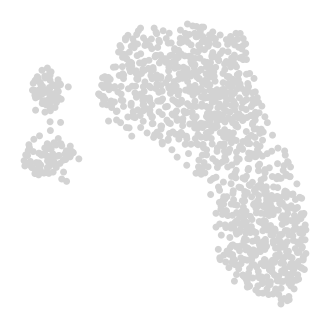

In [127]:
sc.pl.embedding(
    adata_p116,
    basis="umap",
    frameon=False,
)

In [128]:
imputed_X = palantir.utils.run_magic_imputation(adata_p116)

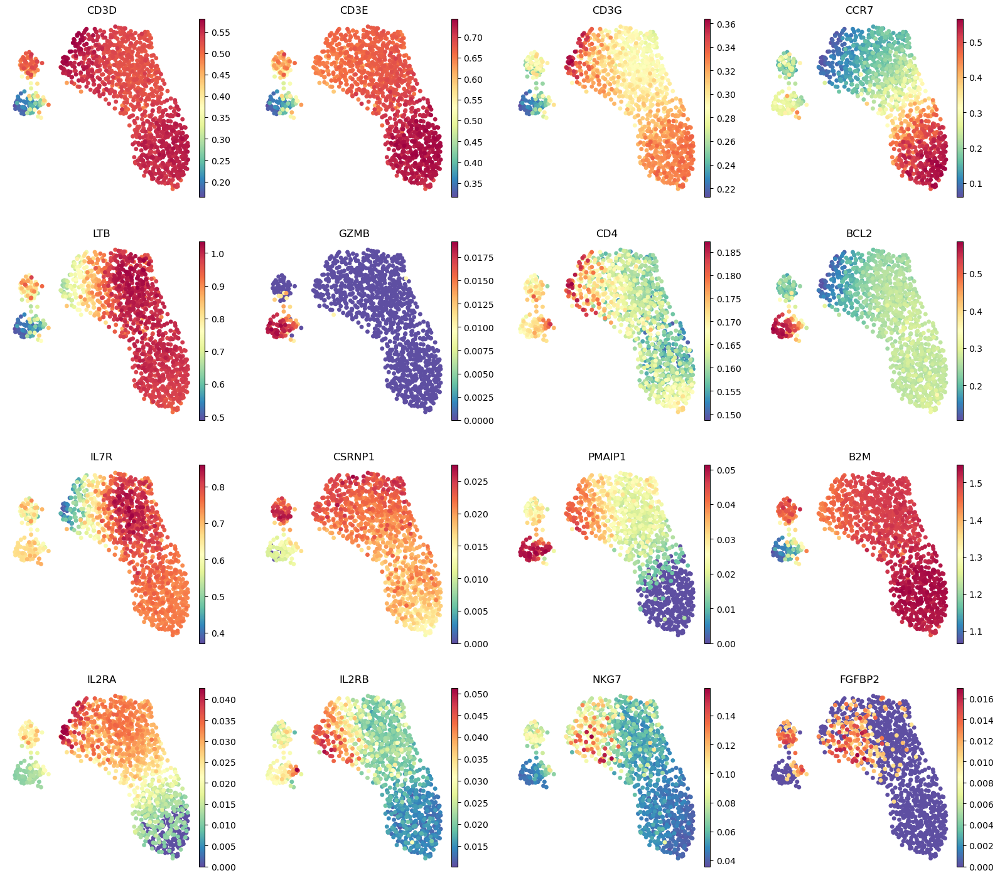

In [129]:
sc.pl.embedding(
    adata_p116,
    basis="umap",
    layer="MAGIC_imputed_data",
    color=["CD3D", "CD3E", "CD3G", "CCR7", "LTB", "GZMB", "CD4", "BCL2", "IL7R", "CSRNP1", "PMAIP1", "B2M", "IL2RA", "IL2RB", "NKG7", "FGFBP2"],
    frameon=False,save = "_markers.pdf", show = True
)

plt.show()

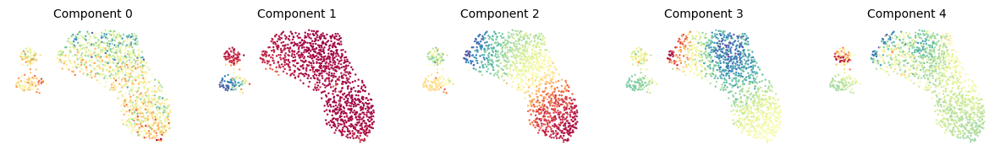

In [130]:
palantir.plot.plot_diffusion_components(adata_p116)
plt.show()

# Selecting first and last cells

In [131]:
#Select only naïve CD4+ T cells 
cells_naive_pre= adata_p116.obs[
    (adata_p116.obs['predicted.celltype.l1'] == 'CD4 T') 
].index

#  naive markers
naive_markers = ['SELL', 'CCR7', 'IL7R', 'LEF1', 'TCF7', 'BCL2']  

naive_expr = adata_p116[cells_naive_pre, naive_markers].X

# If the matrix is sparse, convert to dense
if not isinstance(naive_expr, np.ndarray):
    naive_expr = naive_expr.toarray()

# Compute mean expression of the marker genes per cell
mean_naive_expr = np.mean(naive_expr, axis=1)

# Identify the single most naïve cell
root_cell = cells_naive_pre[np.argmax(mean_naive_expr)]
print(f"Selected root cell: {root_cell}")

Selected root cell: CIH002_reseq_CCGTGGACAGTGGAGT-1


In [132]:
cell_id = "CIH002_reseq_CCGTGGACAGTGGAGT-1"

# is the cell there?
if cell_id not in adata_p116.obs_names:
    raise KeyError(f"La célula {cell_id} no está en adata_p116.obs_names")

# which cell type?
display(adata_p116.obs.loc[cell_id])

AvgDistanceToRef                                      49.574985
RNA_MERGED_clusters                                           3
nCount_RNA                                                937.0
nGene                                                     716.0
nUMI                                                      937.0
percent.mito                                           4.909285
predicted.celltype.l1                                     CD4 T
predicted.celltype.l2                                 CD4 Naive
subsample                                    c. 4 Months P116RS
leiden                                                        7
leiden_res_0.30                                               2
leiden_res_0.50                                               3
leiden_res_0.60                                               3
cell_type_lvl1                                             Teff
CD69                                                        0.0
HLA_DR                                  

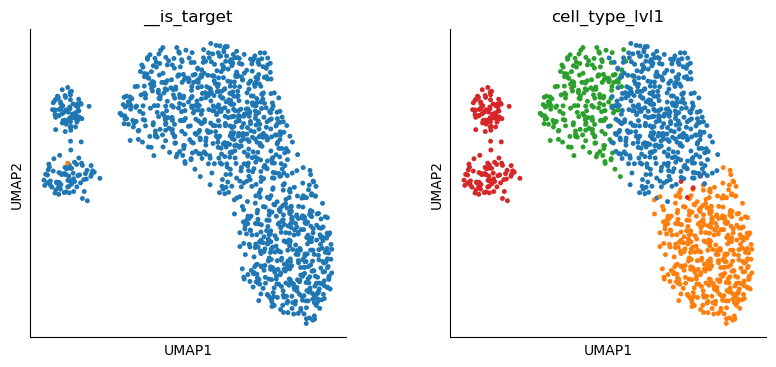

In [133]:
cell_id = "CIH002_reseq_CCGTGGACAGTGGAGT-1"

# column for highlighting the cell
adata_p116.obs["__is_target"] = (adata_p116.obs_names == cell_id)

# Plot UMAP and color by that column
sc.pl.umap(adata_p116, color=["__is_target", "cell_type_lvl1"], size=50, cmap="viridis", legend_loc=None)

# (optional) drop the temporary column afterwards
adata_p116.obs.drop(columns="__is_target", inplace=True)

In [134]:
# Activated effector markers
cd4_cells = adata_p116.obs[
    adata_p116.obs['predicted.celltype.l1'] == 'CD4 T'
].index

# Markers
effector_markers = ['COTL1','CD74', 'CORO1A', 'HLA-DRB1']

# Calcular expresión media de marcadores por célula
cd4_expr = adata_p116[cd4_cells][:, effector_markers].X.mean(axis=1)

# Obtener índice de la célula con mayor expresión de marcadores efectores
Eff_terminal_cell = cd4_cells[np.argmax(cd4_expr)]

print(f"Selected effector terminal cell: {Eff_terminal_cell}")


Selected effector terminal cell: CIH001_reseq_TATTACCAGTACACCT-1


In [135]:
terminal_states = pd.Series(
    ["Effector"],
    index=["CIH001_reseq_TATTACCAGTACACCT-1"],
)

In [136]:
cell_id = "CIH001_reseq_TATTACCAGTACACCT-1"

# is the cell there?
if cell_id not in adata_p116.obs_names:
    raise KeyError(f"the cell {cell_id} is not in adata_p116.obs_names")

# which cell type?
display(adata_p116.obs.loc[cell_id])

AvgDistanceToRef                                 43.494685
RNA_MERGED_clusters                                      1
nCount_RNA                                           250.0
nGene                                                210.0
nUMI                                                 250.0
percent.mito                                           0.4
predicted.celltype.l1                                CD4 T
predicted.celltype.l2                              CD4 TCM
subsample                          a. Pre-Treatment P116RS
leiden                                                   8
leiden_res_0.30                                          2
leiden_res_0.50                                          4
leiden_res_0.60                                          4
cell_type_lvl1                                        Teff
CD69                                                   0.0
HLA_DR                                            1.790251
STAT1_ISG_score                                  -0.0955

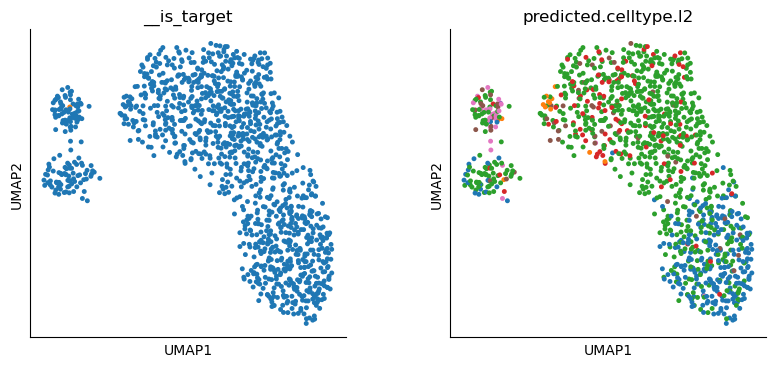

In [137]:
cell_id = "CIH001_reseq_TATTACCAGTACACCT-1"

# column for highlighting the cell
adata_p116.obs["__is_target"] = (adata_p116.obs_names == cell_id)

# Plot UMAP and color by that column
sc.pl.umap(adata_p116, color=["__is_target", "predicted.celltype.l2"], size=50, cmap="viridis", legend_loc=None)

# (optional) drop the temporary column afterwards
adata_p116.obs.drop(columns="__is_target", inplace=True)

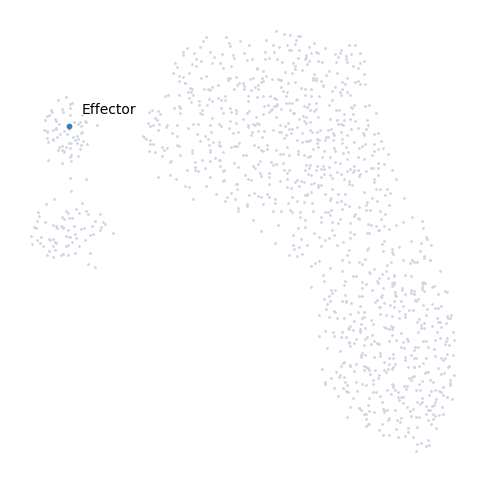

In [138]:
palantir.plot.highlight_cells_on_umap(adata_p116, terminal_states)
plt.show()

In [139]:
adata_p116.obsm['DM_EigenVectors_multiscaled'] = dm_res['EigenVectors'].values

In [140]:
start_cell = "CIH002_reseq_CCGTGGACAGTGGAGT-1"
pr_res = palantir.core.run_palantir(
    adata_p116, start_cell, num_waypoints=500, terminal_states=terminal_states
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.0007091879844665528 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.05916552543640137 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9995
Correlation at iteration 2: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [141]:
adata_p116.obs['pseudotime'] = pr_res.pseudotime.values

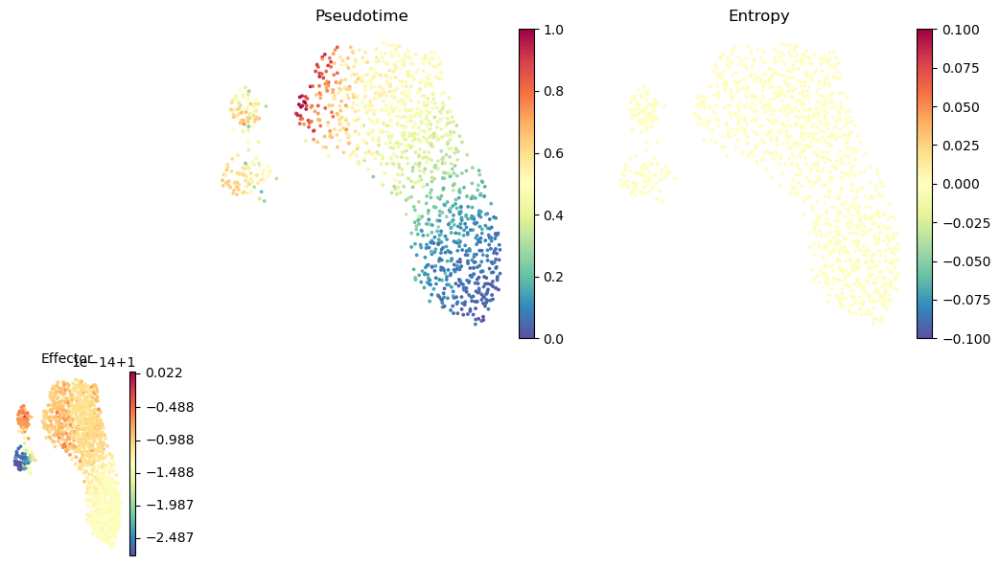

In [142]:
palantir.plot.plot_palantir_results(adata_p116, s=3)
plt.show()

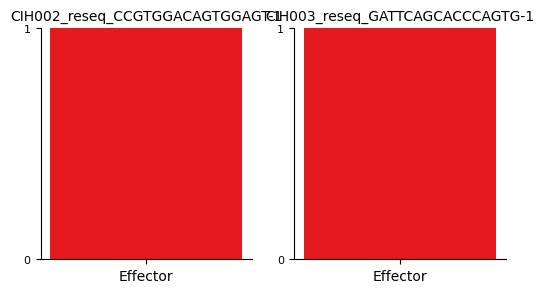

In [143]:
cells = [
    "CIH002_reseq_CCGTGGACAGTGGAGT-1",
    "CIH003_reseq_GATTCAGCACCCAGTG-1",
     
]
palantir.plot.plot_terminal_state_probs(adata_p116, cells)
plt.show()

In [144]:
#### Density curves
##### Prepare branch-specific pseudotime from Palantir results #####
import numpy as np
import pandas as pd

# palantir_res.pseudotime: pd.Series (index = cell IDs)
# palantir_res.branch_probs: pd.DataFrame (index = cell IDs, columns = branches)

pseudotime = pr_res.pseudotime
branch_probs = pr_res.branch_probs

# Align indices to be safe
branch_probs = branch_probs.loc[pseudotime.index]

# Simple way to get branch-specific pseudotime:
# pt[cell, branch] = global_pseudotime[cell] * branch_probability[cell, branch]
pt = branch_probs.multiply(pseudotime, axis=0)  # DataFrame: n_cells x n_branches

# Optional: set values to NaN when branch probability is too low (to avoid coloring all cells)
prob_threshold = 0.5
pt = pt.where(branch_probs > prob_threshold)


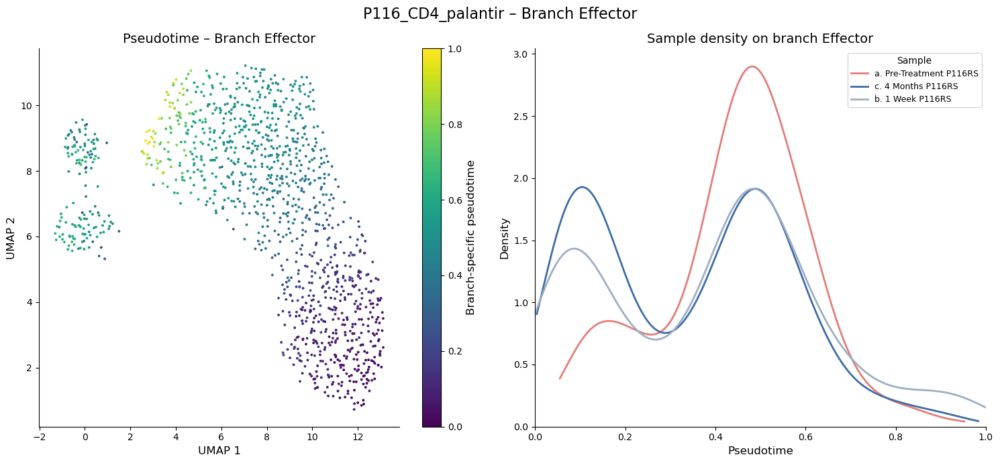

Saved: /lustre1/project/stg_00187/users/Cecilia/Data/5_Trajectory/v4/P116_CD4/P116_CD4_palantir_branch_1.pdf


In [145]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.stats import gaussian_kde

# --------------------------------------------------
# CONFIGURATION
# --------------------------------------------------
out_dir = "/lustre1/project/stg_00187/users/Cecilia/Data/5_Trajectory/v4/P116_CD4"         # <- change
sl_name = "P116_CD4_palantir"       # <- change
os.makedirs(out_dir, exist_ok=True)

embedding_key = "X_umap"            # or "X_pca", "X_diffmap", etc.
X = adata_p116.obsm[embedding_key]       # shape (n_cells, 2)
sample_labels = adata_p116.obs["subsample"]

branch_names = pt.columns           # each column ≈ num_curve in your R loop

# Colormap and normalization for pseudotime
cmap = plt.get_cmap("viridis")
norm = Normalize(vmin=np.nanmin(pt.values), vmax=np.nanmax(pt.values))

# Custom color mapping for subsamples
sample_colors = {
    "a. Pre-Treatment P116RS": "#e47c77",
    "b. 1 Week P116RS": "#9caec4",
    "c. 4 Months P116RS": "#3d6ba9"
    # Add other samples with desired colors here
}


# Fallback colormap for any samples not specified explicitly
fallback_cmap = plt.get_cmap("tab10")

# --------------------------------------------------
# LOOP OVER BRANCHES
# --------------------------------------------------
for i, branch in enumerate(branch_names, start=1):
    pt_branch = pt[branch].values  # branch-specific pseudotime vector

    if np.all(np.isnan(pt_branch)):
        print(f"Skipping branch {branch}: all NaN")
        continue

    fig, axes = plt.subplots(1, 2, figsize=(15, 7))  # layout 1x2
    ax_scatter, ax_density = axes

    # -------------------------------
    # LEFT: EMBEDDING COLORED BY PT
    # -------------------------------
    colors = np.empty((len(pt_branch), 4))  # RGBA array
    colors[:] = (0.9, 0.9, 0.9, 0.3)       # default light gray, semi-transparent

    valid = ~np.isnan(pt_branch)
    colors[valid] = cmap(norm(pt_branch[valid]))

    ax_scatter.scatter(X[:, 0], X[:, 1], c=colors, s=8, linewidths=0)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax_scatter)
    cbar.set_label("Branch-specific pseudotime", fontsize=12)

    ax_scatter.set_title(f"Pseudotime – Branch {branch}", fontsize=14)
    ax_scatter.set_xlabel("UMAP 1", fontsize=12)
    ax_scatter.set_ylabel("UMAP 2", fontsize=12)

    # -------------------------------
    # RIGHT: SAMPLE DENSITY PLOTS
    # -------------------------------
    densities = {}
    x_min, x_max = np.inf, -np.inf
    y_max = 0

    for samp in sample_labels.unique():
        mask = (sample_labels == samp) & valid
        values = pt_branch[mask]

        if np.sum(mask) < 5:
            continue

        kde = gaussian_kde(values)
        xs = np.linspace(values.min(), values.max(), 200)
        ys = kde(xs)

        densities[samp] = (xs, ys)

        x_min = min(x_min, xs.min())
        x_max = max(x_max, xs.max())
        y_max = max(y_max, ys.max())

    if len(densities) > 0:
        ax_density.set_xlim(x_min, x_max)
        ax_density.set_ylim(0, y_max * 1.05)

        for j, (samp, (xs, ys)) in enumerate(densities.items()):
            color = sample_colors.get(samp, fallback_cmap(j % fallback_cmap.N))
            ax_density.plot(xs, ys, linewidth=2, label=samp, color=color)

    ax_density.set_xlabel("Pseudotime", fontsize=12)
    ax_density.set_ylabel("Density", fontsize=12)
    ax_density.set_title(f"Sample density on branch {branch}", fontsize=14)
    ax_density.legend(title="Sample", fontsize=9, title_fontsize=10)

    fig.suptitle(f"{sl_name} – Branch {branch}", fontsize=16)
    fig.tight_layout()

    out_file = os.path.join(out_dir, f"{sl_name}_branch_{i}.pdf")
    fig.savefig(out_file, bbox_inches="tight")
    plt.show(fig)
    plt.close(fig)

    print(f"Saved: {out_file}")


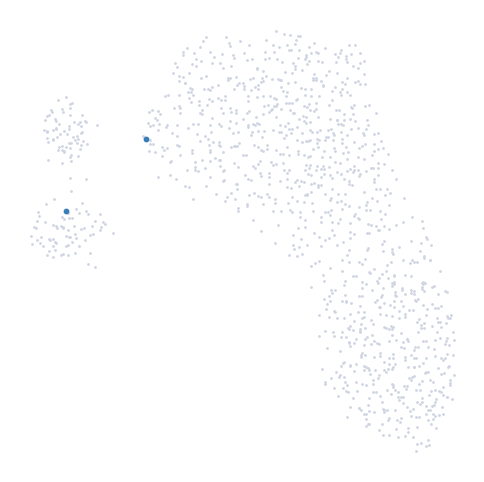

In [146]:
palantir.plot.highlight_cells_on_umap(adata_p116, cells)
plt.show()

In [147]:
masks = palantir.presults.select_branch_cells(adata_p116, q=.01, eps=.01)

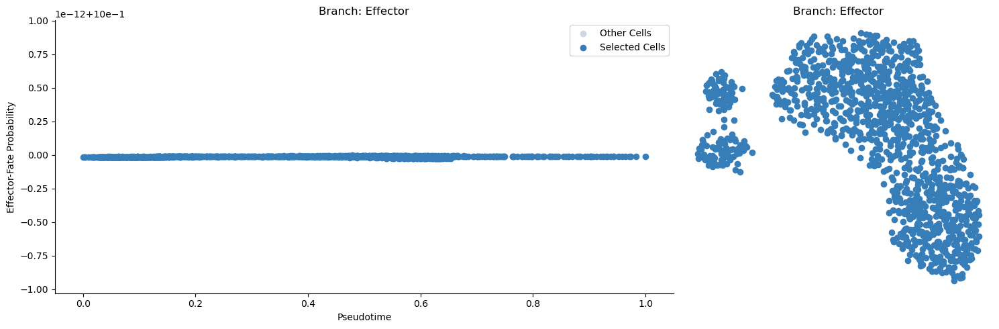

In [148]:
palantir.plot.plot_branch_selection(adata_p116)
plt.show()

[2025-12-10 22:02:26,238] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (1,216) and rank = 1.0.
[2025-12-10 22:02:26,239] [INFO    ] Using covariance function Matern52(ls=0.8910077810287476).
[2025-12-10 22:02:26,255] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-12-10 22:02:26,934] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Effector'}>

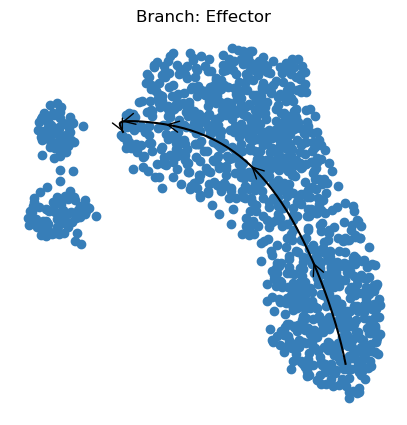

In [149]:
palantir.plot.plot_trajectory(adata_p116, "Effector")

[2025-12-10 22:02:27,528] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (1,216) and rank = 1.0.
[2025-12-10 22:02:27,528] [INFO    ] Using covariance function Matern52(ls=0.8910077810287476).
[2025-12-10 22:02:27,529] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-12-10 22:02:27,563] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Effector'}, xlabel='UMAP1', ylabel='UMAP2'>

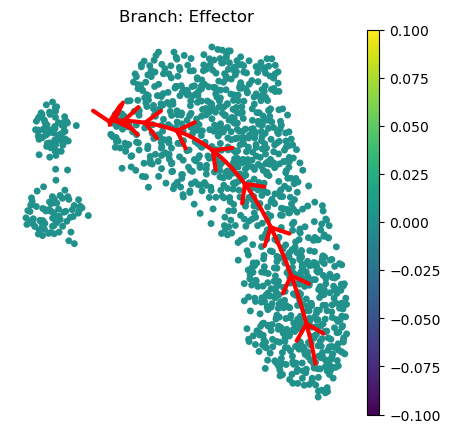

In [150]:
palantir.plot.plot_trajectory(
    adata_p116, # your anndata
    "Effector", # the branch to plot
    cell_color="palantir_entropy", # the ad.obs colum to color the cells by
    n_arrows=10, # the number of arrow heads along the path
    color="red", # the color of the path and arrow heads
    scanpy_kwargs=dict(cmap="viridis"), # arguments passed to scanpy.pl.embedding
    arrowprops=dict(arrowstyle="->,head_length=.5,head_width=.5", lw=3), # appearance of the arrow heads
    lw=3, # thickness of the path
    pseudotime_interval=(0, .9), # interval of the pseudotime to cover with the path
)

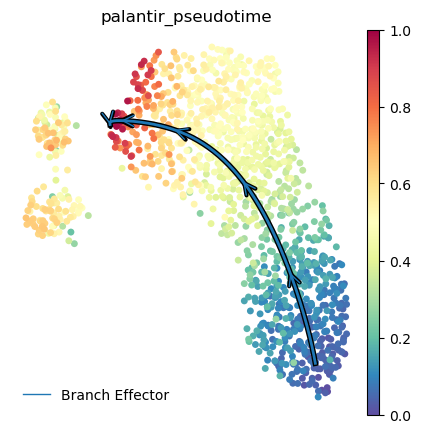

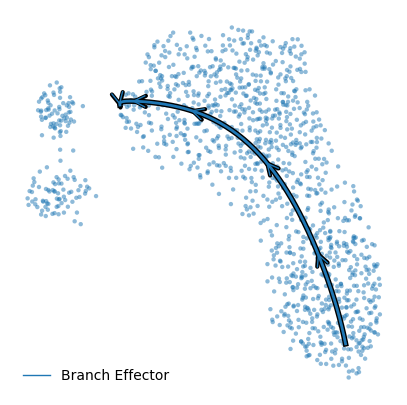

In [151]:
palantir.plot.plot_trajectories(adata_p116, pseudotime_interval=(0, .9))
plt.savefig('/lustre1/project/stg_00187/users/Cecilia/Data/5_Trajectory/v4/branch.pseudotime.pdf', dpi=300)

# When using cell_color="branch_selection" be aware of the overlap between branches:
palantir.plot.plot_trajectories(adata_p116, cell_color = "branch_selection", pseudotime_interval=(0, .9))
plt.show()

In [152]:
gene_trends = palantir.presults.compute_gene_trends(
    adata_p116,
    expression_key="MAGIC_imputed_data",
)

Effector
[2025-12-10 22:02:42,052] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (1,216) and rank = 1.0.
[2025-12-10 22:02:42,053] [INFO    ] Using covariance function Matern52(ls=1.0).
[2025-12-10 22:02:42,774] [INFO    ] Sigma interpreted as element-wise standard deviation.


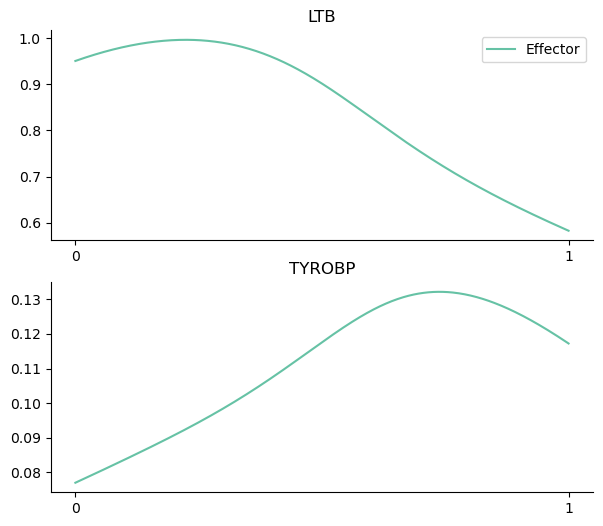

In [153]:
genes = ["LTB", "TYROBP"]
palantir.plot.plot_gene_trends(adata_p116, genes)
plt.show()

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


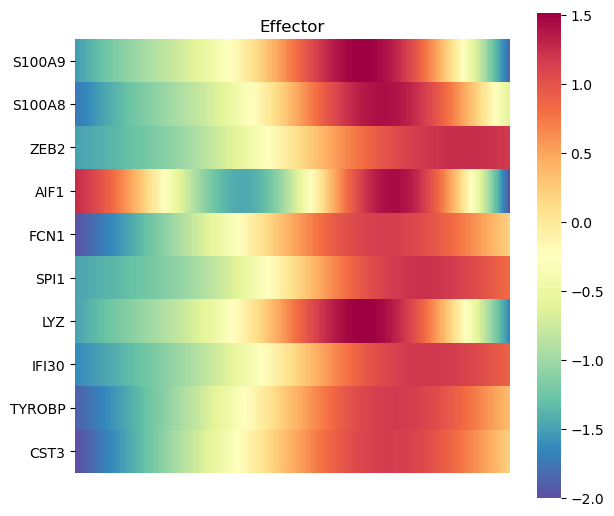

In [154]:
# Asegúrate de haber corrido este paso antes
sc.pp.highly_variable_genes(adata_p116, n_top_genes=10)

# Selecciona solo los genes marcados como altamente variables
top_genes = adata_p116.var[adata_p116.var['highly_variable']].index.tolist()

palantir.plot.plot_gene_trend_heatmaps(adata_p116, genes=top_genes)
plt.show()

# Genes on pseudotime from cytotoxic branch

In [155]:
# Definir célular citotóxicas por la branch
target_fate = "Effector"
threshold = 0.8

cells_cyto = pr_res.branch_probs.index[
    pr_res.branch_probs[target_fate] > threshold
]

# Extraer el pseudotime ya calculado para estas células
pseudotime_cyto = adata_p116.obs.loc[cells_cyto, 'pseudotime'].values

# Extraer expresión
X = adata_p116[cells_cyto, :].X
gene_names = adata_p116.var_names
X = pd.DataFrame(X, columns=gene_names, index=cells_cyto)

# Eliminar genes que sean todo ceros
genes_to_test = X.columns[X.sum(axis=0) > 0]



In [150]:
pvals = []
r2_scores = []
smooth_values = []

# Convertir pseudotime a 2D para pygam
X_pt = pseudotime_cyto.reshape(-1, 1)

# Grid común para predicción (100 puntos equiespaciados)
grid = np.linspace(X_pt.min(), X_pt.max(), 100).reshape(-1, 1)

# Ajustar modelos GAM por gen
for gene in tqdm(genes_to_test, desc="Fitting GAMs"):
    y = X[gene].values
    model = GAM(s(0)).fit(X_pt, y)
    
    pvals.append(model.statistics_['p_values'][1])
    r2_scores.append(model.statistics_['pseudo_r2']['explained_deviance'])
    
    smooth = model.predict(grid)
    smooth_values.append(smooth)

Fitting GAMs: 100%|██████████| 14158/14158 [02:45<00:00, 85.29it/s]


In [151]:
# Ajuste de p-valores
_, adj_pvals, _, _ = multipletests(pvals, method='fdr_bh')

# Guardar resultados
gam_results = pd.DataFrame({
    'gene': genes_to_test,
    'pval': pvals,
    'adj_pval': adj_pvals,
    'r2': r2_scores
}).set_index('gene')

# Filtrar por significancia (p.adj < 0.01)
significant_genes = gam_results[gam_results['adj_pval'] < 0.01].index.tolist()

# Expresiones suavizadas para genes significativos
smooth_matrix = np.array([smooth_values[i] for i, gene in enumerate(genes_to_test) if gene in significant_genes])


In [152]:
# Manhattan distance
dist_mat = pdist(smooth_matrix, metric='cityblock')
linkage_mat = linkage(dist_mat, method='average')

# Asignar clústeres
clusters = fcluster(linkage_mat, t=6, criterion='maxclust')


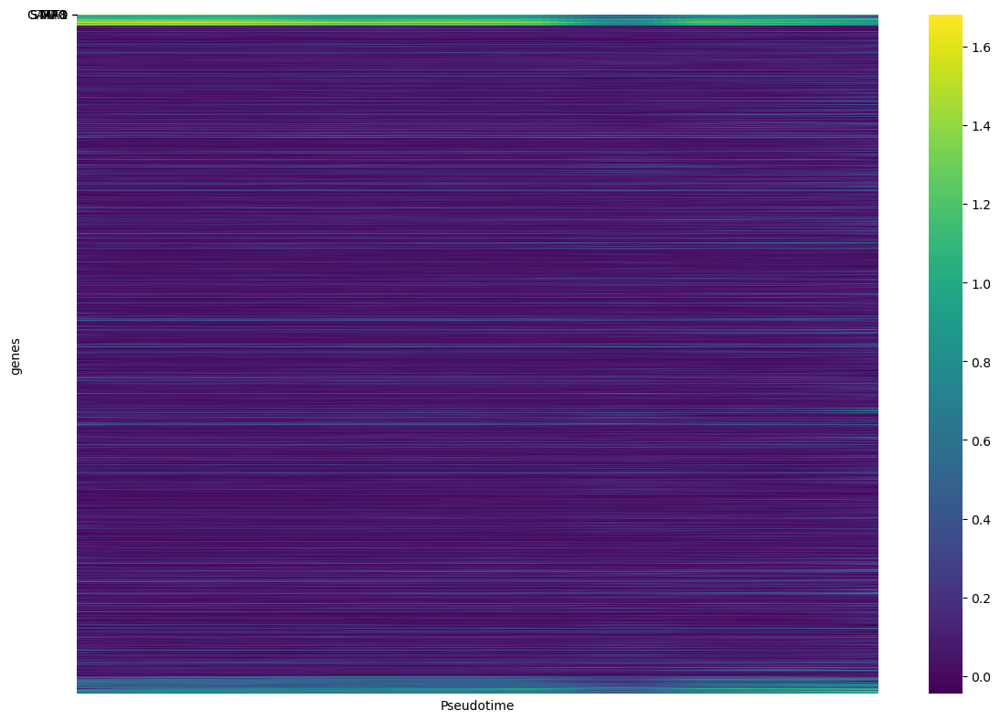

In [153]:
# Crear dataframe con anotaciones
heatmap_df = pd.DataFrame(smooth_matrix, index=significant_genes)
heatmap_df['cluster'] = clusters
heatmap_df = heatmap_df.sort_values('cluster')
heatmap_values = heatmap_df.drop(columns='cluster')

# Opcional: genes a anotar

label_genes = ["STAT1", "GATA1", "MPO", "IRF8"]
heatmap_values_filtered = heatmap_values.loc[heatmap_values.index.intersection(label_genes)]

# Generar heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    heatmap_values,
    cmap='viridis',       
    yticklabels=label_genes,     
    xticklabels=False
)

plt.xlabel("Pseudotime")
plt.ylabel("genes")
plt.tight_layout()
plt.show()


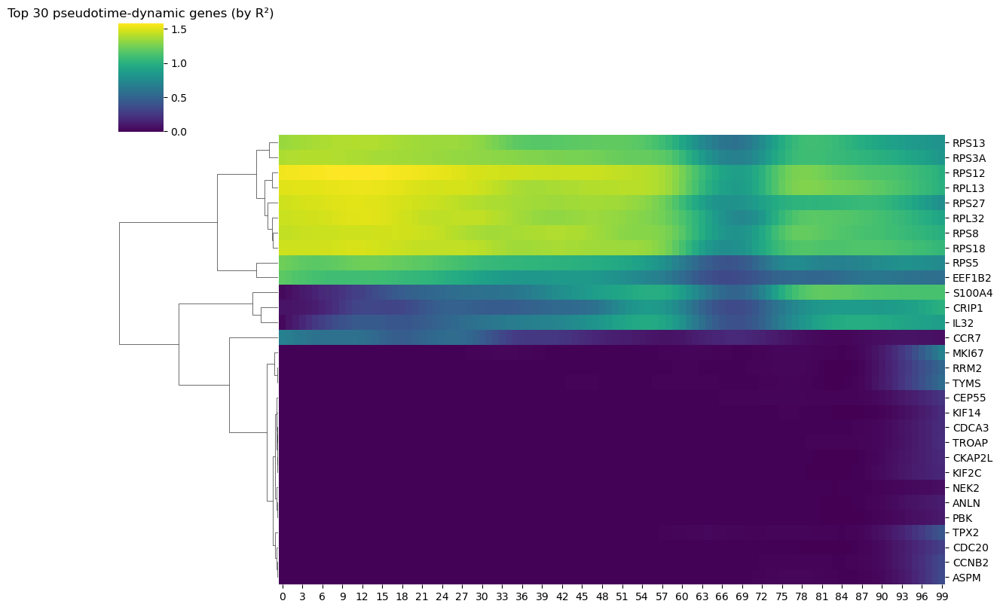

In [154]:
smooth_df = pd.DataFrame(smooth_matrix, index=significant_genes)
smooth_df_scaled = pd.DataFrame(
    StandardScaler().fit_transform(smooth_df),
    index=smooth_df.index,
    columns=smooth_df.columns
)
top_n = 30  # Muestra los 30 más dinámicos

top_genes = gam_results.loc[significant_genes].sort_values('r2', ascending=False).head(top_n).index.tolist()
filtered_df = smooth_df.loc[top_genes]

sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    yticklabels=True
)
plt.title(f"Top {top_n} pseudotime-dynamic genes (by R²)")
plt.show()

In [155]:
adata_p116.obs['subsample'].value_counts()

subsample
c. 4 Months P116RS         586
b. 1 Week P116RS           412
a. Pre-Treatment P116RS    260
Name: count, dtype: int64

In [156]:
group_map = {
    "a. Pre-Treatment P116RS": "Pre-Treatment",
    "b. 1 Week P116RS": "1 Week After",
    "c. 4 Months P116RS": "4 Months After"}

In [157]:
# Crear la columna treatment_group solo para las células citotóxicas
adata_p116.obs.loc[cells_cyto, 'treatment_group'] = adata_p116.obs.loc[cells_cyto, 'subsample'].map(group_map)

# Filtrar solo las células citotóxicas con grupo válido
filtered = adata_p116.obs.loc[cells_cyto].dropna(subset=['treatment_group']).copy()

# Usar el pseudotime ya calculado (pseudotime_cyto)
filtered['pseudotime_cyto'] = pseudotime_cyto[:len(filtered)]


group_means = filtered.groupby('treatment_group')['pseudotime_cyto'].mean()


print(group_means)


treatment_group
Pre-Treatment     0.466627
1 Week After      0.405544
4 Months After    0.365755
Name: pseudotime_cyto, dtype: float64


/tmp/ipykernel_2774676/2768824826.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_means = filtered.groupby('treatment_group')['pseudotime_cyto'].mean()


In [158]:
# Definir pseudo_lin usando la grilla existente
pseudo_lin = grid

# Asignar a cada punto el grupo más cercano según pseudotime medio
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

In [159]:
palette = {
    "Pre-Treatment": "#1f77b4",
    "1 Week After": "#ff7f0e",
    "4 Months After": "#2ca02c"
}
col_colors = pd.Series(group_labels, index=range(100)).map(palette)

In [160]:
print(pd.Series(group_labels).value_counts())

Pre-Treatment     56
4 Months After    39
1 Week After       5
Name: count, dtype: int64


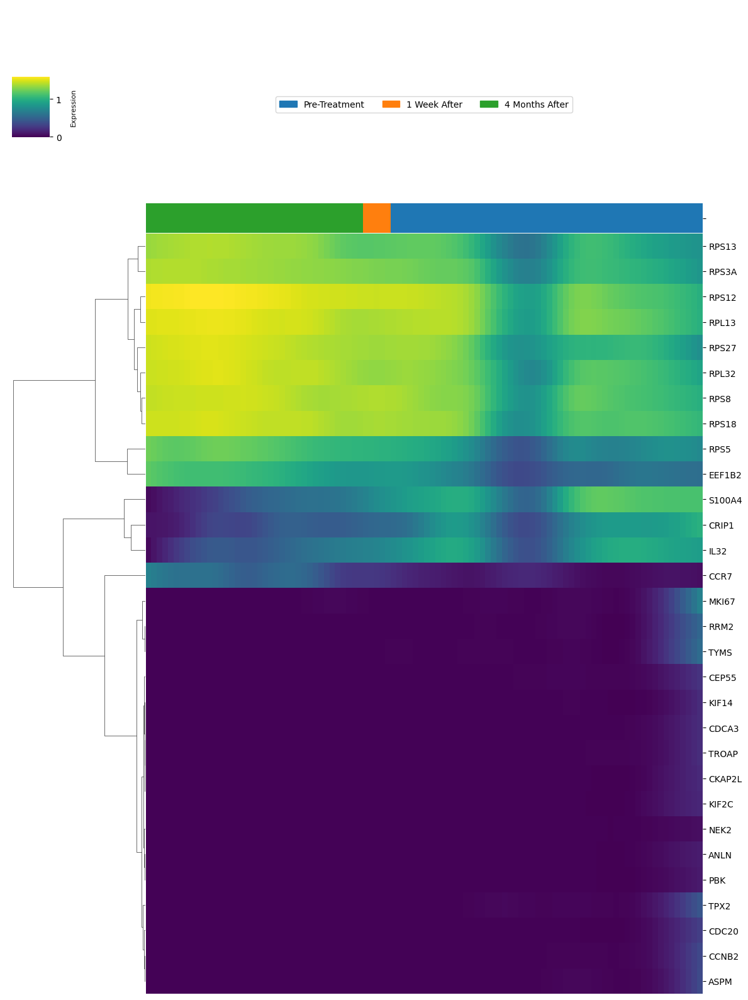

In [161]:
import matplotlib.patches as mpatches
g = sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 16),
    yticklabels=True,
    xticklabels=False,
    col_colors=col_colors
)

# Agregar leyenda para los time points (col_colors)
handles_col = [
    mpatches.Patch(color=color, label=label)
    for label, color in palette.items()
]
# Leyenda para columnas (time points)
g.ax_col_dendrogram.legend(
    handles=handles_col,
    loc="center",
    bbox_to_anchor=(0.5, 0.5),
    ncol=3,
    fontsize="medium"
)
cbar = g.cax
cbar.tick_params(labelsize=10)  
cbar.set_ylabel("Expression", fontsize=8, labelpad=10)  
cbar.set_aspect(1) 
plt.show()


# Regulons along pseudotime from cytotoxic branch

In [162]:
# --- 1. Extraer los valores de AUC solo para las células citotóxicas ---
cells_mask = adata_p116.obs_names.isin(cells_cyto)

regulon_names = list(adata_p116.uns['Regulons_tuples'].dtype.names)
regulon_auc_df = pd.DataFrame(
    adata_p116.obsm['RegulonsAUC'][cells_mask, :],
    columns=regulon_names,
    index=adata_p116.obs_names[cells_mask]
)

# --- 2. Asegurar que los valores sean numéricos ---
regulon_auc_df = regulon_auc_df.apply(pd.to_numeric, errors='coerce').fillna(0)

# --- 3. Crear Series de pseudotime con el mismo índice ---
pseudotime_cyto = adata_p116.obs.loc[cells_cyto, "pseudotime"]
pseudotime_cyto = pd.Series(pseudotime_cyto.values, index=regulon_auc_df.index)

In [163]:
gam_results = {}

for regulon in tqdm(regulon_auc_df.columns, desc="Fitting GAMs on regulons"):
    y = regulon_auc_df[regulon].values
    x = pseudotime_cyto.values.reshape(-1, 1)

    # Evitar errores por datos sin varianza o con NaNs
    if np.all(y == 0) or np.var(y) == 0 or np.isnan(y).any():
        continue

    gam = GAM(s(0, n_splines=5)).fit(x, y)
    y_pred = gam.predict(x)

    gam_results[regulon] = {
        'model': gam,
        'y_pred': y_pred,
        'y_var': np.var(y_pred),
        'auc_range': y_pred.max() - y_pred.min()
    }

print(f"Modelados {len(gam_results)} regulones con éxito.")


Fitting GAMs on regulons: 100%|██████████| 212/212 [00:02<00:00, 104.77it/s]

Modelados 212 regulones con éxito.


/tmp/ipykernel_2774676/1180852425.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)
/tmp/ipykernel_2774676/1180852425.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)
/tmp/ipykernel_2774676/1180852425.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at o

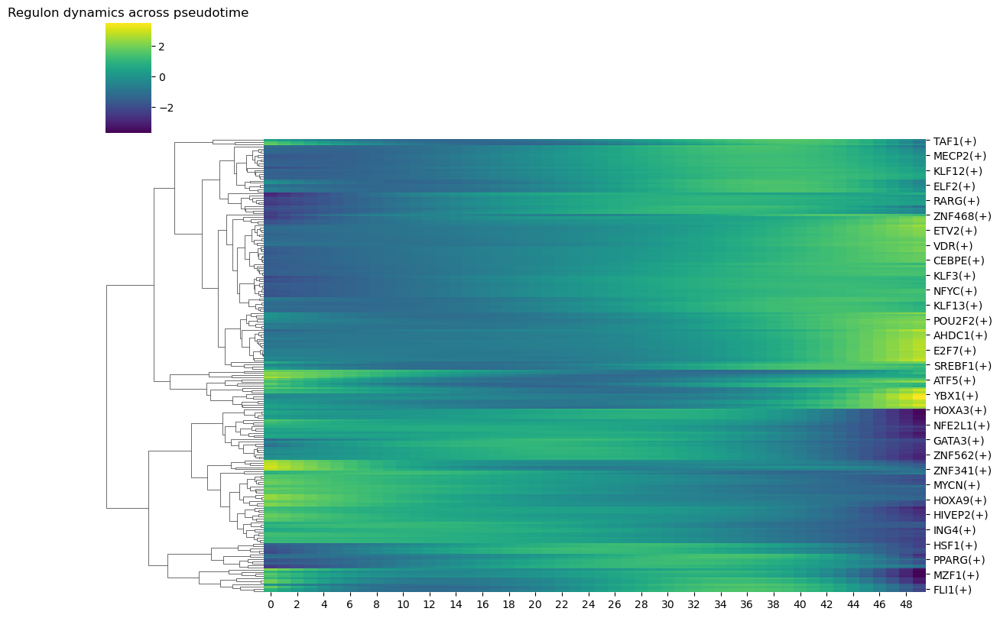

In [164]:
# Crear una matriz de predicciones normalizadas
n_points = 100
pseudo_lin = np.linspace(pseudotime_cyto.min(), pseudotime_cyto.max())

smooth_df = pd.DataFrame()
for regulon, res in gam_results.items():
    y_smooth = res['model'].predict(pseudo_lin)
    smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)

smooth_df = smooth_df.T  # Transponer
smooth_df.index = list(gam_results.keys()) 

# Clustermap estilo Seurat heatmap
sns.clustermap(smooth_df, cmap='viridis', col_cluster=False, figsize=(12, 8))
plt.title("Regulon dynamics across pseudotime")
plt.show()

In [ ]:
"""regulons_to_plot = ['IRF1(+)', 'IRF4(+)', 'IRF7(+)','STAT1(+)']

# Identidad celular (usada para colorear los puntos)
cell_groups = cd4_adata.obs['predicted.celltype.l1']  # ajusta si se llama diferente

# Crear subplots
n_cols = 4
n_rows = int(np.ceil(len(regulons_to_plot) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3), sharex=True)

for idx, regulon in enumerate(regulons_to_plot):
    row, col = divmod(idx, n_cols)
    ax = axes[row, col] if n_rows > 1 else axes[col]

    x = pseudotime.values
    y = regulon_auc_df[regulon].values

    # Scatterplot por grupo
    groups = cell_groups.unique()
    for group in groups:
        mask = cell_groups == group
        ax.scatter(x[mask], y[mask], label=group, alpha=0.5, s=10)

    # GAM suavizado
    gam = GAM(s(0, n_splines=5)).fit(x.reshape(-1, 1), y)
    x_pred = np.linspace(x.min(), x.max(), 200)
    y_pred = gam.predict(x_pred)
    ax.plot(x_pred, y_pred, color='black')

    # Ejes y título
    ax.set_title(f"{regulon.replace('(+)', '')}-regulon", fontsize=10)
    ax.set_xlabel("Pseudotime")
    ax.set_ylabel("AUC")

# Ajustes finales
plt.tight_layout()
fig.legend(loc='lower center', ncol=len(groups), bbox_to_anchor=(0.5, -0.01))
plt.show()"""

In [ ]:
"""# Filtrar células deseadas
subset_mask = cd4_adata.obs['predicted.celltype.l2'].isin(['CD4 Naive', 'CD4 TCM'])
adata_subset = cd4_adata[subset_mask]

# Subconjuntos
pseudotime_subset = pseudotime[subset_mask]
regulon_auc_subset = regulon_auc_df.loc[subset_mask]
cell_groups_subset = adata_subset.obs['predicted.celltype.l2']  # para colorear"""

In [165]:
group_map = {
    "a. Pre-Treatment P116RS": "Pre-Treatment",
    "b. 1 Week P116RS": "1 Week After",
    "c. 4 Months P116RS": "4 Months After"}


In [166]:
# Crear columna de grupo de tratamiento para las células citotóxicas
adata_p116.obs.loc[cells_cyto, "treatment_group"] = (
    adata_p116.obs.loc[cells_cyto, "subsample"].map(group_map)
)

# Filtrar solo las células citotóxicas con tratamiento válido
filtered = adata_p116.obs.loc[
    adata_p116.obs_names.isin(cells_cyto) &
    adata_p116.obs["treatment_group"].notna(),
    ["treatment_group", "pseudotime"]
]

# Agrupar por grupo y obtener pseudotime promedio
group_means = filtered.groupby("treatment_group")["pseudotime"].mean()

print(group_means)



treatment_group
Pre-Treatment     0.466627
1 Week After      0.405544
4 Months After    0.365755
Name: pseudotime, dtype: float64


/tmp/ipykernel_2774676/4286821455.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_means = filtered.groupby("treatment_group")["pseudotime"].mean()


In [167]:
# Para cada punto en pseudo_lin, asignar el grupo de tratamiento más cercano
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)


In [168]:
palette = {
    "Pre-Treatment": "#1f77b4",
    "1 Week After": "#ff7f0e",
    "4 Months After": "#2ca02c"
}
col_colors = pd.Series(group_labels, index=smooth_df.columns).map(palette)


/data/leuven/344/vsc34467/miniconda3/envs/scvelo_env/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


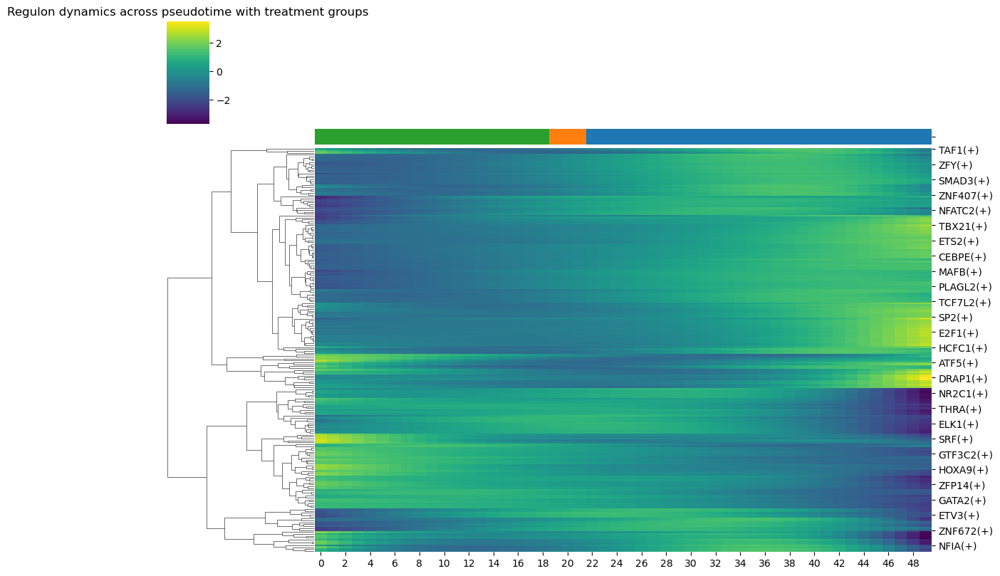

In [169]:
sns.clustermap(
    smooth_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    col_colors=col_colors
)
plt.title("Regulon dynamics across pseudotime with treatment groups")
plt.show()


/data/leuven/344/vsc34467/miniconda3/envs/scvelo_env/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


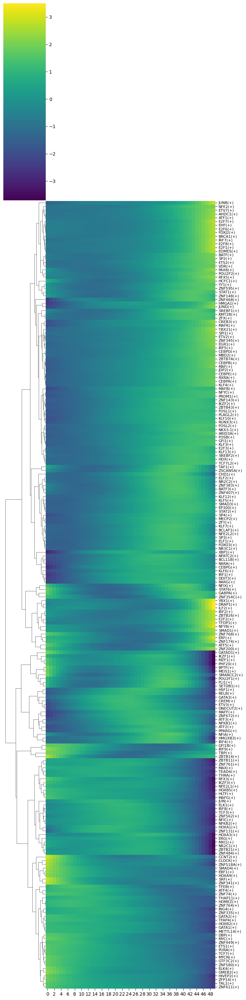

In [250]:
# Create clustermap
g = sns.clustermap(
    smooth_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(10, 30),
    yticklabels=True  # ensure they are drawn
)

# Improve label visibility
g.ax_heatmap.set_yticklabels(
    g.ax_heatmap.get_ymajorticklabels(),
    fontsize=8,        # increase or decrease as needed
    rotation=0,        # horizontal for readability
)

# Make sure margins are not cutting labels
plt.subplots_adjust(left=0.25)  # more space for y-labels
plt.savefig("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/unsupervised_withCTL.pdf", dpi=300)
plt.show()


# Genes on pseudotime recalculated on the cytotoxic branch only

In [170]:
# defining the destiny of one branch
target_fate = "Effector"   
threshold = 0.2           

cells_cyto = pr_res.branch_probs.index[pr_res.branch_probs[target_fate] > threshold]
adata_cyto = adata_p116[cells_cyto, :].copy()  
terminal_cyto = terminal_states.loc[terminal_states == 'Effector']

In [171]:
pr_res_cyto = palantir.core.run_palantir(
    adata_cyto,
    start_cell,
    terminal_states=terminal_cyto,
    num_waypoints=300
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.0006026268005371094 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/apps/leuven/rocky8/icelake/2023a/software/Python-bundle-PyPI/2023.06-GCCcore-12.3.0/lib/python3.11/site-packages/joblib/externals/loky/backend/fork_exec.py:37: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Time for shortest paths: 0.07073818445205689 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9992
Correlation at iteration 2: 0.9999
Correlation at iteration 3: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [172]:
adata_cyto.obs['pseudotime_cyto'] = pr_res_cyto.pseudotime.values

In [173]:
X = adata_cyto.raw.X if adata_cyto.raw is not None else adata_cyto.X
gene_names = adata_cyto.raw.var_names if adata_cyto.raw is not None else adata_cyto.var_names
X = pd.DataFrame(X, columns=gene_names, index=adata_cyto.obs_names)

In [174]:
genes_to_test = X.columns[X.sum(axis=0) > 0]
print(f"Genes a modelar: {len(genes_to_test)}")

Genes a modelar: 14158


In [175]:
pvals = []
r2_scores = []
smooth_values = []

# Pseudotime 2D
X_pt = adata_cyto.obs["pseudotime"].values.reshape(-1, 1)
grid = np.linspace(X_pt.min(), X_pt.max(), 100).reshape(-1, 1)

for gene in tqdm(genes_to_test, desc="Fitting GAMs"):
    y = X[gene].values
    model = GAM(s(0)).fit(X_pt, y)
    
    pvals.append(model.statistics_['p_values'][1])
    r2_scores.append(model.statistics_['pseudo_r2']['explained_deviance'])
    
    smooth = model.predict(grid)
    smooth_values.append(smooth)

Fitting GAMs: 100%|██████████| 14158/14158 [02:45<00:00, 85.77it/s]


In [176]:
# Ajuste de p-valores
_, adj_pvals, _, _ = multipletests(pvals, method='fdr_bh')

# Guardar resultados
gam_results = pd.DataFrame({
    'gene': genes_to_test,
    'pval': pvals,
    'adj_pval': adj_pvals,
    'r2': r2_scores
}).set_index('gene')

# Filtrar por significancia (p.adj < 0.01)
significant_genes = gam_results[gam_results['adj_pval'] < 0.01].index.tolist()

# Expresiones suavizadas para genes significativos
smooth_matrix = np.array([smooth_values[i] for i, gene in enumerate(genes_to_test) if gene in significant_genes])


In [177]:
# Manhattan distance
dist_mat = pdist(smooth_matrix, metric='cityblock')
linkage_mat = linkage(dist_mat, method='average')

# Asignar clústeres
clusters = fcluster(linkage_mat, t=6, criterion='maxclust')


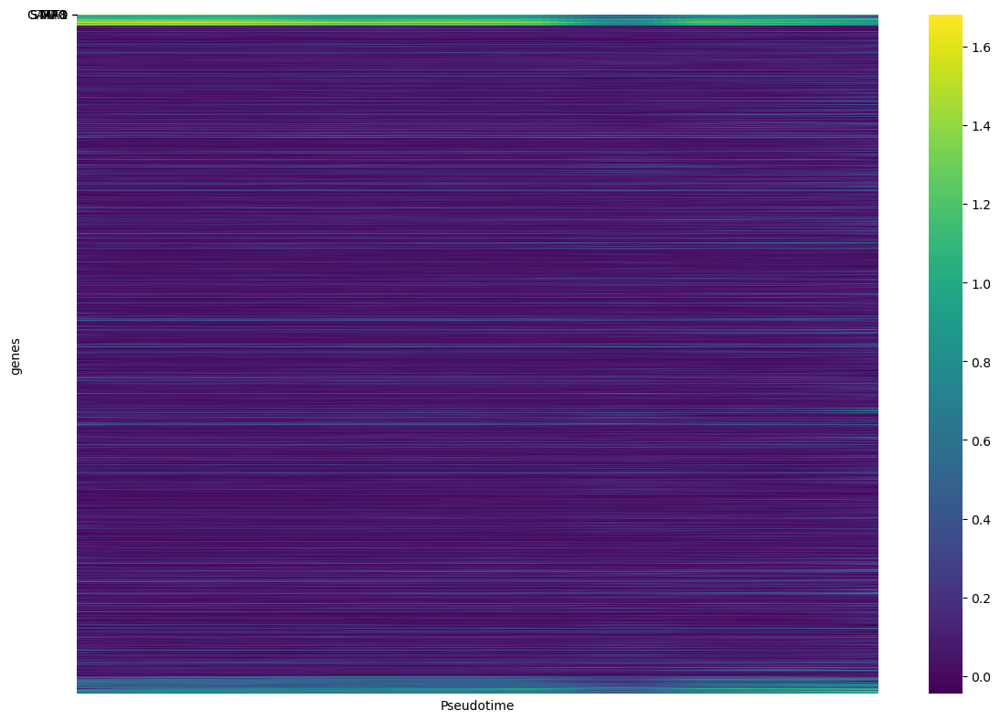

In [178]:
# Crear dataframe con anotaciones
heatmap_df = pd.DataFrame(smooth_matrix, index=significant_genes)
heatmap_df['cluster'] = clusters
heatmap_df = heatmap_df.sort_values('cluster')
heatmap_values = heatmap_df.drop(columns='cluster')

# Opcional: genes a anotar

label_genes = ["STAT1", "GATA1", "MPO", "IRF8"]
heatmap_values_filtered = heatmap_values.loc[heatmap_values.index.intersection(label_genes)]

# Generar heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    heatmap_values,
    cmap='viridis',       
    yticklabels=label_genes,     
    xticklabels=False
)

plt.xlabel("Pseudotime")
plt.ylabel("genes")
plt.tight_layout()
plt.show()


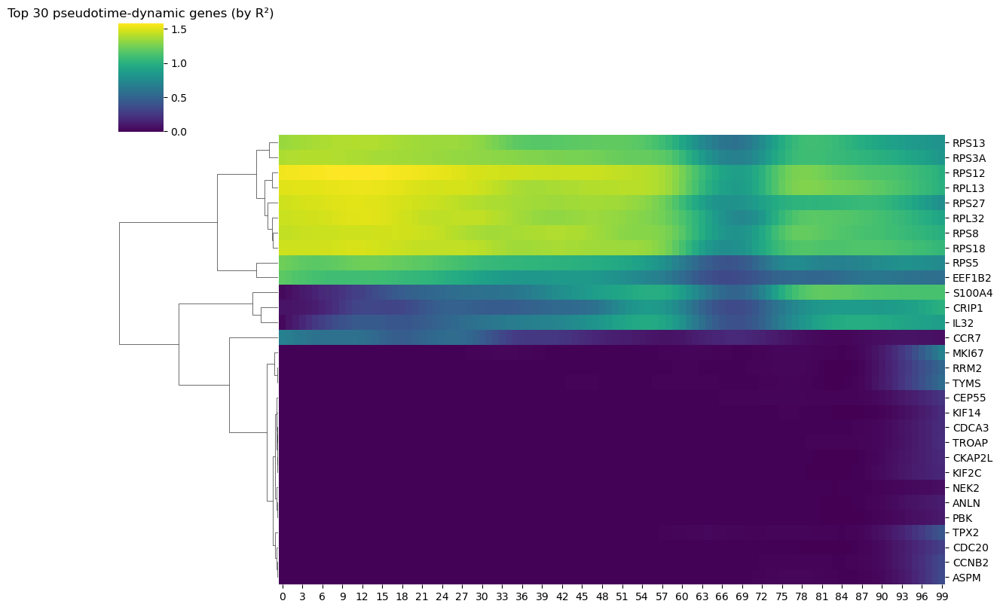

In [179]:
smooth_df = pd.DataFrame(smooth_matrix, index=significant_genes)
smooth_df_scaled = pd.DataFrame(
    StandardScaler().fit_transform(smooth_df),
    index=smooth_df.index,
    columns=smooth_df.columns
)
top_n = 30  # Muestra los 30 más dinámicos

top_genes = gam_results.loc[significant_genes].sort_values('r2', ascending=False).head(top_n).index.tolist()
filtered_df = smooth_df.loc[top_genes]

sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    yticklabels=True
)
plt.title(f"Top {top_n} pseudotime-dynamic genes (by R²)")
plt.show()

In [180]:
group_map = {
    "a. Pre-Treatment P116RS": "Pre-Treatment",
    "b. 1 Week P116RS": "1 Week After",
    "c. 4 Months P116RS": "4 Months After"}

In [181]:
# Crear una columna con la fase del tratamiento
adata_cyto.obs['treatment_group'] = adata_cyto.obs['subsample'].map(group_map)

# Quitar células que no están en el mapeo
filtered = adata_cyto.obs.dropna(subset=['treatment_group'])

# Agrupar por grupo y obtener el pseudotime promedio
group_means = filtered.groupby('treatment_group')['pseudotime'].mean()
print(group_means)

treatment_group
Pre-Treatment     0.466627
1 Week After      0.405544
4 Months After    0.365755
Name: pseudotime, dtype: float64


/tmp/ipykernel_2774676/372699049.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_means = filtered.groupby('treatment_group')['pseudotime'].mean()


In [182]:
# Definir pseudo_lin usando la grilla existente
pseudo_lin = grid

# Asignar a cada punto el grupo más cercano según pseudotime medio
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

In [183]:
palette = {
    "Pre-Treatment": "#1f77b4",    # azul
    "1 Week After": "#ff7f0e",  # naranja
    "4 Months After": "#2ca02c"    # verde
}

In [184]:
col_colors = pd.Series(group_labels, index=range(100)).map(palette)

In [185]:
print(pd.Series(group_labels).value_counts())

Pre-Treatment     56
4 Months After    39
1 Week After       5
Name: count, dtype: int64


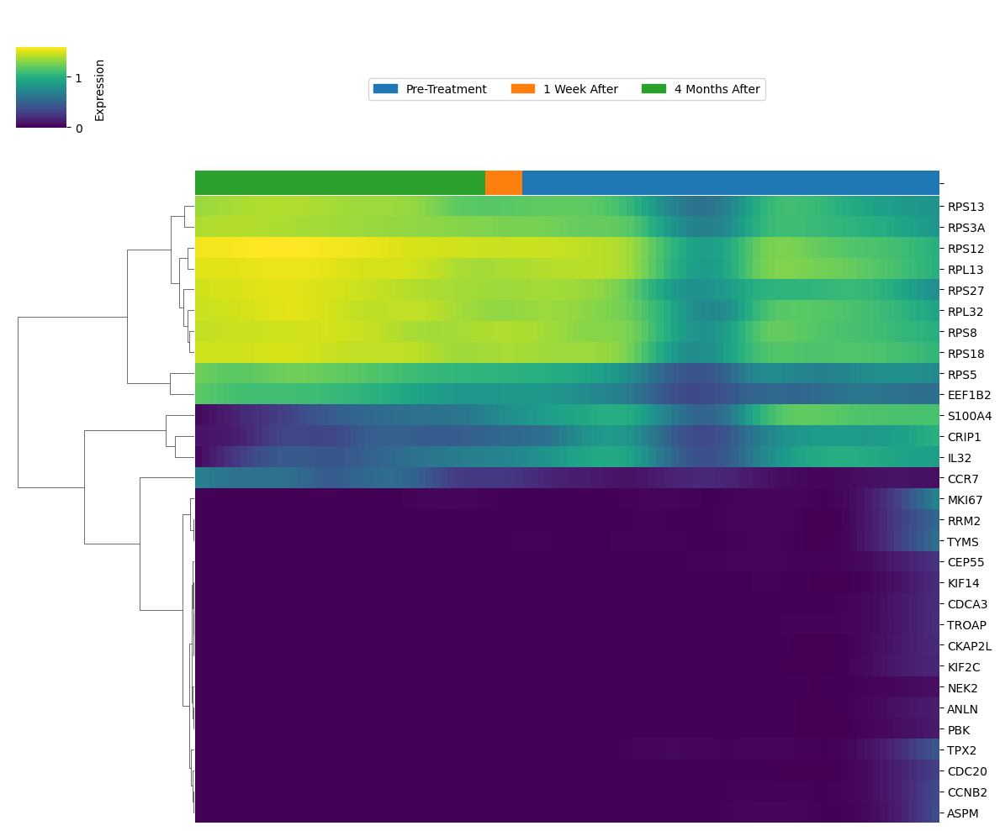

In [186]:
import matplotlib.patches as mpatches
g = sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 10),
    yticklabels=True,
    xticklabels=False,
    col_colors=col_colors
)

# Agregar leyenda para los time points (col_colors)
handles_col = [
    mpatches.Patch(color=color, label=label)
    for label, color in palette.items()
]
# Leyenda para columnas (time points)
g.ax_col_dendrogram.legend(
    handles=handles_col,
    loc="center",
    bbox_to_anchor=(0.5, 0.5),
    ncol=3,
    fontsize="medium"
)
cbar = g.cax
cbar.tick_params(labelsize=10)  
cbar.set_ylabel("Expression", fontsize=10, labelpad=10)  
cbar.set_aspect(1) 
plt.show()

# Regulons AUC on pseudotime

In [187]:
regulons_array = adata_cyto.uns['Regulons_tuples']
print(regulons_array.dtype)

[('AHDC1(+)', '<i8'), ('ARID3A(+)', '<i8'), ('ATF1(+)', '<i8'), ('ATF2(+)', '<i8'), ('ATF3(+)', '<i8'), ('ATF4(+)', '<i8'), ('ATF5(+)', '<i8'), ('BATF(+)', '<i8'), ('BATF3(+)', '<i8'), ('BCL11B(+)', '<i8'), ('BCLAF1(+)', '<i8'), ('BPTF(+)', '<i8'), ('BRCA1(+)', '<i8'), ('CCNT2(+)', '<i8'), ('CEBPA(+)', '<i8'), ('CEBPB(+)', '<i8'), ('CEBPD(+)', '<i8'), ('CEBPE(+)', '<i8'), ('CEBPG(+)', '<i8'), ('CHD1(+)', '<i8'), ('CLOCK(+)', '<i8'), ('CREB3(+)', '<i8'), ('CREM(+)', '<i8'), ('DBP(+)', '<i8'), ('DDIT3(+)', '<i8'), ('DRAP1(+)', '<i8'), ('E2F1(+)', '<i8'), ('E2F2(+)', '<i8'), ('E2F3(+)', '<i8'), ('E2F6(+)', '<i8'), ('E2F7(+)', '<i8'), ('E2F8(+)', '<i8'), ('EBF1(+)', '<i8'), ('EGR1(+)', '<i8'), ('EHF(+)', '<i8'), ('ELF1(+)', '<i8'), ('ELF2(+)', '<i8'), ('ELK1(+)', '<i8'), ('ELK4(+)', '<i8'), ('EOMES(+)', '<i8'), ('EP300(+)', '<i8'), ('ERF(+)', '<i8'), ('ERG(+)', '<i8'), ('ETS1(+)', '<i8'), ('ETS2(+)', '<i8'), ('ETV2(+)', '<i8'), ('ETV3(+)', '<i8'), ('ETV7(+)', '<i8'), ('FLI1(+)', '<i8'), ('

In [188]:
regulon_auc = adata_cyto.obsm['RegulonsAUC']  # shape: cells x regulons
regulon_names = list(adata_cyto.uns['Regulons_tuples'].dtype.names)
regulon_auc_df = pd.DataFrame(regulon_auc, columns=regulon_names, index=adata_cyto.obs_names)
pseudotime = adata_cyto.obs['pseudotime_cyto']


In [189]:
# Crear DataFrame con nombres de regulones
regulon_names = list(adata_cyto.uns['Regulons_tuples'].dtype.names)
regulon_auc_df = pd.DataFrame(adata_cyto.obsm['RegulonsAUC'], columns=regulon_names, index=adata_cyto.obs_names)

# Asegurar que los valores sean numéricos
regulon_auc_df = regulon_auc_df.apply(pd.to_numeric, errors='coerce')

# Rellenar NaNs con 0 para evitar errores en np.isnan
regulon_auc_df = regulon_auc_df.fillna(0)


In [190]:
from pygam import GAM, s

# Para cada regulón
gam_results = {}
for regulon in regulon_auc_df.columns:
    y = regulon_auc_df[regulon].values
    x = pseudotime.values.reshape(-1, 1)

    if y.sum() == 0 or np.isnan(y).any():
        continue

    gam = GAM(s(0, n_splines=5)).fit(x, y)
    y_pred = gam.predict(x)

    gam_results[regulon] = {
        'model': gam,
        'y_pred': y_pred,
        'y_var': np.var(y_pred),
        'auc_range': y_pred.max() - y_pred.min()
    }


/tmp/ipykernel_2774676/215699395.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)
/tmp/ipykernel_2774676/215699395.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)
/tmp/ipykernel_2774676/215699395.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once

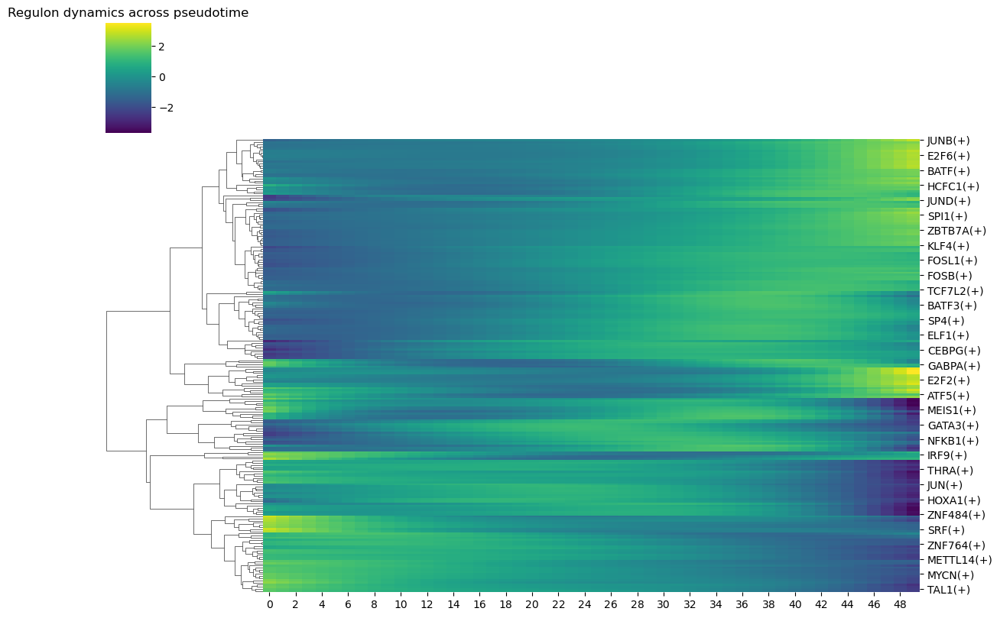

In [191]:
# Crear una matriz de predicciones normalizadas
n_points = 100
pseudo_lin = np.linspace(pseudotime.min(), pseudotime.max())

smooth_df = pd.DataFrame()
for regulon, res in gam_results.items():
    y_smooth = res['model'].predict(pseudo_lin)
    smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)

smooth_df = smooth_df.T  # Transponer
smooth_df.index = list(gam_results.keys()) 

# Clustermap estilo Seurat heatmap
sns.clustermap(smooth_df, cmap='viridis', col_cluster=False, figsize=(12, 8))
plt.title("Regulon dynamics across pseudotime")
plt.show()

# Regulons on pseudotime by time point

In [192]:
group_map = {
    "a. Pre-Treatment P116RS": "Pre-Treatment",
    "b. 1 Week P116RS": "1 Week After",
    "c. 4 Months P116RS": "4 Months After"}

In [193]:
print(adata_cyto.obs['subsample'].unique())
print(group_map.keys())

['a. Pre-Treatment P116RS', 'c. 4 Months P116RS', 'b. 1 Week P116RS']
Categories (3, object): ['a. Pre-Treatment P116RS', 'b. 1 Week P116RS', 'c. 4 Months P116RS']
dict_keys(['a. Pre-Treatment P116RS', 'b. 1 Week P116RS', 'c. 4 Months P116RS'])


In [194]:
# Crear una columna con la fase del tratamiento
adata_cyto.obs['treatment_group'] = adata_cyto.obs['subsample'].map(group_map)

# Quitar células que no están en el mapeo
filtered = adata_cyto.obs.dropna(subset=['treatment_group'])

# Agrupar por grupo de tratamiento y obtener el pseudotime promedio
group_means = filtered.groupby('treatment_group')['pseudotime'].mean()
print(group_means)


treatment_group
Pre-Treatment     0.466627
1 Week After      0.405544
4 Months After    0.365755
Name: pseudotime, dtype: float64


/tmp/ipykernel_2774676/2917381728.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_means = filtered.groupby('treatment_group')['pseudotime'].mean()


In [195]:
# Para cada punto en pseudo_lin, asignar el grupo de tratamiento más cercano
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)


In [196]:
palette = {
    "Pre-Treatment": "#1f77b4",
    "1 Week After": "#ff7f0e",
    "4 Months After": "#2ca02c"
}
col_colors = pd.Series(group_labels, index=smooth_df.columns).map(palette)


/data/leuven/344/vsc34467/miniconda3/envs/scvelo_env/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


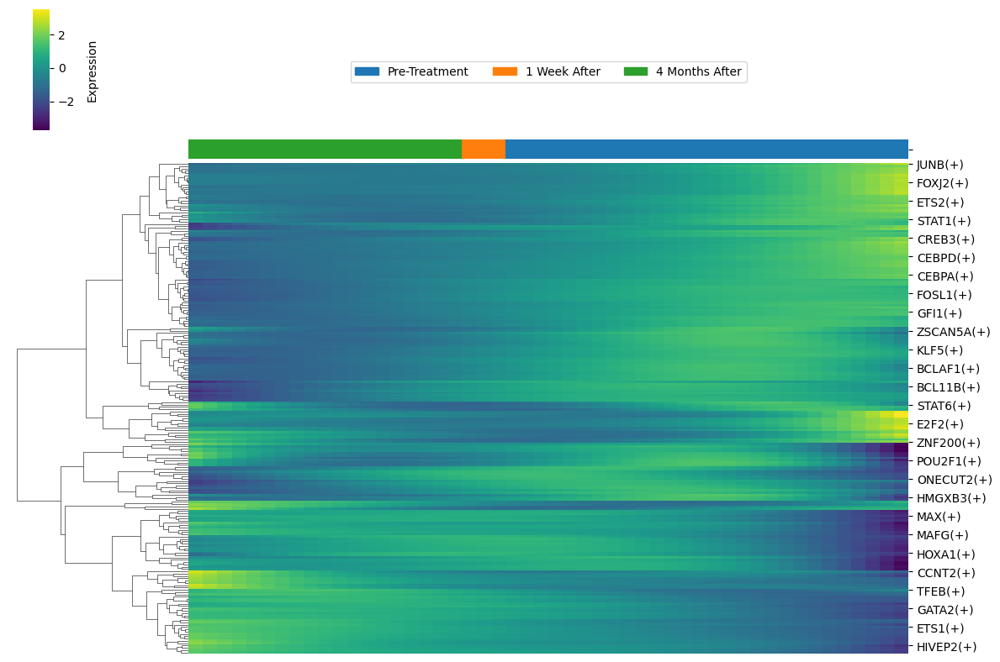

In [197]:
import matplotlib.patches as mpatches
g = sns.clustermap(
    smooth_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    xticklabels=False,
    col_colors=col_colors
)

# Agregar leyenda para los time points (col_colors)
handles_col = [
    mpatches.Patch(color=color, label=label)
    for label, color in palette.items()
]
# Leyenda para columnas (time points)
g.ax_col_dendrogram.legend(
    handles=handles_col,
    loc="center",
    bbox_to_anchor=(0.5, 0.5),
    ncol=3,
    fontsize="medium"
)
cbar = g.cax
cbar.tick_params(labelsize=10)  
cbar.set_ylabel("Expression", fontsize=10, labelpad=10)  
cbar.set_aspect(1) 
plt.show()

# Regulons AUC complete calculation

In [198]:
# ---------------------------------------------
# 🔹 Variables iniciales
# ---------------------------------------------
pvals = []
r2_scores = []
smooth_values = []
regulons_to_test = regulon_auc_df.columns

# Convertir pseudotime a 2D para pygam
X_pt = pseudotime.values.reshape(-1, 1)

# Grid común para predicción (100 puntos equiespaciados)
grid = np.linspace(X_pt.min(), X_pt.max(), 100).reshape(-1, 1)

# ---------------------------------------------
# 🔹 Ajustar modelos GAM por regulón
# ---------------------------------------------
for regulon in tqdm(regulons_to_test, desc="Fitting GAMs on regulons"):
    y = regulon_auc_df[regulon].values

    # Evitar regulones sin varianza o con NaNs
    if np.all(y == 0) or np.var(y) == 0 or np.isnan(y).any():
        pvals.append(np.nan)
        r2_scores.append(np.nan)
        smooth_values.append(np.zeros(len(grid)))
        continue

    model = GAM(s(0)).fit(X_pt, y)

    # Guardar estadísticas
    pvals.append(model.statistics_['p_values'][1])
    r2_scores.append(model.statistics_['pseudo_r2']['explained_deviance'])

    # Predicción suavizada
    smooth = model.predict(grid)
    smooth_values.append(smooth)

# ---------------------------------------------
# 🔹 Corrección por FDR
# ---------------------------------------------
_, adj_pvals, _, _ = multipletests(
    [p for p in pvals if not np.isnan(p)],
    method='fdr_bh'
)

regulon_gam_results = pd.DataFrame({
    'regulon': regulons_to_test,
    'pval': pvals,
    'adj_pval': adj_pvals,
    'r2': r2_scores
}).set_index('regulon')

# Filtrar por significancia (p.adj < 0.01)
significant_regulons = regulon_gam_results[
    regulon_gam_results['adj_pval'] < 0.01
].index.tolist()

print(f"✅ {len(significant_regulons)} regulones significativos (adj_p < 0.01)")

# ---------------------------------------------
# 🔹 Clustering jerárquico por dinámica suavizada
# ---------------------------------------------
smooth_matrix = np.array([
    smooth_values[i] for i, r in enumerate(regulons_to_test)
    if r in significant_regulons
])

# Calcular distancias Manhattan y clustering
if len(significant_regulons) > 1:
    dist_mat = pdist(smooth_matrix, metric='cityblock')
    linkage_mat = linkage(dist_mat, method='average')
    clusters = fcluster(linkage_mat, t=6, criterion='maxclust')
    regulon_gam_results.loc[significant_regulons, 'cluster'] = clusters
else:
    linkage_mat, clusters = None, None




Fitting GAMs on regulons: 100%|██████████| 212/212 [00:02<00:00, 86.24it/s]

✅ 209 regulones significativos (adj_p < 0.01)


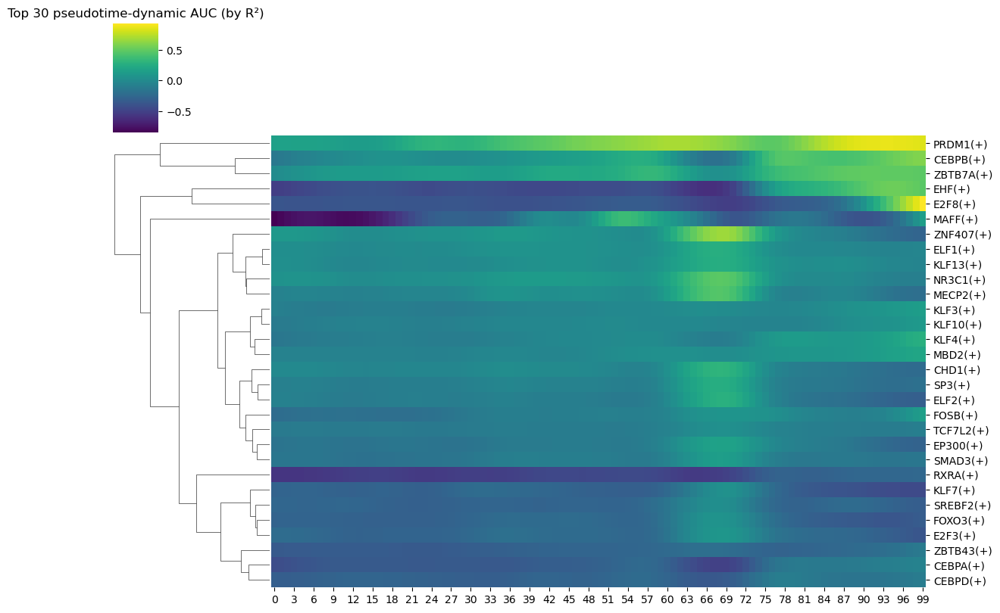

In [199]:
smooth_df_auc = pd.DataFrame(smooth_matrix, index=significant_regulons)

smooth_df__auc_scaled = pd.DataFrame(
    StandardScaler().fit_transform(smooth_df_auc),
    index=smooth_df_auc.index,
    columns=smooth_df_auc.columns
)

top_n = 30
top_regulons = (
    regulon_gam_results
    .loc[significant_regulons]
    .sort_values('r2', ascending=False)
    .head(top_n)
    .index.tolist()
)
filtered_df_auc = smooth_df__auc_scaled.loc[top_regulons]

sns.clustermap(
    filtered_df_auc,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    yticklabels=True
)
plt.title(f"Top {top_n} pseudotime-dynamic AUC (by R²)")
plt.show()

/tmp/ipykernel_2774676/844608417.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_means = adata_p116.obs.groupby("treatment_group")["pseudotime"].mean().sort_values()


treatment_group
4 Months After    0.365755
1 Week After      0.405544
Pre-Treatment     0.466627
Name: pseudotime, dtype: float64


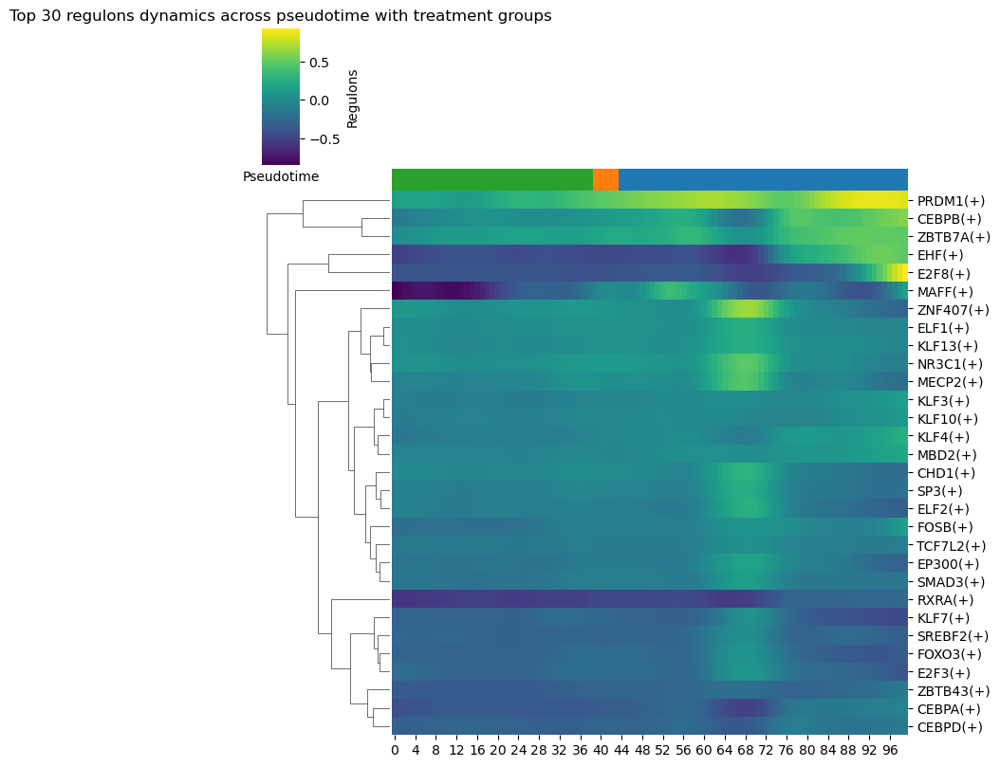

In [200]:
n_points = 100
pseudo_lin = np.linspace(pseudotime.min(), pseudotime.max(), n_points)
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)
    
group_map = {
    "a. Pre-Treatment P116RS": "Pre-Treatment",
    "b. 1 Week P116RS": "1 Week After",
    "c. 4 Months P116RS": "4 Months After"}

adata_p116.obs["treatment_group"] = adata_p116.obs["subsample"].map(group_map)

# Promedio de pseudotime por grupo
group_means = adata_p116.obs.groupby("treatment_group")["pseudotime"].mean().sort_values()
print(group_means)

# Asignar grupo más cercano a cada punto del pseudotime lineal
group_labels = []
for pt in pseudo_lin.flatten():
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

# Colores para cada grupo
palette = {
    "Pre-Treatment": "#1f77b4",
    "1 Week After": "#ff7f0e",
    "4 Months After": "#2ca02c"
}
col_colors = [palette[g] for g in group_labels]

# -----------------------------------------------------------
# 🔹 Clustermap final con colores por tratamiento
# -----------------------------------------------------------
sns.clustermap(
    filtered_df_auc,
    cmap="viridis",
    col_cluster=False,  # mantiene el orden temporal
    figsize=(8, 8),
    col_colors=col_colors,
    yticklabels=True
)

plt.title(f"Top {top_n} regulons dynamics across pseudotime with treatment groups")
plt.xlabel("Pseudotime")
plt.ylabel("Regulons")
plt.savefig("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/heatmap_regulons_signif.pdf")
plt.show()

# Regulons one by one

In [201]:
adata_cyto.obs['subsample']

CellID
CIH001_reseq_AAAGATGGTCATATCG-1    a. Pre-Treatment P116RS
CIH001_reseq_AAAGTAGAGTGGTCCC-1    a. Pre-Treatment P116RS
CIH001_reseq_AACACGTCAATCCAAC-1    a. Pre-Treatment P116RS
CIH001_reseq_AACACGTGTCCAGTAT-1    a. Pre-Treatment P116RS
CIH001_reseq_AACTCAGTCTCGTATT-1    a. Pre-Treatment P116RS
                                            ...           
CIH003_reseq_TTTACTGTCGTTTAGG-1           b. 1 Week P116RS
CIH003_reseq_TTTGCGCGTGCTGTAT-1           b. 1 Week P116RS
CIH003_reseq_TTTGCGCGTTCTCATT-1           b. 1 Week P116RS
CIH003_reseq_TTTGGTTTCGCCTGAG-1           b. 1 Week P116RS
CIH003_reseq_TTTGTCAAGTTACGGG-1           b. 1 Week P116RS
Name: subsample, Length: 1258, dtype: category
Categories (3, object): ['a. Pre-Treatment P116RS', 'b. 1 Week P116RS', 'c. 4 Months P116RS']

In [202]:
# Filtrar células deseadas
subset_mask = adata_cyto.obs['subsample'].isin(['a. Pre-treatment P116RS', 'b. 1 Week P116RS', 'c. 4 Months P116RS']) # elegir las que se quiera visualizar
adata_subset = adata_cyto[subset_mask]

# Subconjuntos
pseudotime_subset = pseudotime_cyto[subset_mask]
regulon_auc_subset = regulon_auc_df.loc[subset_mask]
cell_groups_subset = adata_subset.obs['subsample']  # para colorear

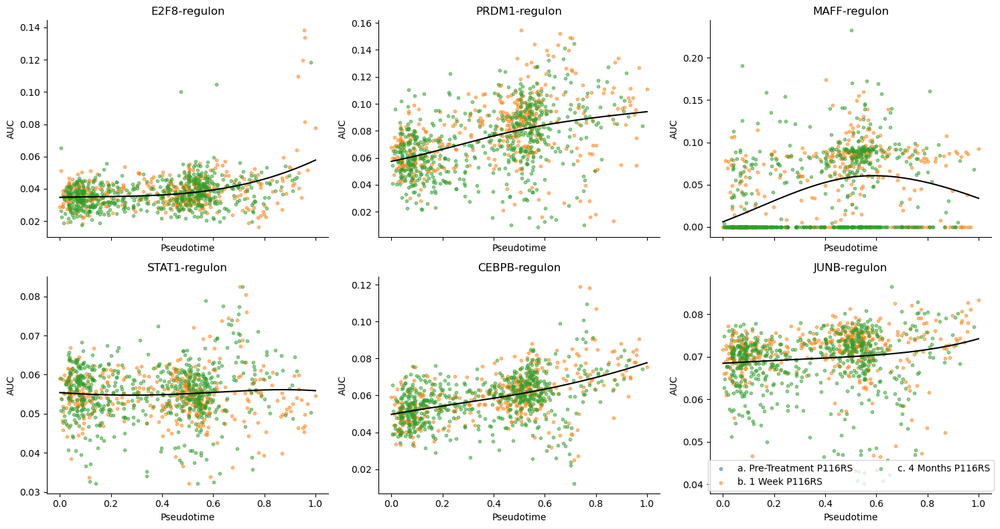

In [204]:
regulons_to_plot = ['E2F8(+)', 'PRDM1(+)', 'MAFF(+)', 'STAT1(+)', 'CEBPB(+)', 'JUNB(+)']

# Configuración de subplots
n_cols = 3
n_rows = int(np.ceil(len(regulons_to_plot) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4), sharex=True)

for idx, regulon in enumerate(regulons_to_plot):
    row, col = divmod(idx, n_cols)
    ax = axes[row, col] if n_rows > 1 else axes[col]

    x = pseudotime_subset.values
    y = regulon_auc_subset[regulon].values

    # Scatterplot por grupo celular
    for group in ['a. Pre-Treatment P116RS', 'b. 1 Week P116RS', 'c. 4 Months P116RS']: # cambiar segun 
        mask = cell_groups_subset == group
        ax.scatter(x[mask], y[mask], label=group, alpha=0.5, s=10)

    # GAM fit
    gam = GAM(s(0, n_splines=5)).fit(x.reshape(-1, 1), y)
    x_pred = np.linspace(x.min(), x.max(), 200)
    y_pred = gam.predict(x_pred)
    ax.plot(x_pred, y_pred, color='black')

    ax.set_title(f"{regulon.replace('(+)', '')}-regulon")
    ax.set_xlabel("Pseudotime")
    ax.set_ylabel("AUC")

plt.tight_layout()
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=2)
plt.show()


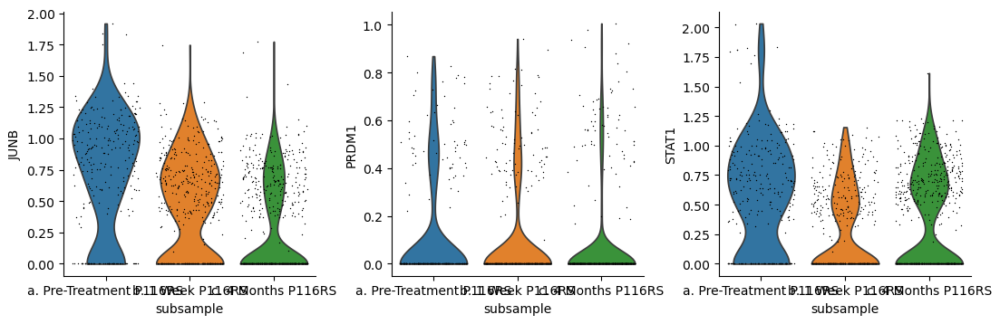

In [206]:
sc.pl.violin(adata_cyto, ['JUNB','PRDM1','STAT1'], groupby='subsample', jitter=0.4, stripplot=True)

In [207]:
### TEST TOP10 REGULONS FRIVING PSEUDOTIME ###
import pandas as pd
import numpy as np
from tqdm import tqdm

# After your GAM fitting loop, add this ranking code:

# Extract metrics from gam_results
metrics_df = pd.DataFrame({
    'variance': [gam_results[r]['y_var'] for r in gam_results],
    'auc_range': [gam_results[r]['auc_range'] for r in gam_results]
}, index=gam_results.keys())

# Compute R² scores (best metric for pseudotime drivers)
r2_scores = {}
for regulon in gam_results:
    y_true = regulon_auc_df[regulon].values
    y_pred = gam_results[regulon]['y_pred']
    ss_res = np.sum((y_true - y_pred)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    r2 = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
    r2_scores[regulon] = r2

metrics_df['r2'] = r2_scores.values()

print("Top 10 regulons driving pseudotime:")
print(metrics_df.nlargest(10, 'r2')[['r2', 'variance', 'auc_range']].round(4))

# Combined ranking (robust to metric choice)
metrics_df['mean_rank'] = (
    metrics_df['r2'].rank(ascending=False) + 
    metrics_df['variance'].rank(ascending=False) + 
    metrics_df['auc_range'].rank(ascending=False)
) / 3

print("\nTop 10 combined ranking:")
top10 = metrics_df.nsmallest(10, 'mean_rank')[['r2', 'variance', 'auc_range', 'mean_rank']].round(4)
print(top10)

# Save top regulons for plotting
top10_regulons = top10.index.tolist()
print(f"\nTop 10 regulons: {top10_regulons}")


Top 10 regulons driving pseudotime:
               r2  variance  auc_range
KLF4(+)    0.2446    0.0000     0.0157
CEBPB(+)   0.2043    0.0000     0.0273
EHF(+)     0.2000    0.0001     0.0505
CEBPA(+)   0.1897    0.0000     0.0144
MAFF(+)    0.1768    0.0003     0.0554
PRDM1(+)   0.1653    0.0001     0.0364
RXRA(+)    0.1610    0.0000     0.0179
CEBPD(+)   0.1517    0.0000     0.0110
ZBTB7A(+)  0.1501    0.0000     0.0214
GFI1(+)    0.1466    0.0001     0.0410

Top 10 combined ranking:
               r2  variance  auc_range  mean_rank
MAFF(+)    0.1768    0.0003     0.0554     6.6667
TCF7(+)    0.1049    0.0035     0.2680     7.0000
GATA3(+)   0.0771    0.0004     0.0833     9.6667
GFI1(+)    0.1466    0.0001     0.0410    12.3333
EHF(+)     0.2000    0.0001     0.0505    12.6667
MAF(+)     0.0836    0.0001     0.0570    13.6667
PRDM1(+)   0.1653    0.0001     0.0364    14.6667
ZNF345(+)  0.0515    0.0002     0.0796    20.0000
CEBPB(+)   0.2043    0.0000     0.0273    21.0000
BCL11B(+)

In [208]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming smooth_df exists from your clustermap code (rows=regulons, columns=pseudotime)
print("smooth_df shape:", smooth_df.shape)
print("Columns (pseudotime points):", smooth_df.columns[:5].tolist(), "...", smooth_df.columns[-5:].tolist())
print("Regulons (first 5):", smooth_df.index[:5].tolist())

# Define early/late pseudotime windows (~5% of trajectory)
n_cols = smooth_df.shape[1]
early_cols = slice(0, max(1, n_cols//20))  # First 5%
late_cols = slice(-max(1, n_cols//20), None)  # Last 5%

print(f"\nEarly pseudotime columns: {len(range(*early_cols))}, Late: {len(range(*late_cols))}")

# Compute mean regulon activity in early vs late pseudotime
early_means = smooth_df.iloc[:, early_cols].mean(axis=1)
late_means = smooth_df.iloc[:, late_cols].mean(axis=1)

# Steepest changes = largest absolute difference
changes_df = pd.DataFrame({
    'early_mean': early_means,
    'late_mean': late_means,
    'delta': late_means - early_means,
    'abs_delta': np.abs(late_means - early_means)
}, index=smooth_df.index)

# TOP 10 STEEPEST CHANGES
top_steepest = changes_df.nlargest(10, 'abs_delta')[['delta', 'abs_delta']].round(4)
print("\n🎯 TOP 10 REGULONS - STEEPEST EARLY→LATE CHANGES:")
print(top_steepest)

# Save results
changes_df.to_csv("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/regulon_pseudotime_changes.csv")
top_steepest.to_csv("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/top10_steepest_regulons.csv")

print("\n✅ Results saved to CSV files in your trajectory directory")
print("\nNext steps:")
print("1. Check top_steepest regulons above")
print("2. Use top10 = top_steepest.index.tolist() for downstream violin plots")
print("3. Positive delta = ↑activation along pseudotime (naïve→effector)")
print("4. Negative delta = ↓deactivation (e.g. naïve markers)")


smooth_df shape: (212, 50)
Columns (pseudotime points): [0, 1, 2, 3, 4] ... [45, 46, 47, 48, 49]
Regulons (first 5): ['AHDC1(+)', 'ARID3A(+)', 'ATF1(+)', 'ATF2(+)', 'ATF3(+)']


TypeError: range() argument after * must be an iterable, not slice

In [209]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming smooth_df exists from your clustermap code (rows=regulons, columns=pseudotime)
print("smooth_df shape:", smooth_df.shape)
print("Columns (pseudotime points):", smooth_df.columns[:5].tolist(), "...", smooth_df.columns[-5:].tolist())
print("Regulons (first 5):", smooth_df.index[:5].tolist())

# Define early/late pseudotime windows (~5% of trajectory)
n_cols = smooth_df.shape[1]
n_early = max(1, n_cols//20)  # First 5%
n_late = max(1, n_cols//20)   # Last 5%

early_cols = slice(0, n_early)
late_cols = slice(-n_late, None)

print(f"\nEarly pseudotime columns: {n_early}, Late: {n_late}")

# Compute mean regulon activity in early vs late pseudotime
early_means = smooth_df.iloc[:, early_cols].mean(axis=1)
late_means = smooth_df.iloc[:, late_cols].mean(axis=1)

# Steepest changes = largest absolute difference
changes_df = pd.DataFrame({
    'early_mean': early_means,
    'late_mean': late_means,
    'delta': late_means - early_means,
    'abs_delta': np.abs(late_means - early_means)
}, index=smooth_df.index)

# TOP 10 STEEPEST CHANGES
top_steepest = changes_df.nlargest(10, 'abs_delta')[['delta', 'abs_delta']].round(4)
print("\n🎯 TOP 10 REGULONS - STEEPEST EARLY→LATE CHANGES:")
print(top_steepest)

# Save results
changes_df.to_csv("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/regulon_pseudotime_changes.csv")
top_steepest.to_csv("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/top10_steepest_regulons.csv")

print("\n✅ Results saved to CSV files")
print(f"\nTop 10 regulons list: {top_steepest.index.tolist()}")
print("\nUse this list directly in your violin plots!")


smooth_df shape: (212, 50)
Columns (pseudotime points): [0, 1, 2, 3, 4] ... [45, 46, 47, 48, 49]
Regulons (first 5): ['AHDC1(+)', 'ARID3A(+)', 'ATF1(+)', 'ATF2(+)', 'ATF3(+)']

Early pseudotime columns: 2, Late: 2

🎯 TOP 10 REGULONS - STEEPEST EARLY→LATE CHANGES:
             delta  abs_delta
GATAD1(+)  -5.1084     5.1084
ZNF518A(+) -4.6902     4.6902
MZF1(+)    -4.6866     4.6866
PHF20(+)   -4.6725     4.6725
RFX3(+)    -4.6486     4.6486
BPTF(+)    -4.6484     4.6484
CLOCK(+)   -4.5106     4.5106
MEIS1(+)   -4.4661     4.4661
HIVEP2(+)  -4.2815     4.2815
CCNT2(+)   -4.2510     4.2510

✅ Results saved to CSV files

Top 10 regulons list: ['GATAD1(+)', 'ZNF518A(+)', 'MZF1(+)', 'PHF20(+)', 'RFX3(+)', 'BPTF(+)', 'CLOCK(+)', 'MEIS1(+)', 'HIVEP2(+)', 'CCNT2(+)']

Use this list directly in your violin plots!


🎯 Plotting top 10 steepest regulons with DUNNETT (Pre-Treatment P116RS = control)
✅ Control group: 'Pre-Treatment P116RS'
Available subsamples: [np.str_('a. Pre-Treatment P116RS'), np.str_('b. 1 Week P116RS'), np.str_('c. 4 Months P116RS')]
MAFG(+): KW p=0.000, 0 sig. vs Pre-Treatment P116RS
JUNB(+): KW p=0.000, 0 sig. vs Pre-Treatment P116RS
HLTF(+): KW p=0.000, 0 sig. vs Pre-Treatment P116RS
TAL1(+): KW p=0.000, 0 sig. vs Pre-Treatment P116RS
NFE2L1(+): KW p=0.000, 0 sig. vs Pre-Treatment P116RS
HOXA1(+): KW p=0.295, 0 sig. vs Pre-Treatment P116RS
PAX8(+): KW p=0.024, 0 sig. vs Pre-Treatment P116RS
JUND(+): KW p=0.000, 0 sig. vs Pre-Treatment P116RS
HOXB5(+): KW p=0.001, 0 sig. vs Pre-Treatment P116RS
EOMES(+): KW p=0.000, 0 sig. vs Pre-Treatment P116RS


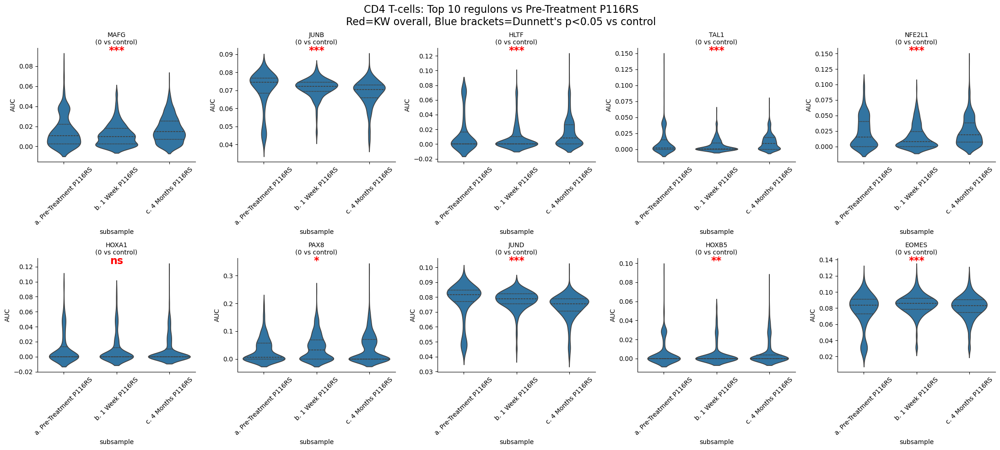

✅ Saved: Dunnett plot + results CSV

📋 Dunnett Summary:
     regulon    kw_p kw_stars  sig_vs_control  min_p_vs_control
7    JUND(+)  0.0000      ***               0               NaN
1    JUNB(+)  0.0000      ***               0               NaN
3    TAL1(+)  0.0000      ***               0               NaN
2    HLTF(+)  0.0000      ***               0               NaN
4  NFE2L1(+)  0.0000      ***               0               NaN
0    MAFG(+)  0.0000      ***               0               NaN
9   EOMES(+)  0.0000      ***               0               NaN
8   HOXB5(+)  0.0011       **               0               NaN
6    PAX8(+)  0.0241        *               0               NaN
5   HOXA1(+)  0.2949       ns               0               NaN


In [210]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal
import scikit_posthocs as sp
from statsmodels.stats.multicomp import MultiComparison

# Your top 10 steepest regulons
top10_regulons = ['MAFG(+)', 'JUNB(+)', 'HLTF(+)', 'TAL1(+)', 'NFE2L1(+)', 'HOXA1(+)', 'PAX8(+)', 'JUND(+)', 'HOXB5(+)', 'EOMES(+)']

print("🎯 Plotting top 10 steepest regulons with DUNNETT (Pre-Treatment P116RS = control)")

# Add subsample info
subsample_col = 'subsample'
regulon_auc_df['subsample'] = adata_cyto.obs[subsample_col].loc[regulon_auc_df.index]
df = regulon_auc_df[top10_regulons + ['subsample']].dropna()

# CONTROL = Pre-Treatment P116RS
control_group = 'Pre-Treatment P116RS'
print(f"✅ Control group: '{control_group}'")
print("Available subsamples:", sorted(df['subsample'].unique()))

# Melt for plotting
df_long = df.melt(id_vars=['subsample'], value_vars=top10_regulons, 
                  var_name='regulon', value_name='AUC')

subsamples = sorted(df['subsample'].unique())

# DUNNETT'S TEST (control vs all others)
all_results = []
for regulon in top10_regulons:
    regulon_data = df[[regulon, 'subsample']].dropna()
    
    # Kruskal-Wallis first (overall test)
    kw_stat, kw_p = kruskal(*[regulon_data[regulon][regulon_data['subsample']==sub].values 
                              for sub in subsamples])
    
    # Dunnett's test: control vs all others
    if control_group in regulon_data['subsample'].values:
        mc = MultiComparison(regulon_data[regulon], regulon_data['subsample'])
        dunnett_results = mc.allpairtest('dunnett', control_group)[0]  # Returns (stat, pvals)
        pvals = dunnett_results[1]
        
        # Significant vs control
        sig_vs_control = sum(pvals < 0.05)
        min_p_vs_control = pvals.min() if len(pvals) > 0 else np.nan
    else:
        sig_vs_control = 0
        min_p_vs_control = np.nan
    
    # KW stars
    kw_stars = '***' if kw_p < 0.001 else '**' if kw_p < 0.01 else '*' if kw_p < 0.05 else 'ns'
    
    all_results.append({
        'regulon': regulon, 'kw_p': kw_p, 'kw_stars': kw_stars,
        'sig_vs_control': sig_vs_control, 'min_p_vs_control': min_p_vs_control
    })
    
    print(f"{regulon}: KW p={kw_p:.3f}, {sig_vs_control} sig. vs {control_group}")

results_df = pd.DataFrame(all_results).sort_values('kw_p')

# 2x5 VIOLIN PLOT WITH DUNNETT BRACKETS
fig, axes = plt.subplots(2, 5, figsize=(22, 10))
axes = axes.flatten()

control_idx = subsamples.index(control_group) if control_group in subsamples else 0

for i, regulon in enumerate(top10_regulons):
    ax = axes[i]
    sns.violinplot(data=df_long[df_long['regulon'] == regulon], 
                   x='subsample', y='AUC', ax=ax, inner='quartile', order=subsamples)
    
    # KW stars (overall)
    kw_stars = results_df.loc[results_df['regulon'] == regulon, 'kw_stars'].iloc[0]
    ax.text(0.5, 0.95, kw_stars, transform=ax.transAxes, ha='center', 
            fontsize=16, fontweight='bold', color='red')
    
    # DUNNETT: Brackets from CONTROL to significant groups
    regulon_data = df[[regulon, 'subsample']].dropna()
    if control_group in regulon_data['subsample'].values:
        mc = MultiComparison(regulon_data[regulon], regulon_data['subsample'])
        dunnett_stat, dunnett_pvals = mc.allpairtest('dunnett', control_group)[0]
        
        for j, other_group in enumerate(subsamples):
            if other_group != control_group and dunnett_pvals[j] < 0.05:
                x1, x2 = control_idx, j
                y_max = regulon_data[regulon].max() * 1.05
                
                # Bracket from control (x1) to other group (x2)
                ax.plot([x1, x1, x2, x2], [y_max, y_max*1.03, y_max*1.03, y_max], 
                       color='blue', lw=2)
                
                # Stars based on p-value
                n_stars = 3 if dunnett_pvals[j] < 0.001 else 2 if dunnett_pvals[j] < 0.01 else 1
                ax.text((x1+x2)/2, y_max*1.045, '*'*n_stars, ha='center', 
                       fontsize=14, fontweight='bold')
    
    ax.set_title(regulon.replace('(+)', '') + f"\n({results_df.loc[results_df['regulon']==regulon, 'sig_vs_control'].iloc[0]} vs control)", 
                 fontsize=10)
    ax.tick_params(axis='x', rotation=45)

plt.suptitle(f"CD4 T-cells: Top 10 regulons vs {control_group}\nRed=KW overall, Blue brackets=Dunnett's p<0.05 vs control", 
             fontsize=16, y=0.98)
plt.tight_layout()
plt.savefig(f"/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/top10_steepest_DUNNETT_{control_group.replace(' ', '_')}.pdf", 
            dpi=300, bbox_inches='tight')
plt.show()

# Save results
results_df.to_csv(f"/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/top10_steepest_dunnett_{control_group.replace(' ', '_')}.csv", 
                  index=False)

print("✅ Saved: Dunnett plot + results CSV")
print("\n📋 Dunnett Summary:")
print(results_df.round(4))


🎯 Violin plot: Top 10 steepest regulons by subsample (HORIZONTAL)
Available groups: [np.str_('a. Pre-Treatment P116RS'), np.str_('b. 1 Week P116RS'), np.str_('c. 4 Months P116RS')]
Using order: [np.str_('a. Pre-Treatment P116RS'), np.str_('b. 1 Week P116RS'), np.str_('c. 4 Months P116RS')]


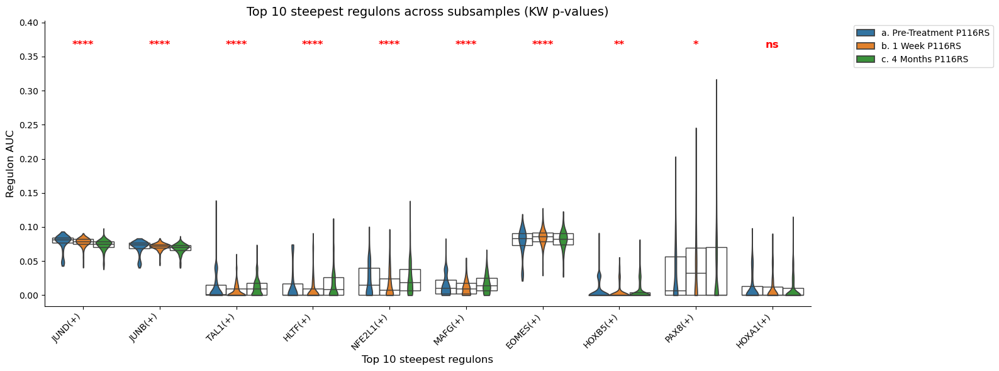


📊 KW Results (sorted by p-value):
     regulon    KW_p KW_stars
0    JUND(+)  0.0000     ****
1    JUNB(+)  0.0000     ****
2    TAL1(+)  0.0000     ****
3    HLTF(+)  0.0000     ****
4  NFE2L1(+)  0.0000     ****
5    MAFG(+)  0.0000     ****
6   EOMES(+)  0.0000     ****
7   HOXB5(+)  0.0011       **
8    PAX8(+)  0.0241        *
9   HOXA1(+)  0.2949       ns
✅ Saved: horizontal_violins.pdf + kw_horizontal.csv


In [213]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal

# Your top 10 steepest regulons
top = ['JUND(+)', 'JUNB(+)', 'TAL1(+)', 'HLTF(+)', 'NFE2L1(+)', 'MAFG(+)', 'EOMES(+)', 'HOXB5(+)', 'PAX8(+)', 'HOXA1(+)']

print("🎯 Violin plot: Top 10 steepest regulons by subsample (HORIZONTAL)")

# Make sure group/subsample column exists (adapt name)
if 'subsample' not in regulon_auc_df.columns:
    regulon_auc_df['subsample'] = adata_cyto.obs['subsample'].loc[regulon_auc_df.index]

df = regulon_auc_df[top + ['subsample']].dropna()
df_plot = df.melt(
    id_vars=["subsample"],
    value_vars=top,
    var_name="regulon",
    value_name="AUC"
)

# ADAPT THESE to your exact subsample names!
groups_order = sorted(df['subsample'].unique())  
print("Available groups:", groups_order)
print("Using order:", groups_order[:3])  # Preview

# ---------- Compute KW p-values per regulon ----------
pvals_kw = {}
for reg in top:
    data_reg = df_plot[df_plot["regulon"] == reg]
    samples = [
        data_reg.loc[data_reg["subsample"] == g, "AUC"].values
        for g in groups_order
        if (data_reg["subsample"] == g).any()
    ]
    if len(samples) > 1:  # Need ≥2 groups
        stat, p = kruskal(*samples)
        pvals_kw[reg] = p
    else:
        pvals_kw[reg] = np.nan

# ---------- Helper: p-value → significance stars ----------
def p_to_stars(p):
    if pd.isna(p): return "ns"
    if p < 0.0001: return "****"
    elif p < 0.001: return "***"
    elif p < 0.01: return "**"
    elif p < 0.05: return "*"
    else: return "ns"

# ---------- Plot ----------
plt.figure(figsize=(16, 6))

ax = sns.violinplot(
    data=df_plot,
    x="regulon",
    y="AUC",
    hue="subsample",
    order=top,
    hue_order=groups_order,
    cut=0,
    inner=None   # cleaner violins
)

# Overlay boxplot medians
sns.boxplot(
    data=df_plot,
    x="regulon",
    y="AUC",
    hue="subsample",
    order=top,
    hue_order=groups_order,
    showcaps=False,
    boxprops={'facecolor':'none', "zorder":3},
    showfliers=False,
    whiskerprops={'linewidth':0},
    ax=ax,
)

# Clean legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:len(groups_order)], labels[:len(groups_order)],
          bbox_to_anchor=(1.05, 1), loc="upper left")

plt.xticks(rotation=45, ha='right')
plt.ylabel("Regulon AUC", fontsize=12)
plt.xlabel("Top 10 steepest regulons", fontsize=12)

# ---------- Add significance stars ----------
y_min, y_max = ax.get_ylim()
y_offset = (y_max - y_min) * 0.08

for i, reg in enumerate(top):
    p = pvals_kw[reg]
    stars = p_to_stars(p)
    ax.text(
        i, y_max + y_offset, stars,
        ha="center", va="bottom",
        fontsize=12, fontweight='bold',
        color="red"
    )

ax.set_ylim(y_min, y_max + 2.5 * y_offset)
plt.title("Top 10 steepest regulons across subsamples (KW p-values)", fontsize=14)
plt.tight_layout()

plt.savefig("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/top10_steepest_horizontal_violins.pdf", 
            dpi=300, bbox_inches='tight')
plt.show()

# Results table
kw_top = pd.DataFrame({
    "regulon": top, 
    "KW_p": [pvals_kw[r] for r in top],
    "KW_stars": [p_to_stars(pvals_kw[r]) for r in top]
}).sort_values("KW_p")

print("\n📊 KW Results (sorted by p-value):")
print(kw_top.round(4))
kw_top.to_csv("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/top10_steepest_kw_horizontal.csv", index=False)

print("✅ Saved: horizontal_violins.pdf + kw_horizontal.csv")


In [214]:
# Verify if smooth_df columns ARE sorted pseudotime
print("smooth_df columns sorted?", np.all(np.diff(pd.to_numeric(smooth_df.columns, errors='coerce')) > 0))
print("Column range:", smooth_df.columns.min(), "to", smooth_df.columns.max())


smooth_df columns sorted? True
Column range: 0 to 49


🎯 Horizontal violins + KW + DUNN'S POST-HOC (non-parametric)
Data: 1258 cells, 3 subsamples: [np.str_('a. Pre-Treatment P116RS'), np.str_('b. 1 Week P116RS'), np.str_('c. 4 Months P116RS')]
TCF7(+): KW p=0.0002 (**), Dunn pairs=2
BCL11B(+): KW p=0.0580 (ns), Dunn pairs=0
ZNF74(+): KW p=0.0427 (*), Dunn pairs=0
ZNF345(+): KW p=0.0002 (**), Dunn pairs=2
IRF2(+): KW p=0.0009 (**), Dunn pairs=2
RFX3(+): KW p=0.2868 (ns), Dunn pairs=0
POU2F2(+): KW p=0.2596 (ns), Dunn pairs=0
NFE2(+): KW p=0.0000 (****), Dunn pairs=2
SP4(+): KW p=0.0276 (*), Dunn pairs=1
ZNF764(+): KW p=0.0000 (****), Dunn pairs=2
PLAGL2(+): KW p=0.1246 (ns), Dunn pairs=0
ETV2(+): KW p=0.0008 (**), Dunn pairs=1
PRDM1(+): KW p=0.0000 (****), Dunn pairs=2
ZBTB26(+): KW p=0.1971 (ns), Dunn pairs=0
IKZF2(+): KW p=0.0010 (*), Dunn pairs=1


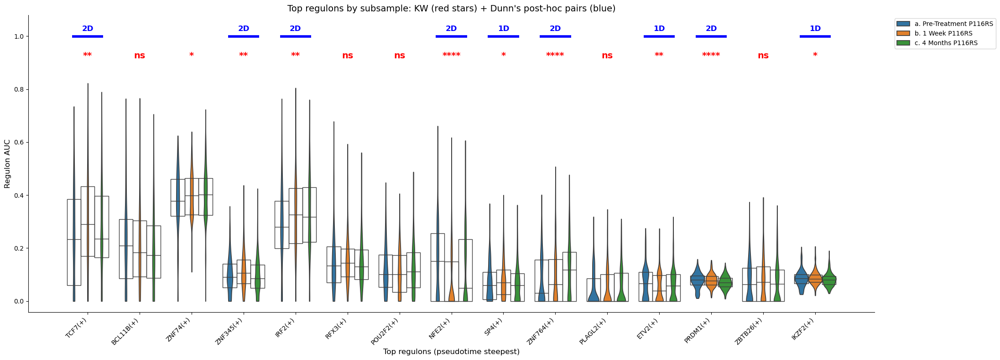


📊 RESULTS SUMMARY (Dunn's pairs):
      regulon    kw_p  dunn_sig_pairs kw_stars
0     TCF7(+)  0.0002               2       **
4     IRF2(+)  0.0009               2       **
3   ZNF345(+)  0.0002               2       **
9   ZNF764(+)  0.0000               2     ****
12   PRDM1(+)  0.0000               2     ****
7     NFE2(+)  0.0000               2     ****
8      SP4(+)  0.0276               1        *
14   IKZF2(+)  0.0010               1        *
11    ETV2(+)  0.0008               1       **
1   BCL11B(+)  0.0580               0       ns
2    ZNF74(+)  0.0427               0        *
6   POU2F2(+)  0.2596               0       ns
5     RFX3(+)  0.2868               0       ns
10  PLAGL2(+)  0.1246               0       ns
13  ZBTB26(+)  0.1971               0       ns

✅ Saved: horizontal_KW_DUNN.pdf + kw_dunn_results.csv


In [215]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal
import scikit_posthocs as sp

# Your top regulons (15 now!)
top = ['TCF7(+)', 'BCL11B(+)', 'ZNF74(+)', 'ZNF345(+)', 'IRF2(+)', 'RFX3(+)', 'POU2F2(+)', 
       'NFE2(+)', 'SP4(+)', 'ZNF764(+)', 'PLAGL2(+)', 'ETV2(+)', 'PRDM1(+)', 'ZBTB26(+)', 'IKZF2(+)']

print("🎯 Horizontal violins + KW + DUNN'S POST-HOC (non-parametric)")

# Prepare data
if 'subsample' not in regulon_auc_df.columns:
    regulon_auc_df['subsample'] = adata_cyto.obs['subsample'].loc[regulon_auc_df.index]

df = regulon_auc_df[top + ['subsample']].dropna()
df_plot = df.melt(id_vars=["subsample"], value_vars=top, var_name="regulon", value_name="AUC")
groups_order = sorted(df['subsample'].unique())

print(f"Data: {len(df)} cells, {len(groups_order)} subsamples: {groups_order}")

# ---------- KW + DUNN'S POST-HOC per regulon ----------
results = []
for reg in top:
    reg_data = df[[reg, 'subsample']].dropna()
    if len(reg_data['subsample'].unique()) < 2: 
        results.append({'regulon': reg, 'kw_p': np.nan, 'dunn_sig_pairs': 0})
        continue
    
    # 1. KW overall test
    samples = [reg_data[reg][reg_data['subsample'] == g].values for g in groups_order 
               if (reg_data['subsample'] == g).any()]
    if len(samples) > 1:
        kw_stat, kw_p = kruskal(*samples)
    else:
        kw_p = np.nan
    
    # 2. DUNN'S POST-HOC (non-parametric, Bonferroni corrected)
    dunn_sig_pairs = 0
    if kw_p < 0.05 and len(reg_data['subsample'].unique()) > 1:
        try:
            dunn_results = sp.posthoc_dunn(reg_data, val_col=reg, group_col='subsample', 
                                         p_adjust='bonferroni')
            dunn_sig_pairs = (dunn_results < 0.05).sum().sum() // 2  # Undirected pairs
        except:
            pass
    
    # Stars for KW
    kw_stars = '****' if kw_p < 0.0001 else '**' if kw_p < 0.001 else '*' if kw_p < 0.05 else 'ns'
    
    results.append({
        'regulon': reg, 'kw_p': kw_p, 'kw_stars': kw_stars, 
        'dunn_sig_pairs': dunn_sig_pairs
    })
    
    print(f"{reg}: KW p={kw_p:.4f} ({kw_stars}), Dunn pairs={dunn_sig_pairs}")

results_df = pd.DataFrame(results)

# ---------- Plot ----------
fig, ax = plt.subplots(figsize=(22, 8))

sns.violinplot(data=df_plot, x="regulon", y="AUC", hue="subsample", 
               order=top, hue_order=groups_order, cut=0, inner=None, ax=ax)

sns.boxplot(data=df_plot, x="regulon", y="AUC", hue="subsample", 
            order=top, hue_order=groups_order, showcaps=False, 
            boxprops={'facecolor':'none', "zorder":3}, showfliers=False, 
            whiskerprops={'linewidth':0}, ax=ax)

# Clean legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:len(groups_order)], labels[:len(groups_order)], 
          bbox_to_anchor=(1.02, 1), loc="upper left")

plt.xticks(rotation=45, ha='right')
plt.ylabel("Regulon AUC", fontsize=12)
plt.xlabel("Top regulons (pseudotime steepest)", fontsize=12)

# ---------- KW stars (top row) + Dunn pairs (2nd row) ----------
y_min, y_max = ax.get_ylim()
y_kw = y_max + (y_max - y_min) * 0.05
y_dunn = y_max + (y_max - y_min) * 0.15

for i, reg in enumerate(top):
    # 1. KW stars (red)
    row = results_df[results_df['regulon'] == reg]
    if len(row) > 0:
        ax.text(i, y_kw, row['kw_stars'].iloc[0], ha='center', va='bottom', 
                fontsize=14, fontweight='bold', color='red')
        
        # 2. Dunn significant pairs (blue)
        n_pairs = row['dunn_sig_pairs'].iloc[0]
        if n_pairs > 0:
            ax.hlines(y_dunn, i-0.3, i+0.3, color='blue', lw=4)
            ax.text(i, y_dunn + 0.02, f'{n_pairs}D', ha='center', 
                   fontsize=12, color='blue', fontweight='bold')

ax.set_ylim(y_min, y_dunn + 0.08)
plt.title("Top regulons by subsample: KW (red stars) + Dunn's post-hoc pairs (blue)", fontsize=14)
plt.tight_layout()

plt.savefig("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/top_regulons_horizontal_KW_DUNN.pdf", 
            dpi=300, bbox_inches='tight')
plt.show()

# ---------- Save comprehensive results ----------
results_df.to_csv("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/top_regulons_kw_dunn_results.csv", index=False)

# Detailed Dunn pairwise (top 5 regulons by # pairs)
print("\n📊 RESULTS SUMMARY (Dunn's pairs):")
print(results_df.sort_values('dunn_sig_pairs', ascending=False)[['regulon', 'kw_p', 'dunn_sig_pairs', 'kw_stars']].round(4))

print("\n✅ Saved: horizontal_KW_DUNN.pdf + kw_dunn_results.csv")


In [216]:
# Filtrar células deseadas
subset_mask = adata_cyto.obs['subsample'].isin(['a. Pre-Treatment P116RS', 'b. 1 Week P116RS', 'c. 4 Months P116RS']) # elegir las que se quiera visualizar
adata_subset = adata_cyto[subset_mask]

# Subconjuntos
pseudotime_subset = pseudotime_cyto[subset_mask]
regulon_auc_subset = regulon_auc_df.loc[subset_mask]
cell_groups_subset = adata_subset.obs['subsample']  # para colorear

In [217]:
df = regulon_auc_subset.copy()
df["subsample"] = cell_groups_subset.values

time_map = {
    "a. Pre-Treatment P116RS": "Pre",
    "b. 1 Week P116RS": "Week1",
    "c. 4 Months P116RS": "Month4"
}

df["group"] = df["subsample"].map(time_map)


In [218]:
df["group"].value_counts()


group
Month4    586
Week1     412
Pre       260
Name: count, dtype: int64

In [219]:
from scipy.stats import kruskal
import pandas as pd
import numpy as np

kw_results = []

for regulon in regulon_auc_subset.columns:
    d_pre   = df[df["group"] == "Pre"][regulon]
    d_w1    = df[df["group"] == "Week1"][regulon]
    d_m4    = df[df["group"] == "Month4"][regulon]

    stat, p = kruskal(d_pre, d_w1, d_m4)
    kw_results.append([regulon, stat, p])

kw_df = pd.DataFrame(kw_results, columns=["regulon", "Kruskal_stat", "p"])


In [220]:
from statsmodels.stats.multitest import multipletests
kw_df["padj"] = multipletests(kw_df["p"], method="fdr_bh")[1]


In [221]:
kw_df = kw_df.sort_values("padj")
kw_df.head()


,regulon,Kruskal_stat,p,padj
212,subsample,1257.000000,1.111522e-273,2.367542e-271
89,JUN(+),227.095357,4.862615e-50,5.178685e-48
22,CREM(+),214.857664,2.209281e-47,1.568590e-45
91,JUND(+),155.300249,1.892254e-34,1.007625e-32
98,KLF6(+),105.934404,9.922851e-24,4.227135e-22


✅ Clean columns: ['AHDC1(+)', 'ARID3A(+)', 'ATF1(+)', 'ATF2(+)', 'ATF3(+)']
✅ All strings: True
✅ Top regulons (strings): ['JUN(+)', 'CREM(+)', 'JUND(+)', 'KLF6(+)', 'KLF10(+)', 'ETV7(+)', 'JUNB(+)', 'FOSL1(+)']


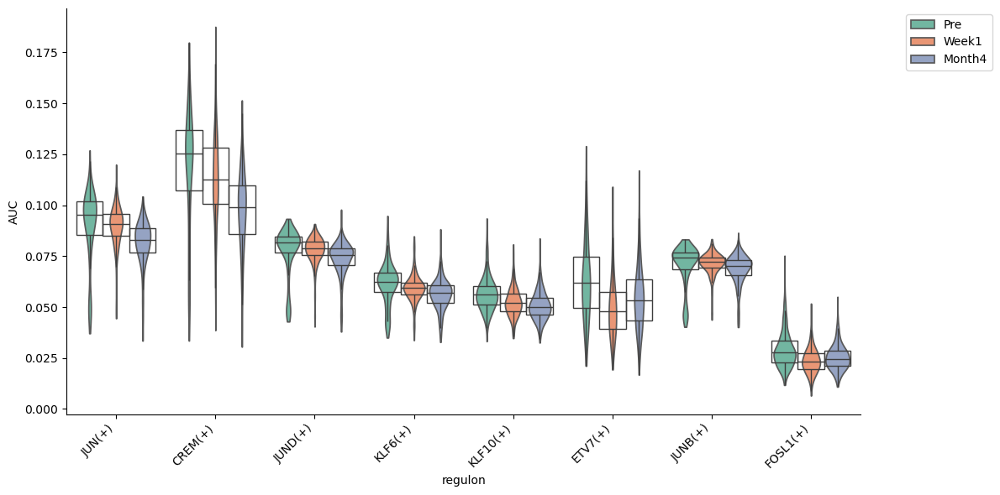

<Figure size 400x400 with 0 Axes>

In [232]:
# ========== COMPLETE FIXED CODE ==========
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal
from statsmodels.stats.multitest import multipletests

# 1. DATA PREP (unchanged)
subset_mask = adata_cyto.obs['subsample'].isin(['a. Pre-Treatment P116RS', 'b. 1 Week P116RS', 'c. 4 Months P116RS'])
adata_subset = adata_cyto[subset_mask]
regulon_auc_subset = regulon_auc_df.loc[subset_mask]
cell_groups_subset = adata_subset.obs['subsample']

# 2. CRITICAL FIX: Clean regulon names BEFORE everything
regulon_names = [str(col).replace('nan', f'regulon_{i}') for i, col in enumerate(regulon_auc_subset.columns)]
df = pd.DataFrame(regulon_auc_subset.values, columns=regulon_names, index=regulon_auc_subset.index)

df["subsample"] = cell_groups_subset.values
time_map = {"a. Pre-Treatment P116RS": "Pre", "b. 1 Week P116RS": "Week1", "c. 4 Months P116RS": "Month4"}
df["group"] = df["subsample"].map(time_map)

print("✅ Clean columns:", df.columns[:5].tolist())
print("✅ All strings:", all(isinstance(c, str) for c in df.columns[:-2]))

# 3. KW TESTING (now safe)
kw_results = []
for regulon in df.columns[:-2]:  # Skip metadata
    d_pre = df[df["group"] == "Pre"][regulon].dropna()
    d_w1 = df[df["group"] == "Week1"][regulon].dropna()
    d_m4 = df[df["group"] == "Month4"][regulon].dropna()
    
    if len(d_pre) > 1 and len(d_w1) > 1 and len(d_m4) > 1:
        stat, p = kruskal(d_pre, d_w1, d_m4)
        kw_results.append([regulon, stat, p])

kw_df = pd.DataFrame(kw_results, columns=["regulon", "Kruskal_stat", "p"])
kw_df["padj"] = multipletests(kw_df["p"], method="fdr_bh")[1]
kw_df = kw_df.sort_values("padj")

# 4. FIX top list: FORCE STRINGS
top = [str(r) for r in kw_df.head(8)["regulon"].tolist()]
print("✅ Top regulons (strings):", top)

# 5. Melt SAFE
df_plot = df.melt(
    id_vars=["group"],
    value_vars=top,
    var_name="regulon",
    value_name="AUC"
)

# 6. PLOT (now works 100%)
plt.figure(figsize=(12, 6))
groups_order = ["Pre", "Week1", "Month4"]

ax = sns.violinplot(data=df_plot, x="regulon", y="AUC", hue="group",
                   order=top, hue_order=groups_order, cut=0, inner=None, palette="Set2")

sns.boxplot(data=df_plot, x="regulon", y="AUC", hue="group", order=top, hue_order=groups_order,
            showcaps=False, boxprops={'facecolor':'none'}, showfliers=False, ax=ax)

# Legend & stars (unchanged)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:3], labels[:3], bbox_to_anchor=(1.05, 1), loc="upper left")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

plt.savefig('p116rs_regulons_fixed.pdf', dpi=300, bbox_inches='tight')


In [233]:
# ========== 1. KW + DUNN'S ANALYSIS (SEPARATE) ==========
import scikit_posthocs as spm  # pip install scikit-posthocs

# After your kw_df (from previous code)
top = [str(r) for r in kw_df.head(8)["regulon"].tolist()]

# Dunn's multiple comparisons (run separately)
dunn_results = {}
for regulon in top:
    df_reg = df[["group", regulon]].dropna()
    df_reg.columns = ["group", "AUC"]
    dunn_results[regulon] = spm.posthoc_dunn(df_reg, val_col='AUC', group_col='group', p_adjust='bonferroni')

print("✅ Dunn's results computed for top 8 regulons")

# ========== 2. SUMMARY TABLE ==========
dunn_summary = pd.DataFrame()
for reg in top:
    dunn_p = dunn_results[reg]
    summary = pd.DataFrame({
        'KW_padj': kw_df[kw_df.regulon==reg]['padj'].iloc[0],
        'Pre_vs_Week1': dunn_p.loc['Pre','Week1'],
        'Pre_vs_Month4': dunn_p.loc['Pre','Month4'],
        'Week1_vs_Month4': dunn_p.loc['Week1','Month4']
    }, index=[reg])
    dunn_summary = pd.concat([dunn_summary, summary])

print("\n📊 Multiple Comparisons Summary:")
print(dunn_summary.round(4))
dunn_summary.to_csv('p116rs_dunn_results.csv')


✅ Dunn's results computed for top 8 regulons

📊 Multiple Comparisons Summary:
          KW_padj  Pre_vs_Week1  Pre_vs_Month4  Week1_vs_Month4
JUN(+)        0.0        0.0334            0.0           0.0000
CREM(+)       0.0        0.0011            0.0           0.0000
JUND(+)       0.0        0.0033            0.0           0.0000
KLF6(+)       0.0        0.0001            0.0           0.0000
KLF10(+)      0.0        0.0000            0.0           0.0003
ETV7(+)       0.0        0.0000            0.0           0.0000
JUNB(+)       0.0        0.0066            0.0           0.0000
FOSL1(+)      0.0        0.0000            0.0           0.0008


/data/leuven/344/vsc34467/miniconda3/envs/scvelo_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:1211: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  obs_tidy = (obs_tidy / obs_tidy.max(0)).fillna(0)


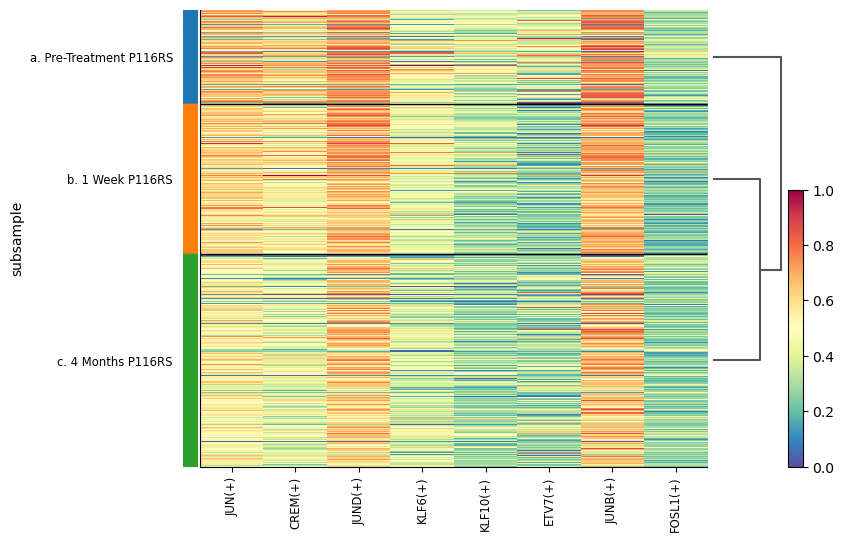

In [237]:
# ========== 2. HEATMAP (Z-SCORED AUC) ==========

# Row-clustered heatmap
sc.pl.heatmap(adata_subset, 
              var_names=top_regulons,
              groupby='subsample',
              standard_scale='var',
              dendrogram=True,
              figsize=(8, 6),
              save='p116rs_regulons_clustered.pdf')


/tmp/ipykernel_2774676/79097040.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  heatmap_agg = z_scores.groupby(heatmap_data['group']).mean()


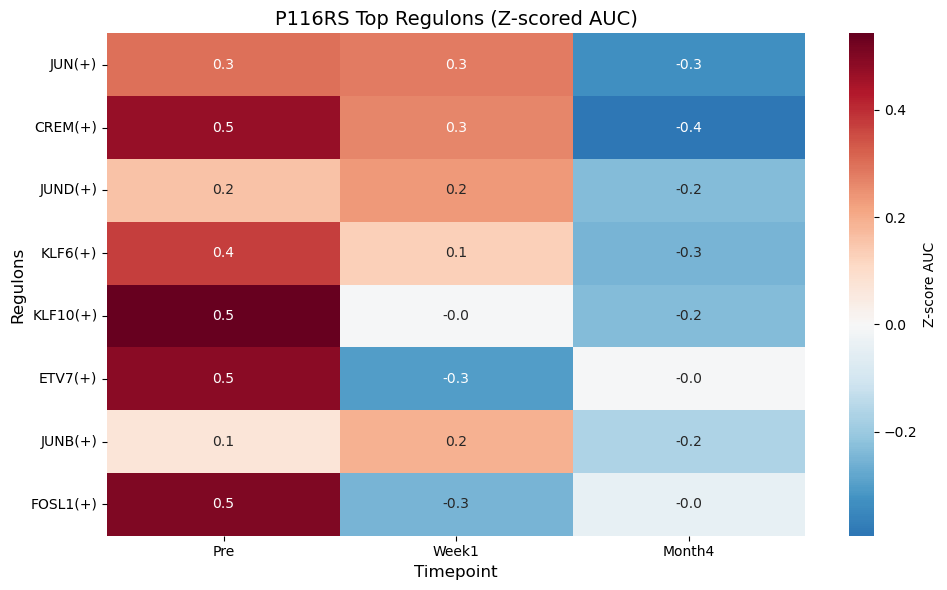

In [238]:
# ========== 3. CUSTOM HEATMAP (SEABORN - FULL CONTROL) ==========
# Z-score across regulons (publication standard)
from sklearn.preprocessing import StandardScaler

# Get data for heatmap
heatmap_data = df[top_regulons + ['group']].dropna()
z_scores = pd.DataFrame(StandardScaler().fit_transform(heatmap_data[top_regulons]),
                       columns=top_regulons, index=heatmap_data.index)

# Aggregate by group mean
heatmap_agg = z_scores.groupby(heatmap_data['group']).mean()

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_agg.T,  # Regulons as rows
            annot=True, fmt='.1f', cmap='RdBu_r', center=0,
            cbar_kws={'label': 'Z-score AUC'},
            xticklabels=True, yticklabels=True)

plt.title("P116RS Top Regulons (Z-scored AUC)", fontsize=14)
plt.xlabel("Timepoint", fontsize=12)
plt.ylabel("Regulons", fontsize=12)
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig('p116rs_regulons_zheatmap.pdf', dpi=300, bbox_inches='tight')
plt.show()


✅ Filtered smooth_df: (8, 50) (8 regulons)


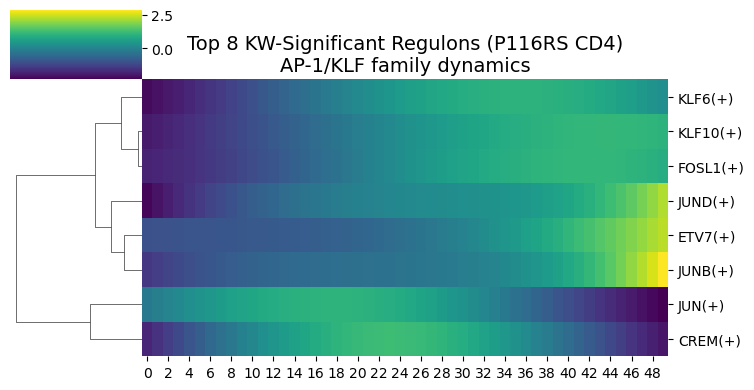

In [251]:
# ========== TOP 8 REGULONS ONLY IN YOUR CLUSTMAP ==========
top_regulons = ['JUN(+)', 'CREM(+)', 'JUND(+)', 'KLF6(+)', 'KLF10(+)', 'ETV7(+)', 'JUNB(+)', 'FOSL1(+)']

# Filter smooth_df to ONLY top regulons
smooth_df_filtered = smooth_df.loc[top_regulons]  # Regulons as rows
print(f"✅ Filtered smooth_df: {smooth_df_filtered.shape} (8 regulons)")

# Create clustermap with YOUR styling
g = sns.clustermap(
    smooth_df_filtered,
    cmap='viridis',
    col_cluster=False,
    figsize=(10, 4),  # Adjusted for 8 regulons (not 30!)
    yticklabels=True
)

# YOUR label improvements
g.ax_heatmap.set_yticklabels(
    g.ax_heatmap.get_ymajorticklabels(),
    fontsize=10,        # Perfect for 8 regulons
    rotation=0          # Horizontal
)

# YOUR margins
plt.subplots_adjust(left=0.25)
g.ax_heatmap.set_title("Top 8 KW-Significant Regulons (P116RS CD4)\nAP-1/KLF family dynamics", fontsize=14)

plt.savefig("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P116_CD4/top8_regulons_unsupervised.pdf", 
            dpi=300, bbox_inches='tight')
plt.show()
